In [4]:
import os
import sys
import h5py
import laspy
import pyproj
import datetime 
import rasterio
import numpy as np
import pandas as pd
import richdem as rd
import rasterio.mask
import rasterio.merge
import seaborn as sns
import rasterio.features
import geopandas as gpd
from pathlib import Path
import contextily as ctx  # For adding a basemap
import statsmodels.api as sm
from rasterio.mask import mask
from rasterio.plot import show
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from pyproj import Transformer, CRS
from rasterstats import zonal_stats 
from rasterstats import point_query
from rasterio.warp import reproject
import matplotlib.patches as patches
from rasterio.enums import Resampling
from scipy.interpolate import griddata
from shapely.geometry import Point, box
from rasterio.plot import plotting_extent
from geoviews import opts, tile_sources as gvts
from matplotlib.patches import Circle, Polygon
from matplotlib.collections import PatchCollection
from shapely.geometry import Polygon as ShpPolygon
from shapely.ops import transform as shp_transform
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

In [5]:
function_path = os.path.expanduser("~/geoscience/carbon_estimation/code/functions")
sys.path.append(function_path)

# Check the default PROJ data directory
print(pyproj.datadir.get_data_dir())

/bsuscratch/tnde/miniforge3/envs/veg_height/share/proj


In [6]:
dtm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/las_dtm/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.tif"
dtm = rd.LoadGDAL(dtm_path)
slope = rd.TerrainAttribute(dtm, attrib='slope_degrees')
slope_raster_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/slope_rasters/slope_USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.tif"
rd.SaveGDAL(slope_raster_path, slope)


A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.107094======================= ] (99% - 0.0s - 1 threads)


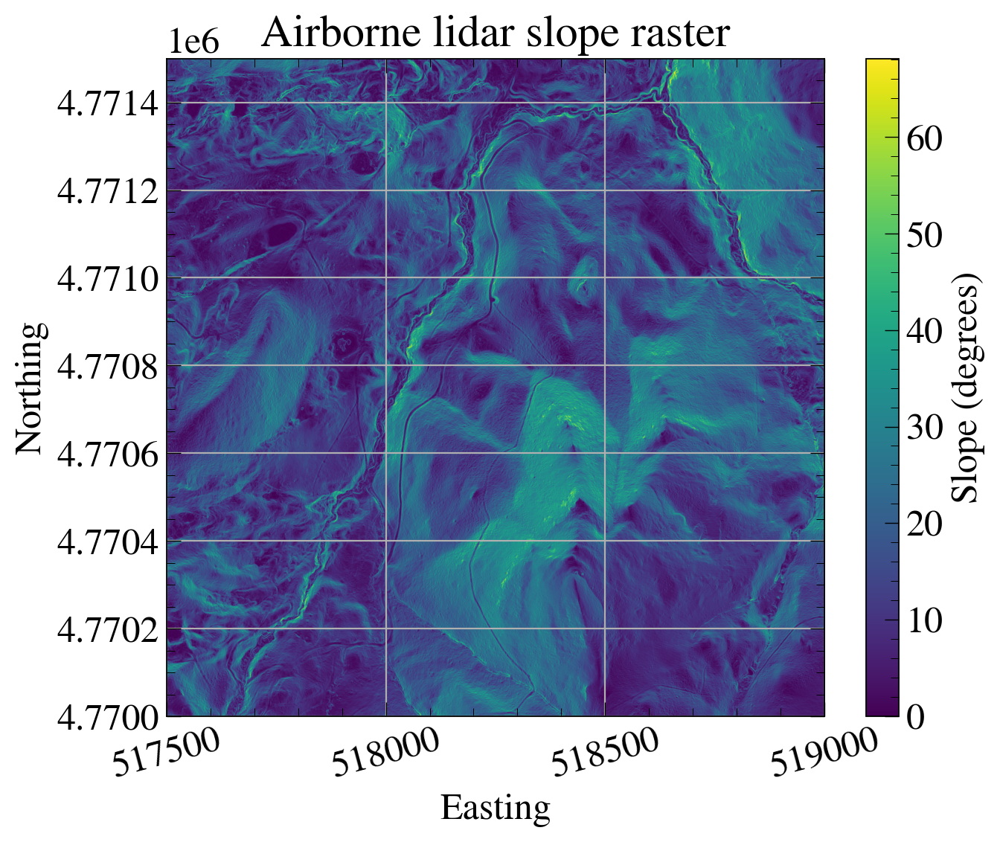

In [7]:
with rasterio.open(slope_raster_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar slope raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Slope (degrees)")
plt.tight_layout(); plt.show()

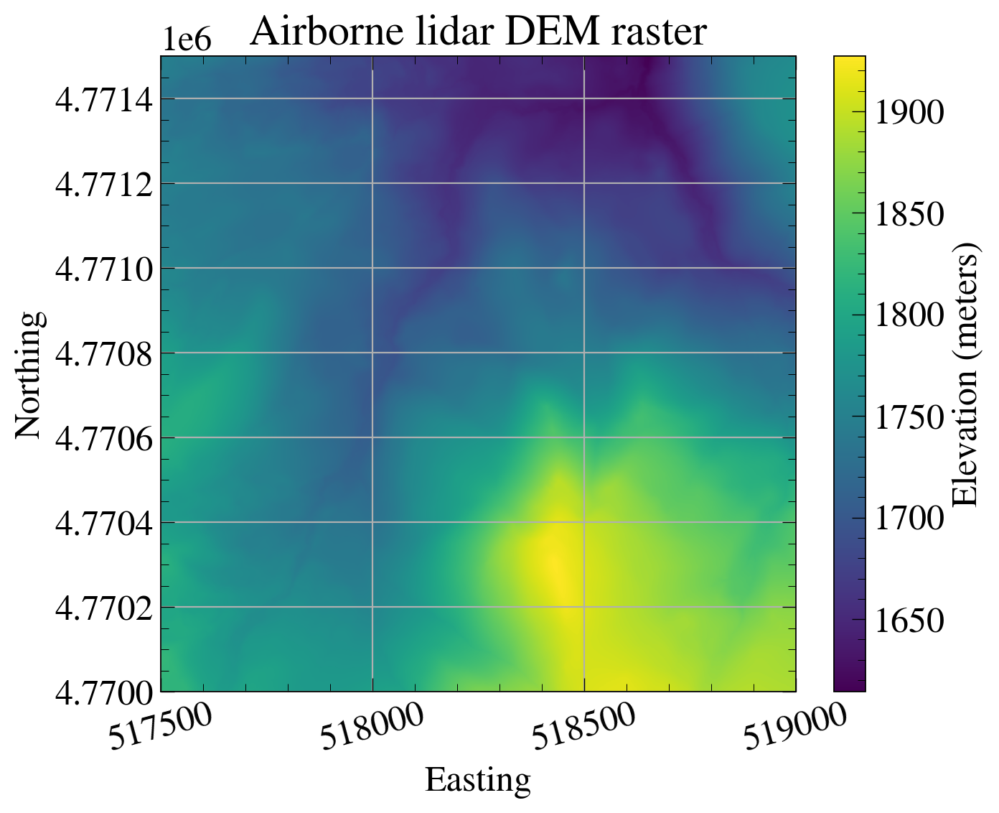

In [8]:
with rasterio.open(dtm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar DEM raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Elevation (meters)")
plt.tight_layout(); plt.show()

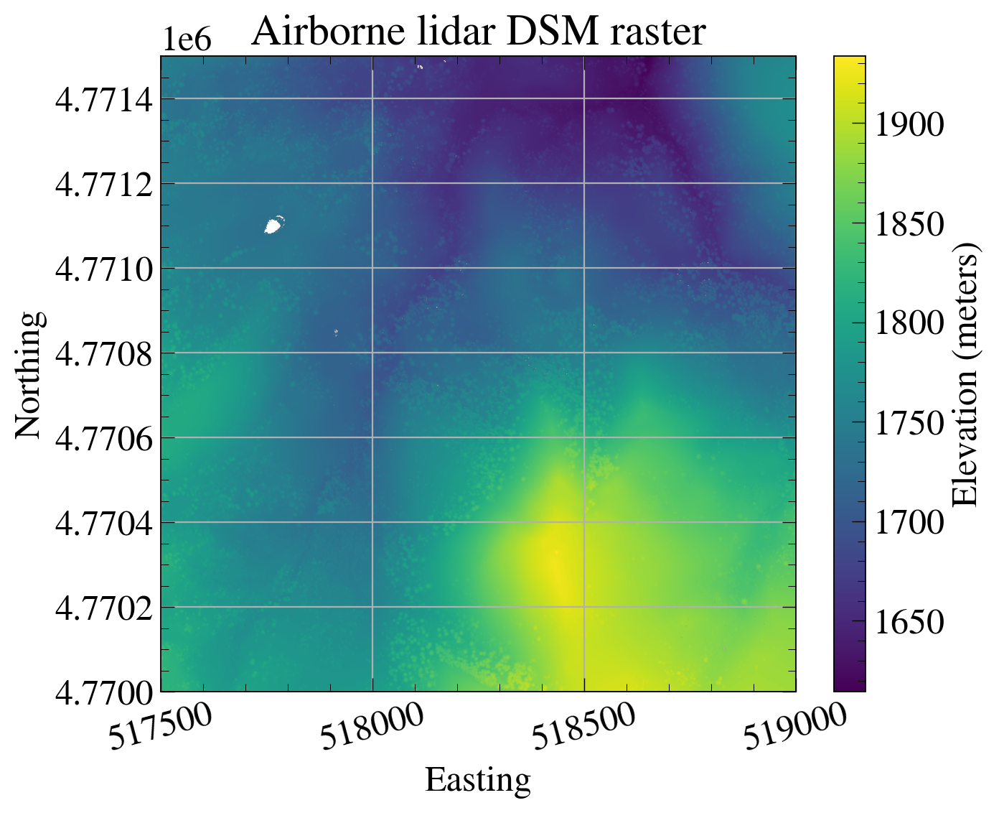

In [9]:
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/lasgrid_dsm/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.tif"
with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar DSM raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Elevation (meters)")
plt.tight_layout(); plt.show()

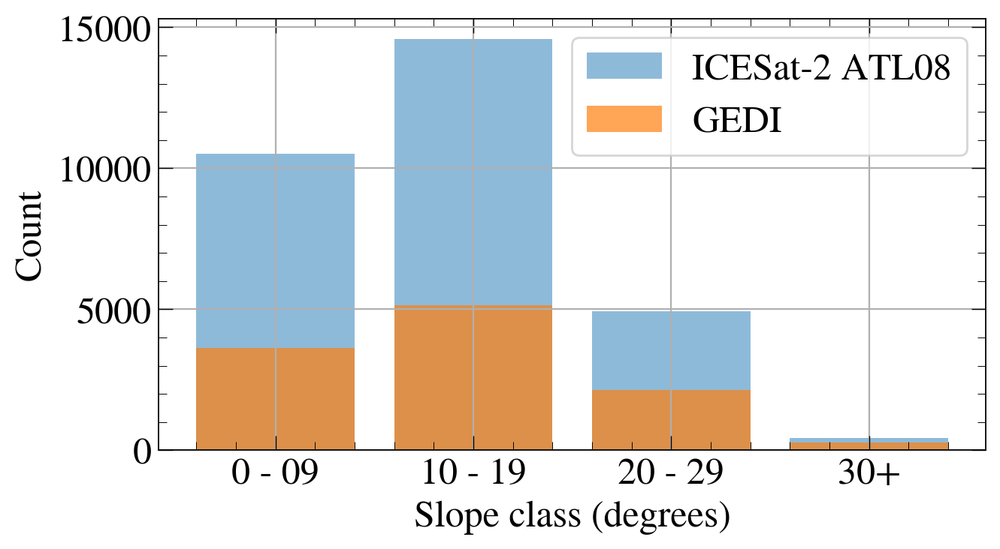

In [10]:
# Slope bins (categories)
slope_bins = ["0 - 09", "10 - 19", "20 - 29", "30+"]

# Counts from your table
atl08_counts = [10515, 14581, 4929, 436]   # ICESat-2 ATL08
gedi_counts  = [3636,  5147,  2128, 277]   # GEDI

# Positions for categorical x-axis
x = np.arange(len(slope_bins))

plt.figure(figsize=(7, 4))

# "Overlayed" histograms: bars on same x, with transparency
plt.bar(x, atl08_counts, alpha=0.5, label="ICESat-2 ATL08")
plt.bar(x, gedi_counts,  alpha=0.7, label="GEDI")

plt.xticks(x, slope_bins)
plt.xlabel("Slope class (degrees)")
plt.ylabel("Count")
# plt.title("Distribution of GEDI and ICESat-2 data across slope classes")
plt.legend()
plt.tight_layout()
plt.show()


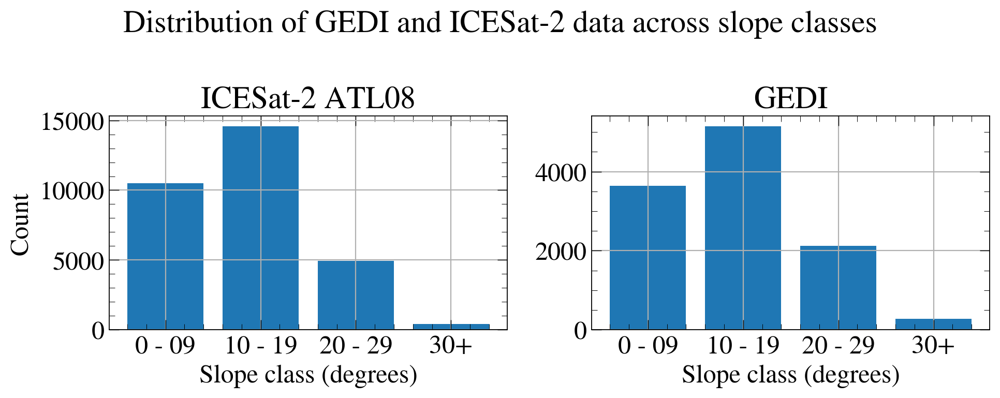

In [11]:
# Slope bins (categories)
slope_bins = ["0 - 09", "10 - 19", "20 - 29", "30+"]

# Counts from your table
atl08_counts = [10515, 14581, 4929, 436]   # ICESat-2 ATL08
gedi_counts  = [3636,  5147,  2128, 277]   # GEDI

# Positions for categorical x-axis
x = np.arange(len(slope_bins))

# Create two subplots side by side, each with its own y-scale
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# ATL08 histogram
ax1.bar(x, atl08_counts)
ax1.set_xticks(x)
ax1.set_xticklabels(slope_bins)
ax1.set_xlabel("Slope class (degrees)")
ax1.set_ylabel("Count")
ax1.set_title("ICESat-2 ATL08")

# GEDI histogram
ax2.bar(x, gedi_counts)
ax2.set_xticks(x)
ax2.set_xticklabels(slope_bins)
ax2.set_xlabel("Slope class (degrees)")
ax2.set_title("GEDI")

# (Optional) explicitly set different y-limits if you want to emphasize patterns
# ax1.set_ylim(0, 16000)
# ax2.set_ylim(0, 6000)

fig.suptitle("Distribution of GEDI and ICESat-2 data across slope classes")
plt.tight_layout()
plt.show()


## Loading ICESat-2 Data

In [12]:
from helper_functions import load_icesat2_data
projected_crs = "epsg:6340" 
icesat2_file = "icesat2_ml_final.geojson"
icesat2_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/"
atl08 = icesat2_dir+f'{icesat2_file}'
atl08

'/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/icesat2_ml_final.geojson'

In [13]:
%%time
icesat2_gdf_atl08 = load_icesat2_data(atl08, "ATL08", process = False)
icesat2_gdf_atl08 = icesat2_gdf_atl08[icesat2_gdf_atl08["gnd_ph_count"] != 0]
icesat2_gdf_atl08 = icesat2_gdf_atl08[icesat2_gdf_atl08["h_mean_canopy"] <= 15]
icesat2_gdf_atl08 = icesat2_gdf_atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
print(f"Length of data: {len(icesat2_gdf_atl08)}")
print(icesat2_gdf_atl08.crs, "\n")
icesat2_gdf_atl08.crs

Length of data: 32814
EPSG:6340 

CPU times: user 2.96 s, sys: 36.1 ms, total: 2.99 s
Wall time: 2.97 s


<Projected CRS: EPSG:6340>
Name: NAD83(2011) / UTM zone 11N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United States (USA) - between 120°W and 114°W onshore and offshore - California, Idaho, Nevada, Oregon, Washington.
- bounds: (-120.0, 30.88, -114.0, 49.01)
Coordinate Operation:
- name: UTM zone 11N
- method: Transverse Mercator
Datum: NAD83 (National Spatial Reference System 2011)
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

## Loading GEDI Data

In [14]:
drop_cols = ["shot_number", "Latitude_l2a", "Longitude_l2a", 
             "rh_85", "rh_90", "rh_98", "rh_99", "GEDI02_A_slope_ratio_utm", 
             "GEDI02_A_slope_rise_run", "cover_z_10", "cover_z_15", "cover_z_20", 
             "cover_z_25", "cover_z_27", "cover_z_28", "pai_z_10", "pai_z_15", 
             "pai_z_20", "pai_z_25", "pai_z_27", "pai_z_28", "pavd_z_10", 
             "pavd_z_15", "pavd_z_20", "pavd_z_25", "pavd_z_27", "pavd_z_28", "rh100"]

In [15]:
target_col = "rh_80" # "rh_100"
gedi_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/"
gedi_file = "gedi_ml2.geojson"
gedi_data = gpd.read_file(os.path.join(gedi_dir, gedi_file))
bbox_gedi = np.min(gedi_data["Easting_l2a"]), np.min(gedi_data["Northing_l2a"]), np.max(gedi_data["Easting_l2a"]), np.max(gedi_data["Northing_l2a"])
# x_min, y_min, x_max, y_max = list(bbox_gedi)
gedi_data = gedi_data.drop(drop_cols, axis = 1)
gedi_data = gedi_data[gedi_data["fhd_normal"] != -9999.000000]
gedi_data = gedi_data[gedi_data[target_col] <= 15]
gedi_data.head()

,date,BEAM_l2a,quality_flag,num_detectedmodes,rh_80,rh_95,rh_100,sensitivity,solar_elevation,Easting_l2a,Northing_l2a,elevation_NAVD88_gedi_from_crs_l2a,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29,geometry
0,2019-07-23 02:29:57,BEAM1011,1,1,1.08,2.21,4.04,0.976120,1.137563,513688.964915,4.795170e+06,1815.427281,0.996506,755.0,0.0,1.417535,-0.0,-0.0,POINT (513688.965 4795169.966)
1,2019-07-23 02:29:57,BEAM1011,1,1,0.97,1.94,3.63,0.975038,1.137287,513736.570004,4.795201e+06,1815.428389,0.001113,749.0,0.0,1.340707,-0.0,-0.0,POINT (513736.57 4795201.316)
2,2019-07-23 02:29:57,BEAM1011,1,1,1.12,2.43,4.90,0.976903,1.137010,513784.205063,4.795233e+06,1814.398598,-1.034706,766.0,0.0,1.658798,-0.0,-0.0,POINT (513784.205 4795232.651)
3,2019-07-23 02:29:57,BEAM1011,1,1,0.93,1.91,3.59,0.971373,1.136734,513831.832065,4.795264e+06,1813.271707,-1.132363,745.0,0.0,1.269725,-0.0,-0.0,POINT (513831.832 4795263.988)
4,2019-07-23 02:29:57,BEAM1011,1,1,0.89,1.83,3.37,0.973743,1.136458,513879.447137,4.795295e+06,1813.272818,0.001117,745.0,0.0,0.790818,-0.0,-0.0,POINT (513879.447 4795295.327)


In [16]:
gedi_data["GEDI02_A_slope_degrees_utm"] = np.abs(gedi_data["GEDI02_A_slope_degrees_utm"])
gedi_data[["GEDI02_A_slope_degrees_utm", "elevation_NAVD88_gedi_from_crs_l2a", "rh_80", "rh_100"]].describe()

,GEDI02_A_slope_degrees_utm,elevation_NAVD88_gedi_from_crs_l2a,rh_80,rh_100
count,1.279200e+04,12792.000000,12792.000000,12792.000000
mean,8.243818e+00,1533.557492,2.138407,6.541472
std,8.460666e+00,254.963717,1.783053,3.255758
min,3.634544e-07,1003.144091,0.440000,1.710000
25%,1.022854e+00,1309.636497,1.212500,4.330000
50%,5.775107e+00,1516.767589,1.610000,5.640000
75%,1.297585e+01,1730.948085,2.310000,7.592500
max,5.399624e+01,2233.850802,14.920000,29.209999


In [17]:
icesat2_gdf_atl08["ICESat2_slope_ratio_utm"]

0        0.049689
1        0.141260
2        0.284689
3        0.020921
4       -0.007162
           ...   
34857    0.004462
34858   -0.004160
34859    0.055037
34860    0.075567
34861    0.138662
Name: ICESat2_slope_ratio_utm, Length: 32814, dtype: float64

## GEDI and ICESat-2 Slopes

In [18]:
icesat2_gdf_atl08["airborne_slope_deg"] = point_query(icesat2_gdf_atl08, slope_raster_path)
gedi_data["airborne_slope_deg"] = point_query(gedi_data, slope_raster_path)

In [19]:
icesat2_clean = icesat2_gdf_atl08[icesat2_gdf_atl08["airborne_slope_deg"].notna()]
icesat2_clean.head()

,time,x_atc,h_min_canopy,h_te_median,gt,spot,rgt,gnd_ph_count,h_mean_canopy,h_canopy,...,Northing,elevation_NAVD88_icesat2_from_pipe,Elevation,Date,date,ICESat2_slope_ratio_utm,ICESat2_slope_degrees_utm,ICESat2_slope_rise_run,geometry,airborne_slope_deg
2795,2019-08-28 20:16:06.685,15275777.0,0.530762,1613.5842,30,3,943,152,2.151666,9.448486,...,4.771423e+06,1629.966505,1630.515373,2019-08-28 20:16:06.685,2019-08-28 20:16:06.685,-0.089917,-5.138040,5.128836,POINT (518561.011 4771423.267),3.461752
2801,2019-08-28 20:16:06.699,15275878.0,0.854370,1632.8213,30,3,943,49,8.786896,13.805908,...,4.771323e+06,1649.200476,1649.749361,2019-08-28 20:16:06.699,2019-08-28 20:16:06.699,-0.086682,-4.954150,3.462567,POINT (518552.081 4771323.205),4.431604
2807,2019-08-28 20:16:06.715,15275987.0,0.503540,1650.9167,30,3,943,72,2.979077,10.497681,...,4.771215e+06,1667.292601,1667.841504,2019-08-28 20:16:06.715,2019-08-28 20:16:06.715,-0.085020,-4.859605,3.191793,POINT (518542.458 4771215.087),9.050568
2813,2019-08-28 20:16:06.728,15276079.0,0.519409,1662.8137,30,3,943,83,3.719914,16.425903,...,4.771123e+06,1679.186746,1679.735665,2019-08-28 20:16:06.728,2019-08-28 20:16:06.728,-0.086480,-4.942645,2.714169,POINT (518534.241 4771123.299),10.482890
2819,2019-08-28 20:16:06.742,15276182.0,0.544800,1693.9248,30,3,943,78,1.865872,9.000855,...,4.771021e+06,1710.294679,1710.843614,2019-08-28 20:16:06.742,2019-08-28 20:16:06.742,-0.079411,-4.540387,2.568656,POINT (518524.774 4771020.993),19.445261


In [20]:
gedi_clean = gedi_data[gedi_data["airborne_slope_deg"].notna()]
gedi_clean.head()

,date,BEAM_l2a,quality_flag,num_detectedmodes,rh_80,rh_95,rh_100,sensitivity,solar_elevation,Easting_l2a,Northing_l2a,elevation_NAVD88_gedi_from_crs_l2a,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29,geometry,airborne_slope_deg
817,2022-08-13 16:16:39,BEAM1011,1,4,10.120000,23.010000,28.80,0.966906,42.418682,517524.933569,4.770911e+06,1771.438932,0.001767,916.0,0.0,3.263339,-0.0,-0.0,POINT (517524.934 4770910.981),12.691871
818,2022-08-13 16:16:39,BEAM1011,1,5,2.200000,15.910000,21.18,0.974506,42.418980,517571.677045,4.770942e+06,1763.532660,8.020265,866.0,0.0,3.034463,-0.0,-0.0,POINT (517571.677 4770942.023),16.400897
819,2022-08-13 16:16:39,BEAM1011,1,1,1.450000,4.780000,15.13,0.968985,42.419277,517618.932605,4.770973e+06,1746.309708,16.879699,763.0,0.0,2.593731,-0.0,-0.0,POINT (517618.933 4770973.464),9.526166
820,2022-08-13 16:16:39,BEAM1011,1,4,8.479999,21.030001,26.41,0.970989,42.419586,517666.179818,4.771005e+06,1741.477695,4.866946,904.0,0.0,3.052333,-0.0,-0.0,POINT (517666.18 4771004.897),13.169409
821,2022-08-13 16:16:39,BEAM1011,1,1,1.830000,4.550000,12.36,0.969421,42.419884,517713.239682,4.771036e+06,1741.479074,0.001399,780.0,0.0,2.529689,-0.0,-0.0,POINT (517713.24 4771036.18),7.471901


In [21]:
with rasterio.open(slope_raster_path) as src:
    r_crs = src.crs
gedi_clean = gedi_clean.to_crs(r_crs)
icesat2_clean = icesat2_clean.to_crs(r_crs)

# build footprint polygons
# GEDI: ~25 m diameter --> 12.5 m radius circle
gedi_fp = gedi_clean.copy()
gedi_fp["geometry"] = gedi_fp.geometry.buffer(12.5)

# ATL08: approximate with a 50 m half-width strip (100 m diameter)
atl08_fp = icesat2_clean.copy()
atl08_fp["geometry"] = atl08_fp.geometry.buffer(50.0)#, cap_style="flat") # ~100 m wide strip

# area-weighted zonal stats over polygons
gedi_stats  = zonal_stats(gedi_fp, slope_raster_path, stats=["mean","std","percentile_95"], nodata=None)
atl08_stats = zonal_stats(atl08_fp, slope_raster_path, stats=["mean","std","percentile_95"], nodata=None)

# attach results
gedi_clean["slope_mean"] = [s["mean"] for s in gedi_stats]
gedi_clean["slope_std"] = [s["std"] for s in gedi_stats]
gedi_clean["slope_percentile_95"] = [s["percentile_95"] for s in gedi_stats]
icesat2_clean["slope_mean"] = [s["mean"] for s in atl08_stats]
icesat2_clean["slope_std"] = [s["std"] for s in atl08_stats]
icesat2_clean["slope_percentile_95"] = [s["percentile_95"] for s in atl08_stats]

In [22]:
icesat2_clean.columns

Index(['time', 'x_atc', 'h_min_canopy', 'h_te_median', 'gt', 'spot', 'rgt',
       'gnd_ph_count', 'h_mean_canopy', 'h_canopy', 'h_max_canopy',
       'snowcover', 'ph_count', 'canopy_h_metrics', 'solar_elevation_x',
       'segment_id', 'veg_ph_count', 'landcover', 'extent_id',
       'canopy_openness', 'cycle', 'num_bins', 'binsize', 'waveform',
       'pce_mframe_cnt', 'solar_elevation_y', 'h_dif_ref', 'Longitude',
       'Latitude', 'Easting', 'Northing', 'elevation_NAVD88_icesat2_from_pipe',
       'Elevation', 'Date', 'date', 'ICESat2_slope_ratio_utm',
       'ICESat2_slope_degrees_utm', 'ICESat2_slope_rise_run', 'geometry',
       'airborne_slope_deg', 'slope_mean', 'slope_std', 'slope_percentile_95'],
      dtype='object')

In [23]:
print(icesat2_clean["airborne_slope_deg"].describe())
print(icesat2_clean["h_mean_canopy"].describe())


count    55.000000
mean     18.671209
std       9.428104
min       2.085269
25%      10.220275
50%      17.252332
75%      26.979704
max      36.530354
Name: airborne_slope_deg, dtype: float64
count    55.000000
mean      4.516748
std       3.159581
min       0.000000
25%       2.348198
50%       3.886143
75%       5.876836
max      11.774580
Name: h_mean_canopy, dtype: float64


In [24]:
# icesat2_gdf_atl08[icesat2_gdf_atl08["h_min_canopy"] >= 0]["h_min_canopy"].describe()

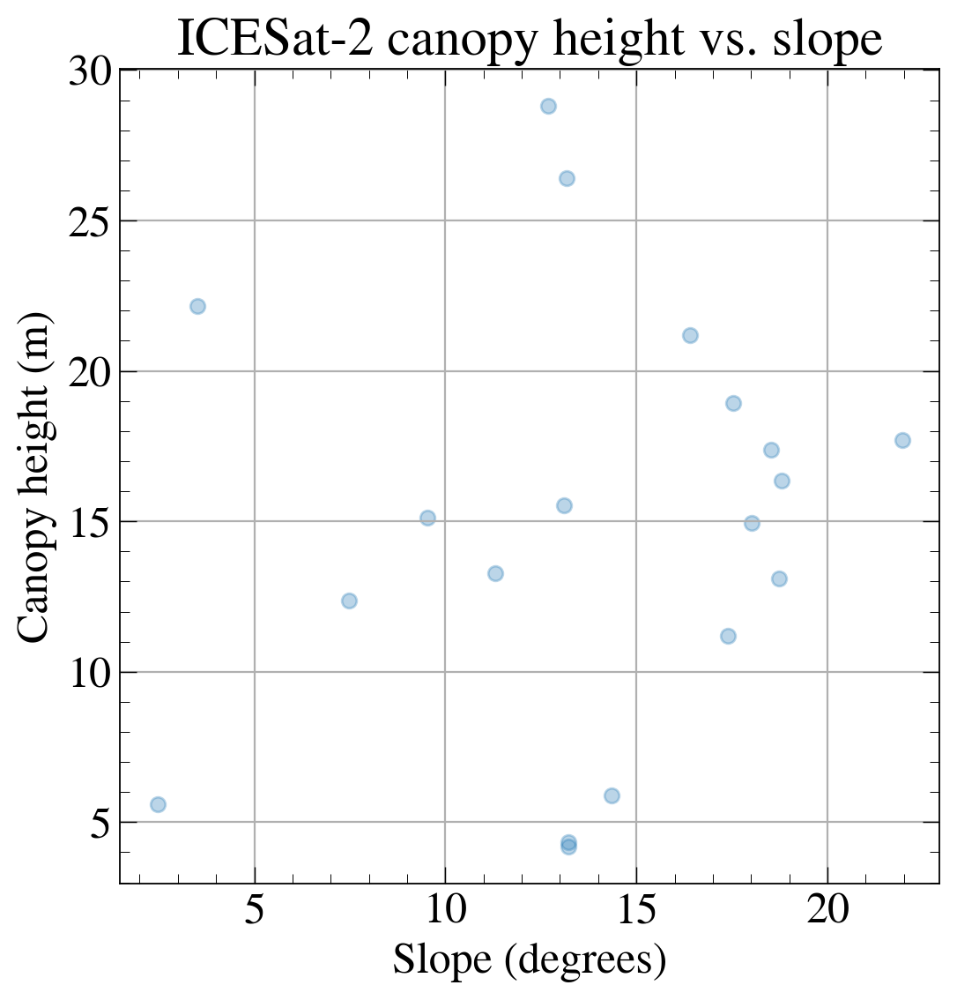

In [25]:
# X = icesat2_clean[["airborne_slope_deg"]]
# y = icesat2_clean["h_mean_canopy"]  # ICESat-2 top height

X = gedi_clean[["airborne_slope_deg"]]
y = gedi_clean["rh_100"]  # GEDI top height

plt.scatter(X, y, alpha=0.3)
plt.xlabel("Slope (degrees)")
plt.ylabel("Canopy height (m)")
plt.title("ICESat-2 canopy height vs. slope")
plt.show()

## Workflow


A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 15.7051                         ] (9% - 158.3s - 1 threads))


Length of data: 33884
EPSG:6340 


--- Airborne@GEDI, footprint diameter = 1 m (radius = 0.5 m) ---
GEDI footprint 1 m diameter slope cols: ['slope_mean', 'slope_std', 'slope_percentile_95']
GEDI footprint 1 m diameter CHM cols: ['chm_mean', 'chm_std', 'chm_percentile_95']

--- Airborne@GEDI, footprint diameter = 5 m (radius = 2.5 m) ---
GEDI footprint 5 m diameter slope cols: ['slope_mean', 'slope_std', 'slope_percentile_95']
GEDI footprint 5 m diameter CHM cols: ['chm_mean', 'chm_std', 'chm_percentile_95']

--- Airborne@GEDI, footprint diameter = 10 m (radius = 5.0 m) ---
GEDI footprint 10 m diameter slope cols: ['slope_mean', 'slope_std', 'slope_percentile_95']
GEDI footprint 10 m diameter CHM cols: ['chm_mean', 'chm_std', 'chm_percentile_95']

--- Airborne@GEDI, footprint diameter = 15 m (radius = 7.5 m) ---
GEDI footprint 15 m diameter slope cols: ['slope_mean', 'slope_std', 'slope_percentile_95']
GEDI footprint 15 m diameter CHM cols: ['chm_mean', 'chm_std', 'chm_percentile_95']


/tmp/ipykernel_173653/1564022915.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["dataset", "slope_bin"])



=== Airborne@ATL08_L100m (all slopes) ===
Random Forest (non-spatial) R-squared=0.844 RMSE=0.272
Spatial Random Forest R-squared=0.863 RMSE=0.255

=== Airborne@ATL08_L13m (all slopes) ===
Random Forest (non-spatial) R-squared=0.840 RMSE=0.337
Spatial Random Forest R-squared=0.855 RMSE=0.321

=== Airborne@ATL08_L20m (all slopes) ===
Random Forest (non-spatial) R-squared=0.840 RMSE=0.325
Spatial Random Forest R-squared=0.855 RMSE=0.309

=== Airborne@ATL08_L40m (all slopes) ===
Random Forest (non-spatial) R-squared=0.838 RMSE=0.305
Spatial Random Forest R-squared=0.854 RMSE=0.290

=== Airborne@ATL08_L60m (all slopes) ===
Random Forest (non-spatial) R-squared=0.841 RMSE=0.291
Spatial Random Forest R-squared=0.860 RMSE=0.273

=== Airborne@ATL08_L80m (all slopes) ===
Random Forest (non-spatial) R-squared=0.843 RMSE=0.280
Spatial Random Forest R-squared=0.860 RMSE=0.264

=== Airborne@GEDI_d10m (all slopes) ===
Random Forest (non-spatial) R-squared=0.838 RMSE=0.222
Spatial Random Forest R-squ

/tmp/ipykernel_173653/1564022915.py:823: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for slope_bin, df_bin in df_ds.groupby("slope_bin"):
/tmp/ipykernel_173653/1564022915.py:823: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for slope_bin, df_bin in df_ds.groupby("slope_bin"):
/tmp/ipykernel_173653/1564022915.py:823: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for slope_bin, df_bin in df_ds.groupby("slope_bin"):
/tmp


=== Performance by slope class (RF vs Spatial RF) ===
                 dataset slope_bin      n     R2_RF   RMSE_RF  R2_RF_spatial  \
0   Airborne@ATL08_L100m    0 - 09  11114  0.838541  0.139142       0.856797   
1   Airborne@ATL08_L100m   10 - 19  15530  0.843414  0.276420       0.857633   
2   Airborne@ATL08_L100m   20 - 29   5250  0.838198  0.397850       0.857310   
3   Airborne@ATL08_L100m       30+    486  0.823094  0.564010       0.835317   
4    Airborne@ATL08_L13m    0 - 09  12033  0.835539  0.195361       0.848747   
5    Airborne@ATL08_L13m   10 - 19  14065  0.838721  0.345949       0.851084   
6    Airborne@ATL08_L13m   20 - 29   5451  0.830091  0.459579       0.843637   
7    Airborne@ATL08_L13m       30+    780  0.814485  0.760400       0.814377   
8    Airborne@ATL08_L20m    0 - 09  11960  0.841311  0.183474       0.853840   
9    Airborne@ATL08_L20m   10 - 19  14153  0.828470  0.336989       0.846620   
10   Airborne@ATL08_L20m   20 - 29   5494  0.835460  0.455753    

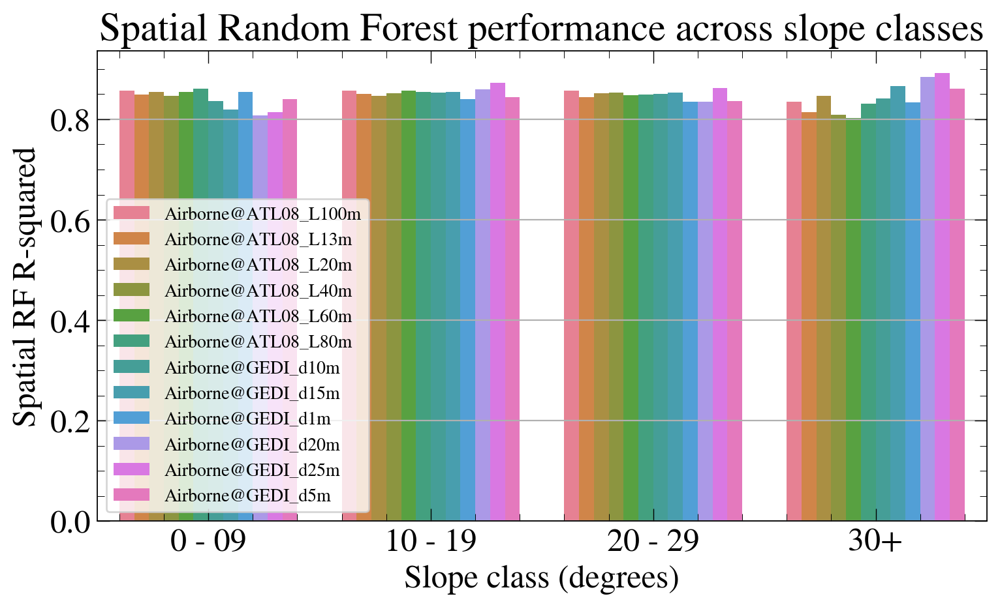

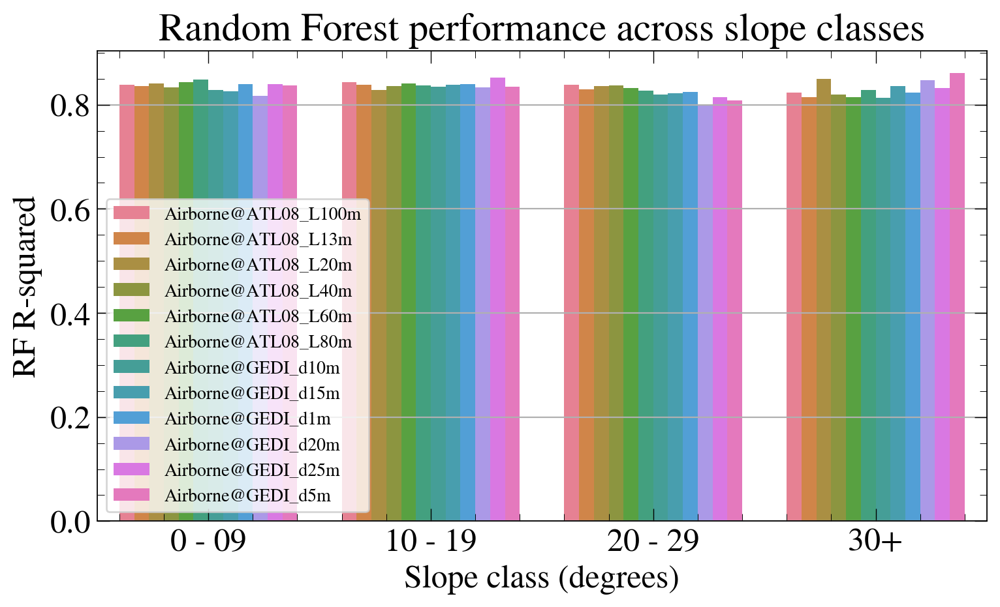

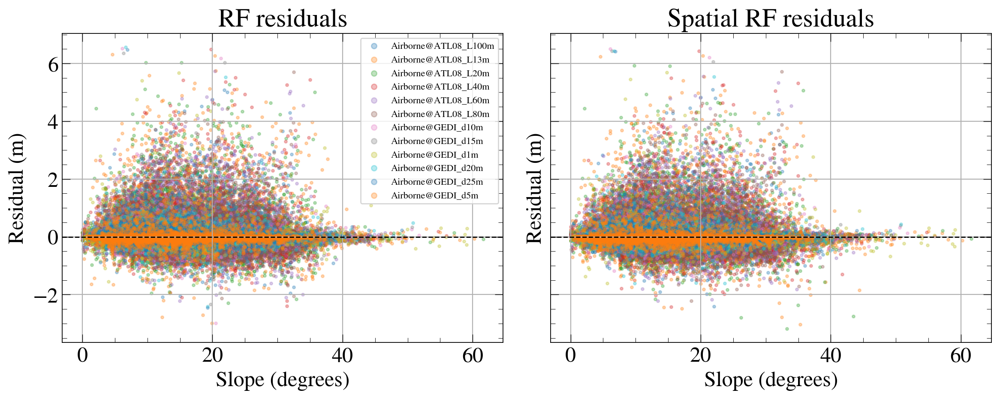

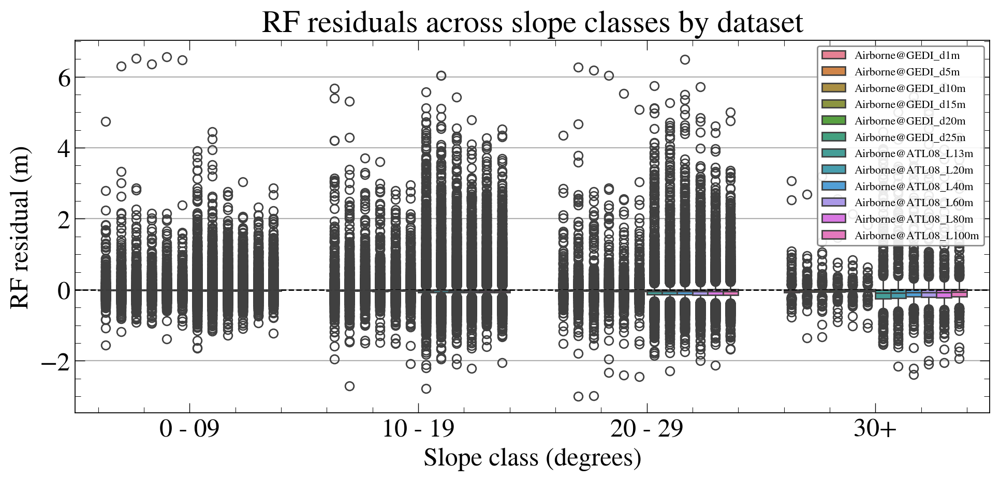

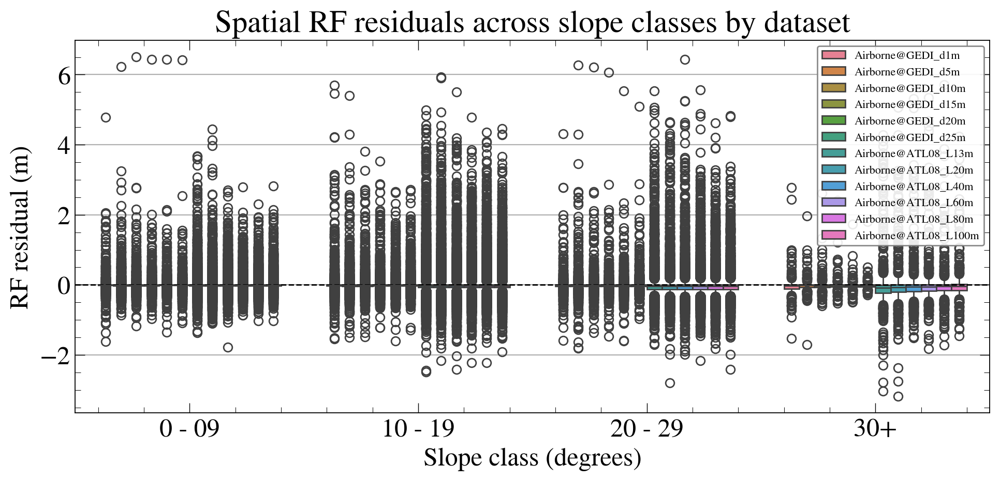

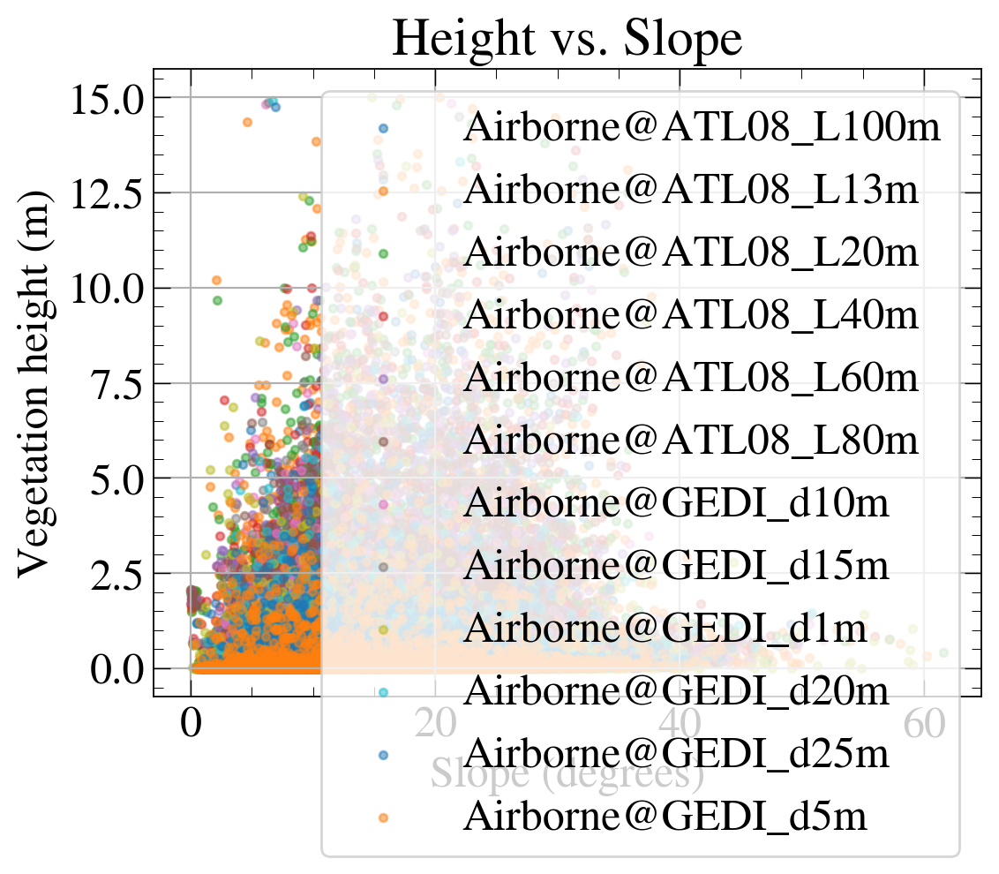

In [19]:
# =========================
# CONFIG
# =========================
# Input tile directories: GeoTIFF tiles
DTM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/las_dtm/")    # DTM
DSM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/lasgrid_dsm/")    # DSM

# Optionally, set CHM_DIR and skip DSM
CHM_DIR = None  # e.g., Path("/path/to/chm_tiles") or None

# Outputs
OUT_DIR = Path(Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/") )
OUT_DIR.mkdir(parents=True, exist_ok=True)

DTM_MOSAIC = OUT_DIR / "lidar_dtm_mosaic.tif"
DSM_MOSAIC = OUT_DIR / "lidar_dsm_mosaic.tif"
CHM_MOSAIC = OUT_DIR / "lidar_chm_mosaic.tif"
SLOPE_MOSAIC = OUT_DIR / "lidar_slope_deg.tif"

# GEDI and ATL08 vectors
GEDI_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/gedi_ml2.geojson")
ATL08_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/icesat2_ml_final.geojson")

# Column names for vegetation height in the vector attribute tables
gedi_height_col = "rh_80"          # or "rh_100"
atl08_height_col = "h_mean_canopy"     # or "h_max_canopy"

# Approximate footprint buffers (meters)
gedi_buffer_m = 12.5

# CRS to use for all rasters and vectors (projected! so the buffers are in meters)
# If DTM tiles already have a projected CRS, you can leave this as None to keep native.
TARGET_CRS = None  # e.g., "EPSG:6340" or None

# -------------------------
# Utility: find rasters
# -------------------------
def list_tifs(folder: Path):
    return sorted([str(p) for p in folder.glob("*.tif")])

# --------------------------------
# Mosaic tiles into one GeoTIFF
# --------------------------------
def mosaic_tiles(tif_list, dst_path, target_crs=None, dst_dtype="float32", resampling=Resampling.bilinear):
    if len(tif_list) == 0:
        raise FileNotFoundError(f"No GeoTIFFs found to mosaic for {dst_path}")
    srcs = [rasterio.open(p) for p in tif_list]

    # Reproject on the fly if target_crs is requested and differs
    if target_crs is not None:
        target_crs = CRS.from_user_input(target_crs)

    # Merge (note: rasterio.merge will reproject if 'precision' and 'res' differ. We will keep simple merge.)
    mosaic, out_transform = rasterio.merge.merge(srcs, resampling=resampling)
    out_meta = srcs[0].meta.copy()
    out_meta.update({
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": out_transform,
        "dtype": dst_dtype
    })

    # Write temp
    with rasterio.open(dst_path, "w", **out_meta) as dst:
        dst.write(mosaic.astype(dst_dtype))

    # Optionally, reproject to target_crs
    if target_crs is not None and out_meta.get("crs") and CRS.from_user_input(out_meta["crs"]) != target_crs:
        reproj_path = dst_path.with_name(dst_path.stem + f"_{target_crs.to_authority()[0]}{target_crs.to_authority()[1]}.tif")
        reproject_to(dst_path, reproj_path, target_crs)
        os.replace(reproj_path, dst_path)

    for s in srcs:
        s.close()

    return str(dst_path)

# ---------------------------
# Reproject a raster to a CRS
# ---------------------------
def reproject_to(src_path, dst_path, target_crs):
    with rasterio.open(src_path) as src:
        transform, width, height = rasterio.warp.calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds
        )
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height
        })
        with rasterio.open(dst_path, "w", **kwargs) as dst:
            for i in range(1, src.count + 1):
                rasterio.warp.reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=target_crs,
                    resampling=Resampling.bilinear
                )
    return str(dst_path)

# ----------------------------------------
# Compute CHM mosaic as DSM - DTM 
# ----------------------------------------
def compute_chm(dsm_path, dtm_path, out_path, nodata_out=-9999, max_height=15):
    with rasterio.open(dsm_path) as dsm, rasterio.open(dtm_path) as dtm:
        if dsm.crs != dtm.crs:
            raise ValueError("DSM and DTM must share the same CRS. Reproject first.")
        if (dsm.transform != dtm.transform) or (dsm.width != dtm.width) or (dsm.height != dtm.height):
            raise ValueError("DSM and DTM grids must be aligned. Resample/reproject one to the other.")

        dsm_arr = dsm.read(1).astype("float32")
        dtm_arr = dtm.read(1).astype("float32")

        # Build valid mask from nodata or non-finite
        dsm_nd = dsm.nodata
        dtm_nd = dtm.nodata
        valid = np.isfinite(dsm_arr) & np.isfinite(dtm_arr)
        if dsm_nd is not None:
            valid &= dsm_arr != dsm_nd
        if dtm_nd is not None:
            valid &= dtm_arr != dtm_nd

        chm = np.full_like(dtm_arr, np.float32(nodata_out))
        chm[valid] = dsm_arr[valid] - dtm_arr[valid]

        # Clean up: no negatives, and cap improbable outliers
        chm[valid & (chm < 0)] = 0.0
        chm[valid & (chm > max_height)] = max_height  # optional but helpful for plotting

        meta = dtm.meta.copy()
        meta.update(dtype="float32", nodata=nodata_out)

        with rasterio.open(out_path, "w", **meta) as dst:
            dst.write(chm, 1)

    return str(out_path)

# --------------------
# Compute slope (degrees)
# --------------------
def compute_slope_deg(dtm_path, out_path):
    dem = rd.LoadGDAL(str(dtm_path))
    slope = rd.TerrainAttribute(dem, attrib='slope_degrees')
    rd.SaveGDAL(str(out_path), slope)
    return str(out_path)

# ---------------------------------------------------------
# Buffer points in meters (handles reprojection for buffer)
# ---------------------------------------------------------
def buffer_points(gdf, buffer_m, target_crs=None):
    """
    Returns polygons (buffers) in a projected CRS so 'buffer_m' is in meters.
    If target_crs is None, uses the current CRS if it's projected; otherwise raises.
    """
    if target_crs is None:
        # If gdf.crs is geographic (degrees), you must pass a projected CRS
        if gdf.crs is None or CRS.from_user_input(gdf.crs).is_geographic:
            raise ValueError("Geographic CRS detected. Please set TARGET_CRS to a projected CRS (meters).")
        work_crs = gdf.crs
        gdf_proj = gdf
    else:
        work_crs = CRS.from_user_input(target_crs)
        gdf_proj = gdf.to_crs(work_crs)

    gdf_proj = gdf_proj.copy()
    gdf_proj["geometry"] = gdf_proj.geometry.buffer(buffer_m)
    return gdf_proj

# ----------------------------------------------------------
# Zonal stats helper: get mean/std/p95 from raster per geom
# ----------------------------------------------------------
def zonal_stats_df(geoms_gdf, raster_path, stats=("mean","std","percentile_95"), prefix="slope_"):
    zs = zonal_stats(
        geoms_gdf,
        raster_path,
        stats=list(stats),
        nodata=None,
        geojson_out=False
    )
    out = pd.DataFrame(zs)
    out = out.add_prefix(prefix)
    # out = out[out["slope_mean"].notna()]
    return out

# ---------- ICESat-2 helpers: track ends + rectangle corners ----------

def icesat2_gt_endflag(df: pd.DataFrame) -> np.ndarray:
    """
    Flag starts/ends of tracks defined by (date, gt).
    Assumes df has columns: 'time' (datetime64) and 'gt' (beam/ground track).
    Logically find the ends of unique ICESat-2 ground tracks according to dates.
    
    Steps:
    - We sort data first by time and then ground track (gt) to make sure all the points are ordered correctly. 
    - Use the unique function to identify the first instance of unique pairs of date and gt in the dataset thus giving the start of a new track. 
    - Identify the row above each track start as the end of the previous track.
    
    Parameters:
    - icesat2_df: ICESat-2 dataframe, assumed to be a pandas DataFrame with 'time' (datetime64), 'gt' (beam), and 'norths' already defined.

    Returns:
    - end_flag: 0/1 array same length as df - logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
      It is helps to avoid wrapping errors at track edges.
    """
    
    # Sort by 'time' and 'gt'
    sdf = df.sort_values(by=["time", "gt"]).reset_index(drop=True)
    
    # Extract only the date (ignore time of day)
    dates = pd.to_datetime(sdf["time"]).dt.date
    
    # Create a combined key of date and 'gt' and find first occurrence
    first_idx = pd.DataFrame({"date": dates, "gt": sdf["gt"]}).drop_duplicates(keep="first").index
    
    # Initialize end_flag with zeros (same length as number of rows)
    end_flag = np.zeros(len(sdf), dtype=int)
    
    # Flag unique_refs
    end_flag[first_idx] = 1
    
    # Also flag the entry just before each unique_ref (unless it's 0)
    for idx in first_idx:
        if idx > 0:
            end_flag[idx - 1] = 1
            
    # Flag the last element
    end_flag[-1] = 1
    return end_flag
    # Return in original row order
    # ef = pd.Series(end_flag, index=sdf.index)
    # return ef#.sort_index().values

def icesat2_footprint_corners(norths: np.ndarray,
                              easts: np.ndarray,
                              default_length: float,
                              end_flag: np.ndarray):
    """
    Calculate ICESat-2 footprint corners and orientation angles.
    This code inherently includes bearing-based orientation using the geometry of the ground track.
    
    Build oriented rectangles using local track bearing.
    theta is computed as arctan2(dN, dE) -> angle from East (x-axis)
    
    Parameters:
    - norths: array of northing coordinates.
    - easts: array of easting coordinates.
    - default_length: default footprint length (e.g., 100 for ATLO8 or 40 meters for ATL06).
    - end_flag: logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
      It is helps to avoid wrapping errors at track edges.

    Returns:
    - xc: x corner coordinates (N x 6)
    - yc: y corner coordinates (N x 6)
    - theta: footprint orientation angles (N,). The angle theta between the icesat2 track and due east
    """
    footwidth = 13.0  # meters (full width)
    n = norths.shape[0]
    theta = np.full((n, 2), np.nan, dtype="float64")
    xc = np.full((n, 6), np.nan, dtype="float64")
    yc = np.full((n, 6), np.nan, dtype="float64")

    # create polygons of ICESat-2 footprints
    for r in range(n-1):
        if r == 0 or (end_flag[r] - end_flag[r-1]) == 0: # only angle pointed forwards
            theta[r, 0] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
            theta[r, 1] = theta[r, 0]
            footlength = default_length
        elif r == n-1 or (end_flag[r] - end_flag[r+1]) == 0: # only angle pointed backwards
            theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
            theta[r, 1] = theta[r, 0]
            footlength = default_length
        else: # calculate angles in each direction
            theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
            theta[r, 1] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
            # footlength = 0.5 * np.hypot(norths[r+1]-norths[r-1], easts[r+1]-easts[r-1])
            footlength = 0.5 * np.sqrt((norths[r + 1] - norths[r - 1])**2 + (easts[r + 1] - easts[r - 1])**2)

        # along-track ends (angle from East). Find box edges along the RGT
        back_x  = easts[r] - (footlength/2.0) * np.cos(np.radians(theta[r, 0]))
        back_y  = norths[r] - (footlength/2.0) * np.sin(np.radians(theta[r, 0]))
        front_x = easts[r] + (footlength/2.0) * np.cos(np.radians(theta[r, 1]))
        front_y = norths[r] + (footlength/2.0) * np.sin(np.radians(theta[r, 1]))

        mean_theta = np.nanmean(theta[r, :])

        # cross-track offsets at center. Find box edges perpendicular to the centroid
        xc[r, 0] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta + 90))
        yc[r, 0] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta + 90))
        xc[r, 1] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta - 90))
        yc[r, 1] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta - 90))

        # rectangle corners at back and front. Solve for corner coordinates
        xc[r, 2] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] + 90))
        yc[r, 2] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] + 90))
        xc[r, 3] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] - 90))
        yc[r, 3] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] - 90))
        xc[r, 4] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] - 90))
        yc[r, 4] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] - 90))
        xc[r, 5] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] + 90))
        yc[r, 5] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] + 90))

    return xc, yc

# ---------------------------------------------------
# pipeline: mosaic, slope, CHM
# ---------------------------------------------------
# Mosaic DTM
dtm_tiles = list_tifs(DTM_DIR)
m_dtm = mosaic_tiles(dtm_tiles, DTM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")

# CHM (either from DSM tiles or CHM tiles)
have_chm = False
if CHM_DIR is not None:
    chm_tiles = list_tifs(CHM_DIR)
    if len(chm_tiles) > 0:
        m_chm = mosaic_tiles(chm_tiles, CHM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
        have_chm = True

elif DSM_DIR is not None and len(list_tifs(DSM_DIR)) > 0:
    # Mosaic DSM, then CHM
    m_dsm = mosaic_tiles(list_tifs(DSM_DIR), DSM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
    # Make sure DSM and DTM mosaics share grid; reproject DSM to DTM's exact grid if needed
    with rasterio.open(m_dtm) as dtm_src, rasterio.open(m_dsm) as dsm_src:
        if (dsm_src.crs != dtm_src.crs) or (dsm_src.transform != dtm_src.transform) \
           or (dsm_src.width != dtm_src.width) or (dsm_src.height != dtm_src.height):
            # Resample DSM to DTM grid
            aligned_dsm = OUT_DIR / "lidar_dsm_mosaic_aligned.tif"
            with rasterio.open(aligned_dsm, "w", **dtm_src.meta) as dst:
                dst_arr = dst.read(1)  # just to allocate; we will overwrite
            with rasterio.open(m_dsm) as s, rasterio.open(str(aligned_dsm), "r+") as d:
                dst_arr = np.empty((dtm_src.height, dtm_src.width), dtype="float32")
                rasterio.warp.reproject(
                    source=rasterio.band(s, 1),
                    destination=dst_arr,
                    src_transform=s.transform,
                    src_crs=s.crs,
                    dst_transform=dtm_src.transform,
                    dst_crs=dtm_src.crs,
                    resampling=Resampling.bilinear
                )
                d.write(dst_arr, 1)
            m_dsm = str(aligned_dsm)

    m_chm = compute_chm(m_dsm, m_dtm, CHM_MOSAIC)
    have_chm = True

# Slope (degrees)
m_slope = compute_slope_deg(m_dtm, SLOPE_MOSAIC)

# ---------------------------------------------------
# Load vectors and prep buffers (projected CRS required)
# ---------------------------------------------------
target_col = "rh_80" # "rh_100"
gedi = gpd.read_file(GEDI_VECT)
gedi = gedi.drop(drop_cols, axis = 1)
gedi = gedi.rename(columns={"elevation_NAVD88_gedi_from_crs_l2a": "Elevation"})
gedi = gedi[gedi["fhd_normal"] != -9999.000000]
gedi = gedi[gedi[target_col] <= 15]
gedi[target_col] = pd.to_numeric(gedi[target_col], errors="coerce").clip(upper=15)
# gedi.head()

from helper_functions import load_icesat2_data
projected_crs = "epsg:6340" 
# atl08 = gpd.read_file(ATL08_VECT)
atl08 = load_icesat2_data(ATL08_VECT, "ATL08", process = False)
# atl08 = atl08[atl08["gnd_ph_count"] != 0]
atl08 = atl08[atl08["h_mean_canopy"] <= 15]
atl08[atl08_height_col] = pd.to_numeric(atl08[atl08_height_col], errors="coerce").clip(upper=15)
atl08 = atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
print(f"Length of data: {len(atl08)}")
print(atl08.crs, "\n")

with rasterio.open(m_slope) as rs:
    raster_crs = rs.crs

# Reproject vectors to raster CRS (must be projected to use meter buffers)
if CRS.from_user_input(raster_crs).is_geographic:
    raise ValueError("Slope raster is in a geographic CRS. Reproject your DTM to a projected CRS (meters).")

gedi = gedi.to_crs(raster_crs)
atl08 = atl08.to_crs(raster_crs)

gedi_buf = buffer_points(gedi, gedi_buffer_m, target_crs=None)   # already projected

# ---------- Build 100x13 m oriented rectangles for ATL08 ----------
# ATL08 is already projected to the raster CRS (meters) above
# Required columns: 'Easting', 'Northing', 'time' (datetime64), 'gt' (beam/track id)

# End flags (avoid wrapping across tracks/days)
ef = icesat2_gt_endflag(atl08)

# Rectangle corners 
norths = pd.to_numeric(atl08["Northing"], errors="coerce").values
easts  = pd.to_numeric(atl08["Easting"],  errors="coerce").values
xc, yc = icesat2_footprint_corners(norths, easts, default_length=100.0, end_flag=ef)

# Build shapely Polygons from corners (use indices we actually filled)
from shapely.geometry import Polygon
rows = []
rect_geoms = []
for i in range(xc.shape[0]):
    if np.any(np.isnan(xc[i, 2:6])) or np.any(np.isnan(yc[i, 2:6])):
        continue
    rect = ShpPolygon([(xc[i,2], yc[i,2]), 
                       (xc[i,3], yc[i,3]), 
                       (xc[i,4], yc[i,4]), 
                       (xc[i,5], yc[i,5])])
    rect_geoms.append(rect)
    rows.append(i)

# Create a GeoDataFrame aligned to the kept rows
atl08_rects = atl08.iloc[rows].copy()
atl08_rects.set_geometry(gpd.GeoSeries(rect_geoms, index=atl08_rects.index), inplace=True)
# (CRS already set via atl08.to_crs(raster_crs) earlier)

# ---------------------------------------------------
# Helper to build a modeling DataFrame from a GDF
# ---------------------------------------------------
def build_df(gdf, dataset_name, height_col):
    # pull height and slope
    heights = pd.to_numeric(gdf[height_col], errors="coerce").astype("float32")
    slopes  = pd.to_numeric(gdf["slope_mean"], errors="coerce").astype("float32")

    # hard-cap heights at 15 m
    heights = heights.clip(upper=15)

    # coordinates for Spatial RF (assumes projected CRS in meters)
    centroids = gdf.geometry.centroid
    xs = centroids.x.astype("float32")
    ys = centroids.y.astype("float32")

    # elevation (if present; e.g., column "Elevation" in ATL08 or GEDI)
    elev = pd.to_numeric(gdf.get("Elevation", np.nan), errors="coerce").astype("float32")

    df = pd.DataFrame({
        "dataset":   dataset_name,
        "height_m":  heights,
        "slope_deg": slopes,
        "x":         xs,
        "y":         ys,
        "elev_m":    elev,
        "slope_std": pd.to_numeric(
            gdf.get("slope_std", np.nan), errors="coerce"
        ).astype("float32"),
        "slope_p95": pd.to_numeric(
            gdf.get("slope_percentile_95", np.nan), errors="coerce"
        ).astype("float32"),
        "src_idx":   gdf.index,  # keep original index
    }, index=gdf.index)

    # also cap CHM-related fields if present
    if "chm_mean" in gdf.columns:
        df["chm_mean"] = (
            pd.to_numeric(gdf["chm_mean"], errors="coerce")
            .astype("float32").clip(upper=15)
        )
    if "chm_std" in gdf.columns:
        df["chm_std"] = pd.to_numeric(gdf["chm_std"], errors="coerce").astype("float32")
    if "chm_percentile_95" in gdf.columns:
        df["chm_p95"] = (
            pd.to_numeric(gdf["chm_percentile_95"], errors="coerce")
            .astype("float32").clip(upper=15)
        )

    # we require height and slope and coordinates, but NOT elevation
    return df.dropna(subset=["height_m", "slope_deg", "x", "y"])

# ---------------------------------------------------
# CHM stats (airborne height) under footprints
# ---------------------------------------------------
def chm_stats_df(geoms_gdf, chm_path, prefix="chm_"):
    return zonal_stats_df(geoms_gdf, chm_path,
                          stats=("mean","std","percentile_95"),
                          prefix=prefix)

# ---------------------------------------------------
# Airborne@GEDI: multiple circular footprint radii
# ---------------------------------------------------
gedi_diameters_m = [5, 10, 15, 20, 25, 30, 35]   # these are diameters in meters

airborne_gedi_dfs = []

if have_chm:
    for d in gedi_diameters_m:
        r = d / 2.0  # convert diameter -> radius in meters
        print(f"\n--- Airborne@GEDI, footprint diameter = {d} m (radius = {r} m) ---")

        # buffer GEDI points with *radius* r
        gedi_buf_r = buffer_points(gedi, r, target_crs=None)

        # slope stats under these buffers
        gedi_slope_df_r = zonal_stats_df(
            gedi_buf_r, m_slope,
            stats=("mean", "std", "percentile_95"),
            prefix="slope_"
        )

        # CHM stats under these buffers
        gedi_chm_df_r = chm_stats_df(
            gedi_buf_r, m_chm,
            prefix="chm_"
        )

        # attach slope + CHM back to a copy of gedi
        gediX_r = gedi.copy()
        for col in gedi_slope_df_r.columns:
            gediX_r[col] = gedi_slope_df_r[col]
        for col in gedi_chm_df_r.columns:
            gediX_r[col] = gedi_chm_df_r[col]

        # cap CHM heights at 15 m
        if "chm_mean" in gediX_r.columns:
            gediX_r["chm_mean"] = pd.to_numeric(
                gediX_r["chm_mean"], errors="coerce"
            ).clip(upper=15)

        # drop NaN slopes
        gediX_r = gediX_r[gediX_r["slope_mean"].notna()].reset_index(drop=True)

        print("GEDI footprint", d, "m diameter slope cols:",
              [c for c in gediX_r.columns if c.startswith("slope_")])
        if "chm_mean" in gediX_r.columns:
            print("GEDI footprint", d, "m diameter CHM cols:",
                  [c for c in gediX_r.columns if c.startswith("chm_")])

        # build modeling DF using CHM as height (airborne truth)
        ds_name = f"Airborne@GEDI_d{d}m"
        df_air_gedi_r = build_df(gediX_r, ds_name, height_col="chm_mean")
        airborne_gedi_dfs.append(df_air_gedi_r)

# ---------------------------------------------------
# Airborne@ATL08: multiple segment lengths
# ---------------------------------------------------
segment_lengths_m = [13, 20, 40, 60, 80, 100]

airborne_atl08_dfs = []

if have_chm:
    for L in segment_lengths_m:
        print(f"\n--- Airborne@ATL08, segment length = {L} m ---")

        # recompute oriented rectangles for this length
        ef = icesat2_gt_endflag(atl08)

        norths = pd.to_numeric(atl08["Northing"], errors="coerce").values
        easts  = pd.to_numeric(atl08["Easting"],  errors="coerce").values
        xc, yc = icesat2_footprint_corners(
            norths, easts,
            default_length=float(L),
            end_flag=ef
        )

        # build polygons
        rows_idx = []
        rect_geoms = []
        for i in range(xc.shape[0]):
            if np.any(np.isnan(xc[i, 2:6])) or np.any(np.isnan(yc[i, 2:6])):
                continue
            rect = ShpPolygon([
                (xc[i, 2], yc[i, 2]),
                (xc[i, 3], yc[i, 3]),
                (xc[i, 4], yc[i, 4]),
                (xc[i, 5], yc[i, 5])
            ])
            rect_geoms.append(rect)
            rows_idx.append(i)

        atl08_rects_L = atl08.iloc[rows_idx].copy()
        atl08_rects_L.set_geometry(
            gpd.GeoSeries(rect_geoms, index=atl08_rects_L.index),
            inplace=True
        )

        # slope stats under these segments
        atl08_slope_df_L = zonal_stats_df(
            atl08_rects_L, m_slope,
            stats=("mean", "std", "percentile_95"),
            prefix="slope_"
        )

        # CHM stats under these segments
        atl08_chm_df_L = chm_stats_df(
            atl08_rects_L, m_chm,
            prefix="chm_"
        )

        atl08X_L = atl08_rects_L.copy()
        for col in atl08_slope_df_L.columns:
            atl08X_L[col] = atl08_slope_df_L[col]
        for col in atl08_chm_df_L.columns:
            atl08X_L[col] = atl08_chm_df_L[col]

        # cap CHM heights
        if "chm_mean" in atl08X_L.columns:
            atl08X_L["chm_mean"] = pd.to_numeric(
                atl08X_L["chm_mean"], errors="coerce"
            ).clip(upper=15)

        atl08X_L = atl08X_L[atl08X_L["slope_mean"].notna()].reset_index(drop=True)

        print("ATL08 segment", L, "m slope cols:",
              [c for c in atl08X_L.columns if c.startswith("slope_")])
        if "chm_mean" in atl08X_L.columns:
            print("ATL08 segment", L, "m CHM cols:",
                  [c for c in atl08X_L.columns if c.startswith("chm_")])

        ds_name = f"Airborne@ATL08_L{L}m"
        df_air_atl08_L = build_df(atl08X_L, ds_name, height_col="chm_mean")
        airborne_atl08_dfs.append(df_air_atl08_L)

# ---------------------------------------------------
# Combined for modeling and comparison (AIRBORNE ONLY)
# ---------------------------------------------------
if not have_chm:
    raise RuntimeError("CHM is required for Airborne@GEDI / Airborne@ATL08 experiments.")

dfs = airborne_gedi_dfs + airborne_atl08_dfs
df_all = pd.concat(dfs, ignore_index=True)

# ---------------------------------------------------
# Add slope bins for performance by slope class
# ---------------------------------------------------
# Define slope thresholds (in degrees)
bins = [0, 9, 19, 29, np.inf]
labels = ["0 - 09", "10 - 19", "20 - 29", "30+"]

# Add a categorical slope-bin column
df_all["slope_bin"] = pd.cut(df_all["slope_deg"], bins=bins,
                             labels=labels, include_lowest=True)

# Count points per dataset and slope class
slope_counts = (
    df_all
    .groupby(["dataset", "slope_bin"])
    .size()
    .reset_index(name="count")
    .sort_values(["dataset", "slope_bin"])
)
print(slope_counts)

# pivot table
slope_counts_pivot = slope_counts.pivot(
    index="dataset",
    columns="slope_bin",
    values="count"
).fillna(0).astype(int)
print(slope_counts_pivot)

# ---------------------------------
# Modeling: RF and Spatial RF
# ---------------------------------
def _rmse(y_true, y_pred):
    # Works on any sklearn version
    try:
        return mean_squared_error(y_true, y_pred, squared=False)
    except TypeError:
        return np.sqrt(mean_squared_error(y_true, y_pred))

def fit_rf(X, y, n_estimators=50, random_state=42):
    """Standard Random Forest (non-spatial)."""
    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        random_state=random_state,
        n_jobs=-1
    )
    rf.fit(X, y)
    yhat = rf.predict(X)
    r2 = r2_score(y, yhat)
    rmse = _rmse(y, yhat)
    return rf, r2, rmse

def fit_spatial_rf(X, y, n_estimators=50, random_state=42):
    """Spatial Random Forest: includes x,y coordinates as predictors."""
    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        random_state=random_state,
        n_jobs=-1
    )
    rf.fit(X, y)
    yhat = rf.predict(X)
    r2 = r2_score(y, yhat)
    rmse = _rmse(y, yhat)
    return rf, r2, rmse

def run_models_for_group(
    df,
    base_features=("slope_deg", "elev_m"),
    spatial_features=("slope_deg", "elev_m", "x", "y"),
    label="height_m"
):
    # --- Base RF (slope + elevation) ---
    needed_base = list(base_features) + [label]
    df_base = df[needed_base].dropna()
    if len(df_base) < 5:
        return {
            "rf": None,
            "r2_rf": np.nan,
            "rmse_rf": np.nan,
            "rf_spatial": None,
            "r2_rf_spatial": np.nan,
            "rmse_rf_spatial": np.nan,
        }

    X_base = df_base[list(base_features)].values
    y_base = df_base[label].values
    rf, r2_rf, rmse_rf = fit_rf(X_base, y_base)

    # --- Spatial RF (slope + elevation + x,y) ---
    needed_spat = list(spatial_features) + [label]
    df_spat = df[needed_spat].dropna()
    if len(df_spat) < 5:
        rf_spat = None
        r2_rf_spat = np.nan
        rmse_rf_spat = np.nan
    else:
        X_spat = df_spat[list(spatial_features)].values
        y_spat = df_spat[label].values
        rf_spat, r2_rf_spat, rmse_rf_spat = fit_spatial_rf(X_spat, y_spat)

    return {
        "rf": rf,
        "r2_rf": r2_rf,
        "rmse_rf": rmse_rf,
        "rf_spatial": rf_spat,
        "r2_rf_spatial": r2_rf_spat,
        "rmse_rf_spatial": rmse_rf_spat,
    }

def summarize_residuals(df, y_col, yhat_col, model_label):
    """Return one row of metrics for a given subset + model."""
    y    = df[y_col].values
    yhat = df[yhat_col].values
    resid = y - yhat

    return {
        "model":       model_label,
        "n":           len(df),
        "R_squared":   r2_score(y, yhat),
        "RMSE":        np.sqrt(np.mean(resid**2)),
        "bias_mean":   np.mean(resid),     # systematic over/under-estimate
        "bias_median": np.median(resid),   # robust to outliers
        "resid_std":   np.std(resid),      # spread / uncertainty
    }

# ---------------------------------------------------
# Overall models per dataset (all slopes)
# ---------------------------------------------------
results = {}
for name, sub in df_all.groupby("dataset"):
    if not name.startswith("Airborne@"):
        continue
    results[name] = run_models_for_group(sub)

# Print overall summaries with RF and Spatial RF
for name, res in results.items():
    print(f"\n=== {name} (all slopes) ===")
    print(
        f"Random Forest (non-spatial) R-squared={res['r2_rf']:.3f} "
        f"RMSE={res['rmse_rf']:.3f}"
    )
    print(
        f"Spatial Random Forest R-squared={res['r2_rf_spatial']:.3f} "
        f"RMSE={res['rmse_rf_spatial']:.3f}"
    )

df_all["pred_rf"]   = np.nan
df_all["pred_srf"]  = np.nan
df_all["resid_rf"]  = np.nan
df_all["resid_srf"] = np.nan

slope_bin_results = []   # RF vs spatial RF metrics per slope bin
rows = []                # residual summaries (RF + Spatial RF)

# -----------------------------------------------------------------------------------------
# Add RF/Spatial RF predictions + models + residual summaries per slope-bin x dataset
# -----------------------------------------------------------------------------------------      
for dataset_name, df_ds in df_all.groupby("dataset"):
    if dataset_name not in results:
        continue
        
    # ---------------------------------------------------
    # Add RF and Spatial RF predictions + residuals
    # ---------------------------------------------------
    # ========== Global predictions for this dataset ==========
    # Clean subsets for prediction
    df_ds_base = df_ds[["slope_deg", "elev_m", "height_m"]].dropna()
    df_ds_spat = df_ds[["slope_deg", "elev_m", "x", "y", "height_m"]].dropna()

    # Non-spatial RF: slope + elevation
    if "rf" in results[dataset_name] and len(df_ds_base) > 0:
        rf_global = results[dataset_name]["rf"]
        X_base_ds = df_ds_base[["slope_deg", "elev_m"]].values
        y_ds_base = df_ds_base["height_m"].values
        yhat_rf   = rf_global.predict(X_base_ds)

        idx_base_ds = df_ds_base.index
        df_all.loc[idx_base_ds, "pred_rf"]  = yhat_rf
        df_all.loc[idx_base_ds, "resid_rf"] = y_ds_base - yhat_rf

    # Spatial RF: slope + elevation + x, y
    if "rf_spatial" in results[dataset_name] and len(df_ds_spat) > 0:
        srf_global = results[dataset_name]["rf_spatial"]
        X_spat_ds  = df_ds_spat[["slope_deg", "elev_m", "x", "y"]].values
        y_ds_spat  = df_ds_spat["height_m"].values
        yhat_srf   = srf_global.predict(X_spat_ds)

        idx_spat_ds = df_ds_spat.index
        df_all.loc[idx_spat_ds, "pred_srf"]  = yhat_srf
        df_all.loc[idx_spat_ds, "resid_srf"] = y_ds_spat - yhat_srf

    # ---------------------------------------------------
    # Models + residual summaries per slope-bin x dataset
    # ---------------------------------------------------
    # ========== Per–slope-bin RF / Spatial RF metrics + residual summaries ==========
    for slope_bin, df_bin in df_ds.groupby("slope_bin"):
        if df_bin.empty or slope_bin is pd.NA:
            continue

        # subsets for fitting bin-level models
        df_bin_base = df_bin[["slope_deg", "elev_m", "x", "y", "height_m"]].dropna()
        df_bin_spat = df_bin_base.copy()  # same, since x,y already included

        # Skip bins with too few samples
        if len(df_bin_base) < 5 or len(df_bin_spat) < 5:
            print(
                f"Skipping {dataset_name} - {slope_bin}: too few samples "
                f"(base={len(df_bin_base)}, spatial={len(df_bin_spat)})"
            )
            continue

        # ----- Fit RF (slope + elevation) -----
        X_base = df_bin_base[["slope_deg", "elev_m"]].values
        y_base = df_bin_base["height_m"].values
        rf_bin, r2_rf, rmse_rf = fit_rf(X_base, y_base)

        # ----- Fit Spatial RF (slope + elevation + x,y) -----
        X_spat = df_bin_spat[["slope_deg", "elev_m", "x", "y"]].values
        y_spat = df_bin_spat["height_m"].values
        rf_spat_bin, r2_rf_spat, rmse_rf_spat = fit_spatial_rf(X_spat, y_spat)

        slope_bin_results.append({
            "dataset":          dataset_name,
            "slope_bin":        slope_bin,
            "n":                len(df_bin_spat),
            "R2_RF":            r2_rf,
            "RMSE_RF":          rmse_rf,
            "R2_RF_spatial":    r2_rf_spat,
            "RMSE_RF_spatial":  rmse_rf_spat,
        })

        # ----- Residual summary in the same bin -----
        # use global predictions sitting in df_all: pred_rf, pred_srf
        df_resid = df_bin.replace([np.inf, -np.inf], np.nan).dropna(
            subset=["height_m", "pred_rf", "pred_srf"]
        )
        if len(df_resid) < 5:
            continue  # too few points for residual stats

        # RF residual summary
        rows.append({
            "dataset":   dataset_name,
            "slope_bin": str(slope_bin),
            **summarize_residuals(df_resid, "height_m", "pred_rf", "RF")
        })

        # Spatial RF residual summary
        rows.append({
            "dataset":   dataset_name,
            "slope_bin": str(slope_bin),
            **summarize_residuals(df_resid, "height_m", "pred_srf", "Spatial RF")
        })

# Build the two DataFrames as before
results_df = pd.DataFrame(slope_bin_results)
if results_df.empty:
    print("\n=== Performance by slope class (RF vs Spatial RF) ===")
    print("No bins had enough samples to fit RF / Spatial RF.")
else:
    print("\n=== Performance by slope class (RF vs Spatial RF) ===")
    print(results_df.sort_values(["dataset", "slope_bin"]))

resid_summary = pd.DataFrame(rows)
print("len(rows) =", len(rows))
print("resid_summary.columns =", resid_summary.columns.tolist())
if resid_summary.empty:
    print("\n=== Residual summary by dataset x slope bin x model ===")
    print("No residuals to summarize (check sample thresholds and pred_rf/pred_srf).")
else:
    print("\n=== Residual summary by dataset x slope bin x model ===")
    print(resid_summary.sort_values(["dataset", "model", "slope_bin"]))

# -----------------------------------------------------------
# Plot R-squared by slope class and dataset (Spatial RF)
# -----------------------------------------------------------
plt.figure(figsize=(8, 5))
sns.barplot(
    data=results_df,
    x="slope_bin",
    y="R2_RF_spatial",
    hue="dataset"
)
plt.ylabel("Spatial RF R-squared")
plt.xlabel("Slope class (degrees)")
plt.title("Spatial Random Forest performance across slope classes")
plt.legend(fontsize=10, loc="lower left")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Plot R-squared by slope class and dataset (RF)
# ---------------------------------------------------
plt.figure(figsize=(8, 5))
sns.barplot(
    data=results_df,
    x="slope_bin",
    y="R2_RF",
    hue="dataset"
)
plt.ylabel("RF R-squared")
plt.xlabel("Slope class (degrees)")
plt.title("Random Forest performance across slope classes")
plt.legend(fontsize=10, loc="lower left")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Residual vs slope scatter (by dataset and model)
# ---------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

for ax, resid_col, title in [
    (axes[0], "resid_rf",  "RF residuals"),
    (axes[1], "resid_srf", "Spatial RF residuals"),
]:
    for dataset_name, df_ds in df_all.groupby("dataset"):
        ax.scatter(df_ds["slope_deg"], df_ds[resid_col],
                   s=5, alpha=0.3, label=dataset_name)
    ax.axhline(0, color="k", linestyle="--", linewidth=1)
    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Residual (m)")
    ax.set_title(title)

axes[0].legend(markerscale=2, fontsize=8)
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Boxplots of residuals by slope bin
# ---------------------------------------------------
plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    data=df_all,
    x="slope_bin",
    y="resid_rf",
    hue="dataset"
)
plt.axhline(0, color="k", linestyle="--", linewidth=1)
plt.ylabel("RF residual (m)")
plt.xlabel("Slope class (degrees)")
plt.title("RF residuals across slope classes by dataset")

# Put legend in a boxed frame
leg = ax.legend(
    fontsize=8,
    title_fontsize=9,
    frameon=True,           # turn on box
    fancybox=True,          # rounded corners
    framealpha=0.9,         # slight transparency
    edgecolor="grey",      # border color
    facecolor="white",      # background color
)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    data=df_all,
    x="slope_bin",
    y="resid_srf",
    hue="dataset"
)
plt.axhline(0, color="k", linestyle="--", linewidth=1)
plt.ylabel("RF residual (m)")
plt.xlabel("Slope class (degrees)")
plt.title("Spatial RF residuals across slope classes by dataset")

# Put legend in a boxed frame
leg = ax.legend(
    fontsize=8,
    title_fontsize=9,
    frameon=True,           # turn on box
    fancybox=True,          # rounded corners
    framealpha=0.9,         # slight transparency
    edgecolor="grey",      # border color
    facecolor="white",      # background color
)
plt.tight_layout()
plt.show()

# -----------------------------
# Quick diagnostic scatter
# -----------------------------
def scatter_by_dataset(df_all):
    fig, ax = plt.subplots(figsize=(6, 5))
    for k, g in df_all.groupby("dataset"):
        ax.scatter(g["slope_deg"], g["height_m"], s=10, label=k, alpha=0.5)
    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Vegetation height (m)")
    ax.legend()
    ax.set_title("Height vs. Slope")
    plt.tight_layout()
    plt.show()

scatter_by_dataset(df_all)

# Partial dependence-style RF curve per dataset
def rf_curve(dataset_name):
    """
    Plot RF response curve vs slope_deg, holding elevation fixed
    at the median elevation for this dataset.
    """
    sub = df_all[df_all["dataset"] == dataset_name].copy()
    if sub.empty or dataset_name not in results:
        return

    rf = results[dataset_name]["rf"]  # non-spatial RF trained on [slope_deg, elev_m]

    # Clean out rows with missing elevation or slope
    sub = sub[["slope_deg", "elev_m", "height_m"]].dropna()
    if sub.empty:
        print(f"No valid data (slope + elevation) for {dataset_name}")
        return

    # Range of slope to plot
    slope_grid = np.linspace(
        np.nanpercentile(sub["slope_deg"], 1),
        np.nanpercentile(sub["slope_deg"], 99),
        200
    )

    # Fix elevation at the median for this dataset
    elev_fixed = np.nanmedian(sub["elev_m"])
    elev_col = np.full_like(slope_grid, elev_fixed, dtype="float64")

    # Build 2D feature matrix [slope_deg, elev_m]
    X_plot = np.column_stack([slope_grid, elev_col])

    # Predict with RF
    y_hat = rf.predict(X_plot)

    # Plot
    plt.figure(figsize=(6, 4))
    plt.plot(slope_grid, y_hat)
    plt.xlabel("Slope (degrees)")
    plt.ylabel("Predicted height (m)")
    plt.title(f"RF response curve (median elevation={elev_fixed:.1f} m): {dataset_name}")
    plt.tight_layout()
    plt.show()

for name in ["GEDI", "ATL08", "Airborne@GEDI", "Airborne@ATL08"]:
    if name in results:
        rf_curve(name)

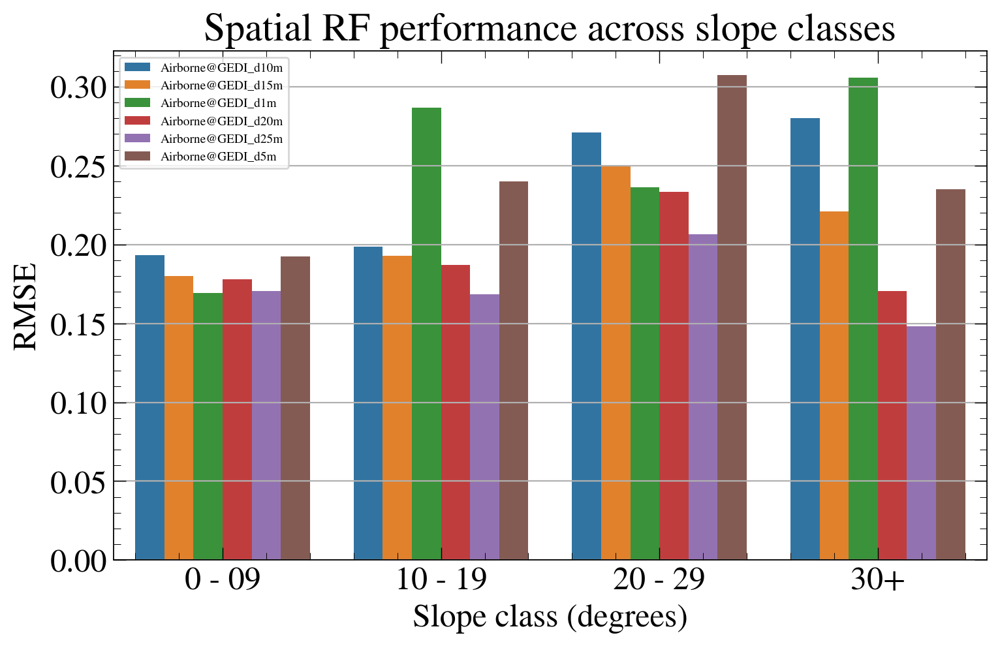

In [26]:
# # separate datasets
# results_gedi = results_df[results_df["dataset"].str.startswith("Airborne@GEDI")].copy()
# results_icesat2 = results_df[results_df["dataset"].str.startswith("Airborne@ATL08")].copy()

gedi_filename = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/results_airborne_gedi.csv"
icesat2_filename = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/results_airborne_icesat2.csv")

results_gedi = pd.read_csv(gedi_filename)
results_icesat2 = pd.read_csv(icesat2_filename)

# ---------------------------------------------------
# Plot RMSE by slope class and dataset (Spatial RF) – Airborne@GEDI only
# ---------------------------------------------------
def plot_results(results_data, metric, origin):
    plt.figure(figsize=(8, 5))
    sns.barplot(
        data=results_data,
        x="slope_bin",
        y=metric,
        hue="dataset"
    )
    
    if metric in ["RMSE_RF_spatial", "RMSE_RF"]:
        plt.ylabel("RMSE")
        plt.xlabel("Slope class (degrees)")
        plt.legend(fontsize=7)  # , loc="lower left")
        plt.tight_layout()
    else:
        plt.ylabel("R-squared")
        plt.xlabel("Slope class (degrees)")
        # plt.title("R-squared across slope classes")
        plt.legend(fontsize=7, loc="lower left")
        plt.tight_layout()
        
    if origin == "spatial":
        plt.title("Spatial RF performance across slope classes")
    else:
        plt.title("RF performance across slope classes")
    plt.show()
    
plot_results(results_gedi, "RMSE_RF_spatial", "spatial")

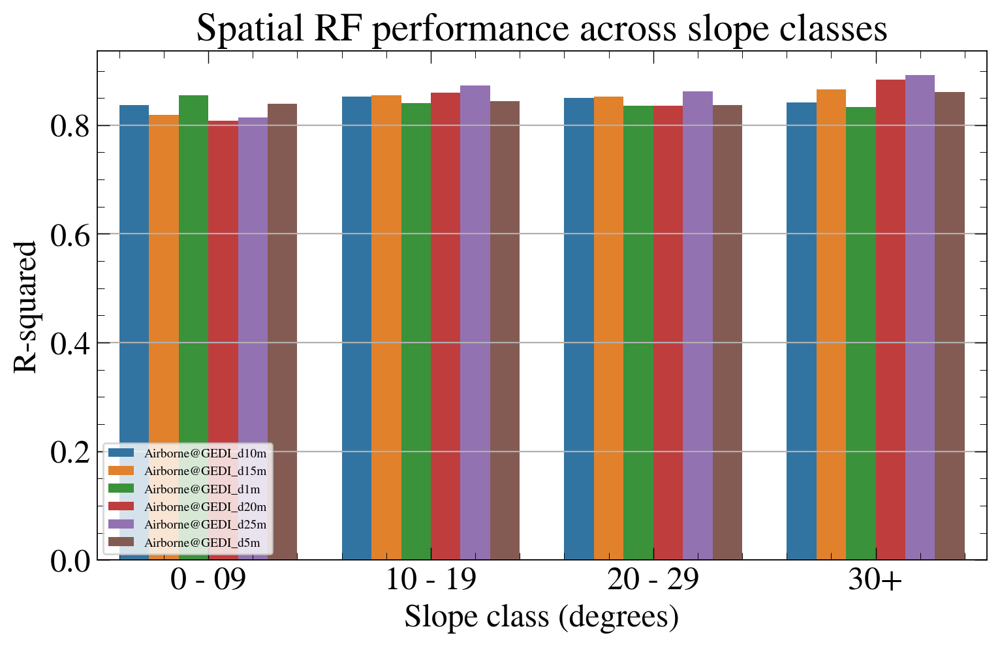

In [22]:
plot_results(results_gedi, "R2_RF_spatial", "spatial")

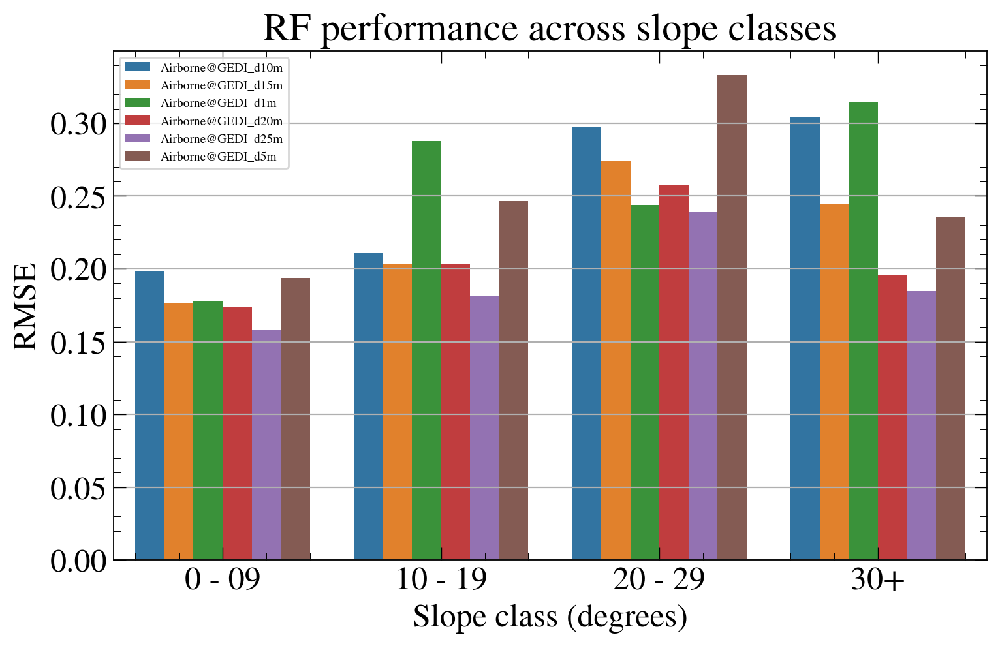

In [23]:
plot_results(results_gedi, "RMSE_RF", "non_spatial")

In [ ]:
plot_results(results_gedi, "R2_RF", "non_spatial")

In [24]:
# # separate datasets
# results_gedi = results_df[results_df["dataset"].str.startswith("Airborne@GEDI")].copy()
# results_icesat2 = results_df[results_df["dataset"].str.startswith("Airborne@ATL08")].copy()

# gedi_filename = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/results_airborne_gedi.csv"
# icesat2_filename = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/results_airborne_icesat2.csv")

# results_gedi.to_csv(gedi_filename, index=False)
# results_icesat2.to_csv(icesat2_filename, index=False)

In [25]:
# # separate datasets
# df_all_results_gedi = df_all[df_all["dataset"].str.startswith("Airborne@GEDI")].copy()
# df_all_results_icesat2 = df_all[df_all["dataset"].str.startswith("Airborne@ATL08")].copy()

# df_all_gedi_filename = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/df_all_airborne_gedi.csv"
# df_all_icesat2_filename = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/df_all_airborne_icesat2.csv")

# df_all_results_gedi.to_csv(df_all_gedi_filename, index=False)
# df_all_results_icesat2.to_csv(df_all_icesat2_filename, index=False)

In [25]:
df_all_gedi_filename = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/results_airborne_gedi.csv"
df_all_icesat2_filename = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/results_airborne_icesat2.csv")

df_all_results_gedi = pd.read_csv(df_all_gedi_filename)
df_all_results_icesat2 = pd.read_csv(df_all_icesat2_filename)

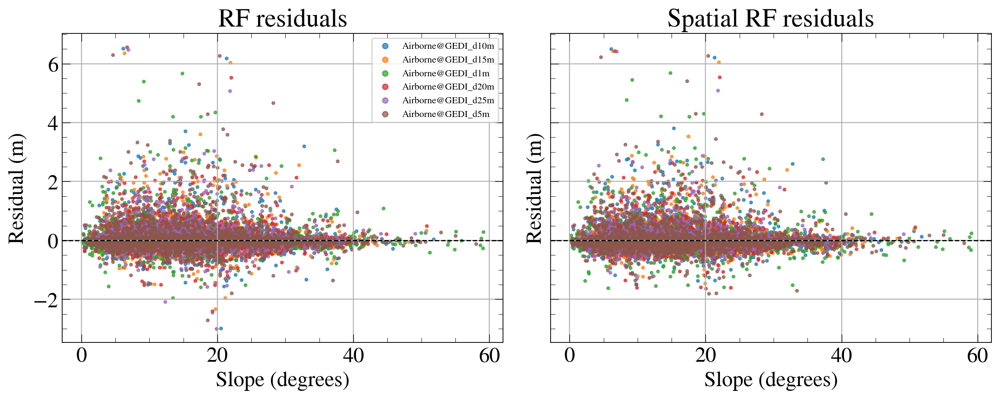

In [31]:
# ---------------------------------------------------
# Residual vs slope scatter (by dataset and model)
# ---------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

for ax, resid_col, title in [
    (axes[0], "resid_rf",  "RF residuals"),
    (axes[1], "resid_srf", "Spatial RF residuals"),
]:
    for dataset_name, df_ds in df_all_results_gedi.groupby("dataset"):
        ax.scatter(df_ds["slope_deg"], df_ds[resid_col],
                   s=5, alpha=0.7, label=dataset_name)
    ax.axhline(0, color="k", linestyle="--", linewidth=1)
    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Residual (m)")
    ax.set_title(title)

axes[0].legend(markerscale=2, fontsize=8)
plt.tight_layout()
plt.show()

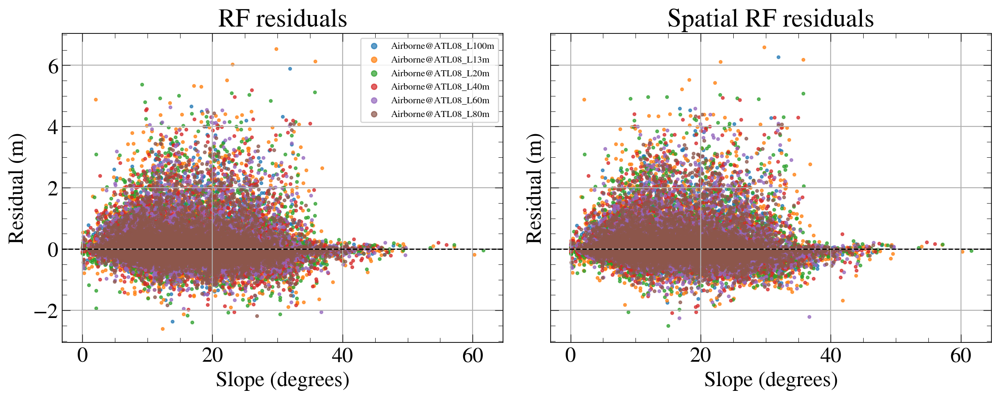

In [32]:
# ---------------------------------------------------
# Residual vs slope scatter (by dataset and model)
# ---------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

for ax, resid_col, title in [
    (axes[0], "resid_rf",  "RF residuals"),
    (axes[1], "resid_srf", "Spatial RF residuals"),
]:
    for dataset_name, df_ds in df_all_results_icesat2.groupby("dataset"):
        ax.scatter(df_ds["slope_deg"], df_ds[resid_col],
                   s=5, alpha=0.7, label=dataset_name)
    ax.axhline(0, color="k", linestyle="--", linewidth=1)
    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Residual (m)")
    ax.set_title(title)

axes[0].legend(markerscale=2, fontsize=8)
plt.tight_layout()
plt.show()

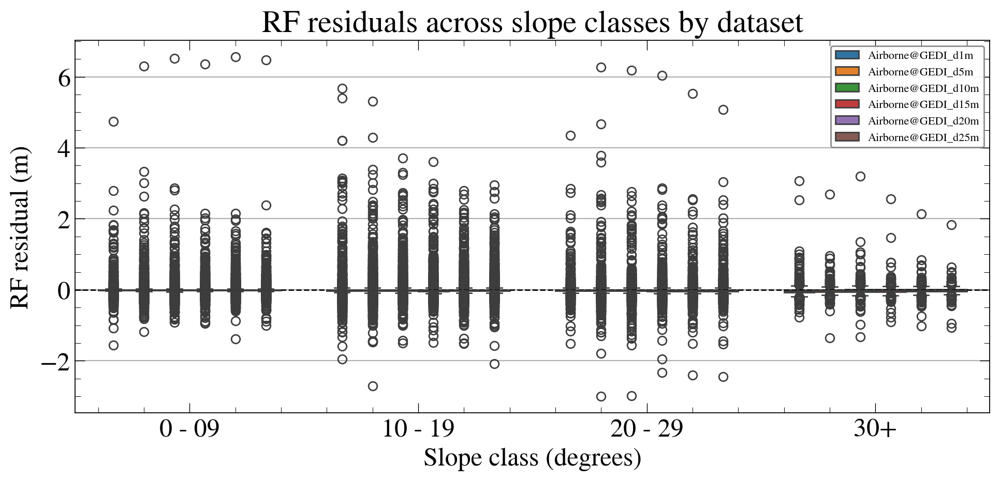

In [33]:
# ---------------------------------------------------
# Boxplots of residuals by slope bin
# ---------------------------------------------------
plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    data=df_all_results_gedi,
    x="slope_bin",
    y="resid_rf",
    hue="dataset"
)
plt.axhline(0, color="k", linestyle="--", linewidth=1)
plt.ylabel("RF residual (m)")
plt.xlabel("Slope class (degrees)")
plt.title("RF residuals across slope classes by dataset")

# Put legend in a boxed frame
leg = ax.legend(
    fontsize=8,
    title_fontsize=9,
    frameon=True,           # turn on box
    fancybox=True,          # rounded corners
    framealpha=0.9,         # slight transparency
    edgecolor="grey",      # border color
    facecolor="white",      # background color
)
plt.tight_layout()
plt.show()

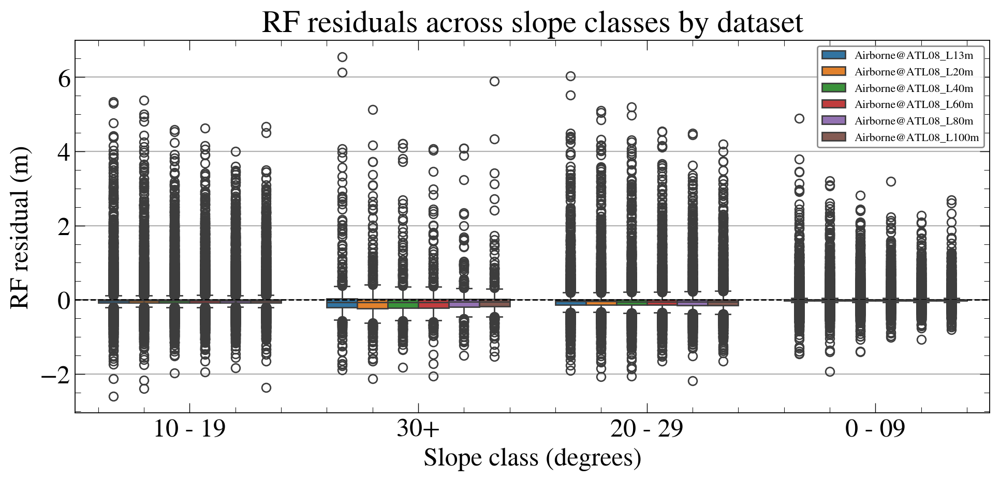

In [34]:
# ---------------------------------------------------
# Boxplots of residuals by slope bin
# ---------------------------------------------------
plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    data=df_all_results_icesat2,
    x="slope_bin",
    y="resid_rf",
    hue="dataset"
)
plt.axhline(0, color="k", linestyle="--", linewidth=1)
plt.ylabel("RF residual (m)")
plt.xlabel("Slope class (degrees)")
plt.title("RF residuals across slope classes by dataset")

# Put legend in a boxed frame
leg = ax.legend(
    fontsize=8,
    title_fontsize=9,
    frameon=True,           # turn on box
    fancybox=True,          # rounded corners
    framealpha=0.9,         # slight transparency
    edgecolor="grey",      # border color
    facecolor="white",      # background color
)
plt.tight_layout()
plt.show()

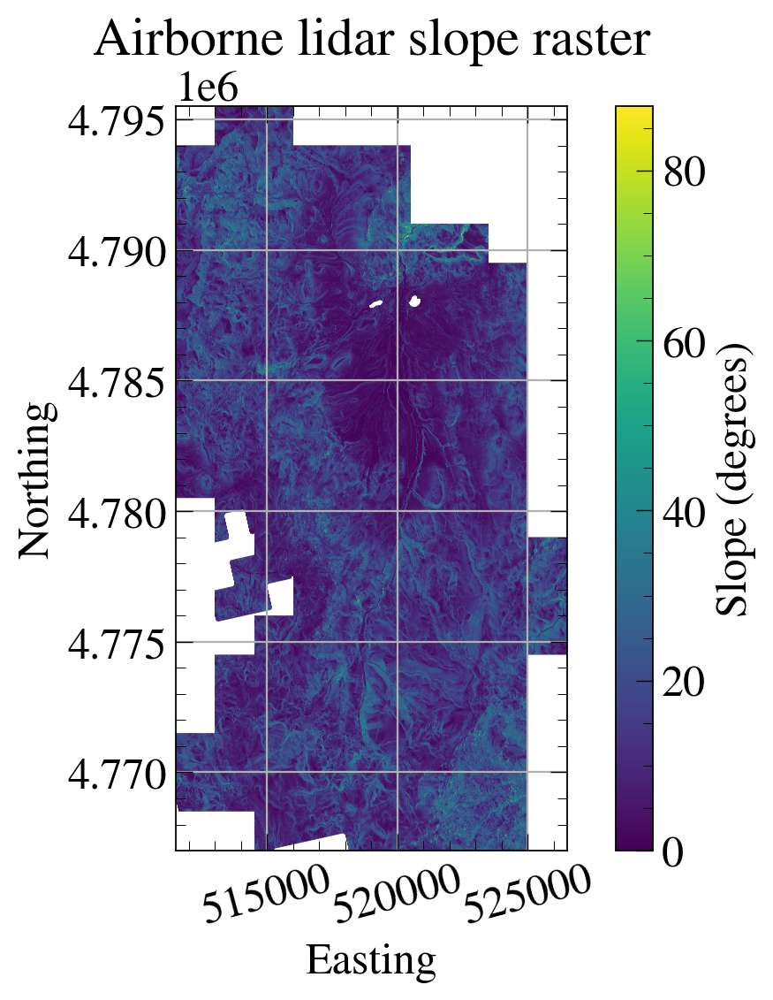

In [20]:
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/lidar_slope_deg.tif"
with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar slope raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Slope (degrees)")
plt.tight_layout(); plt.show()

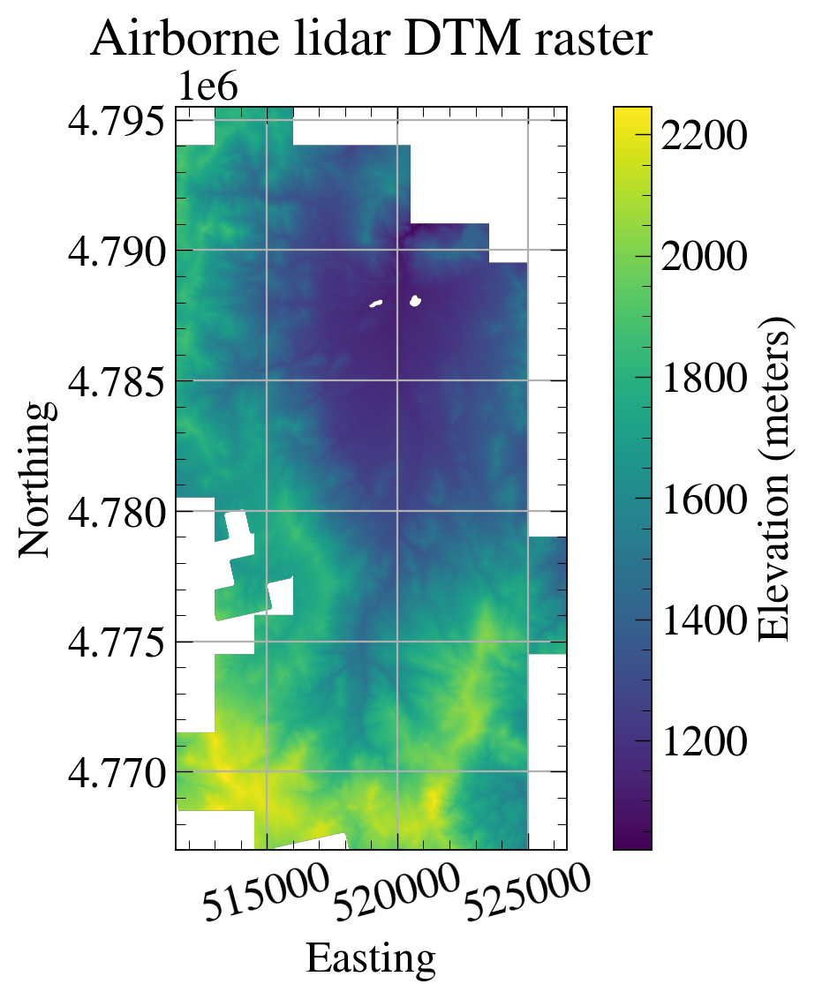

In [21]:
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/lidar_dtm_mosaic.tif"
with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar DTM raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Elevation (meters)")
plt.tight_layout(); plt.show()

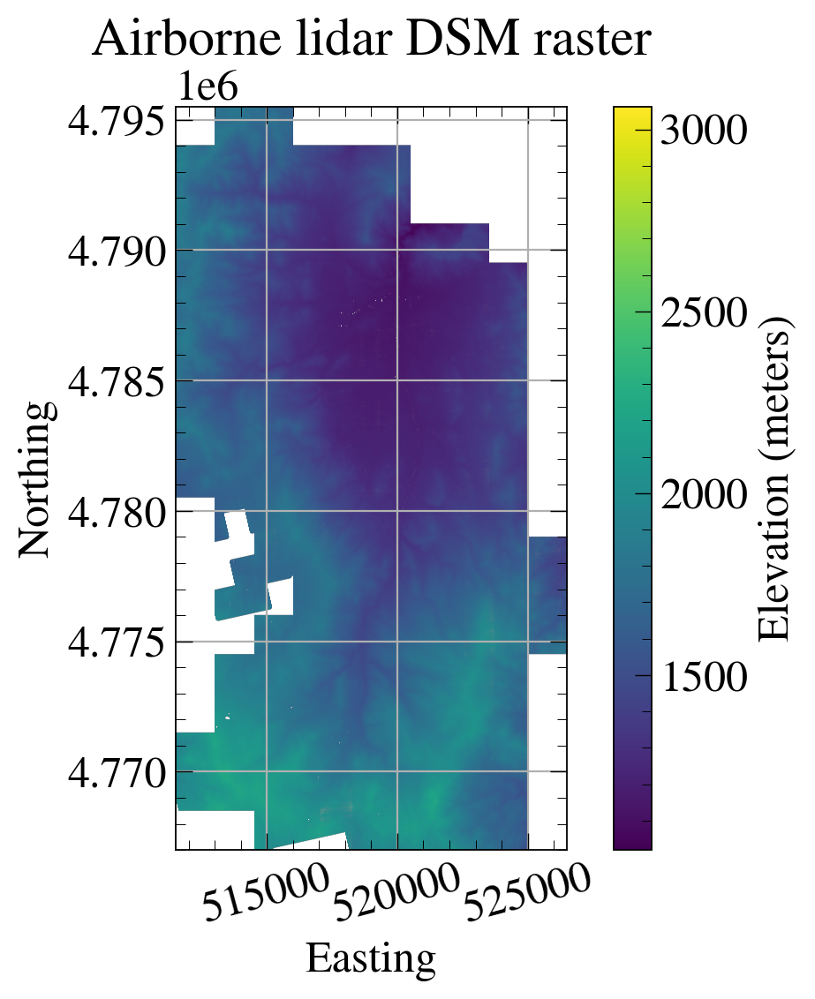

In [22]:
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/lidar_dsm_mosaic.tif"
with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar DSM raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Elevation (meters)")
plt.tight_layout(); plt.show()

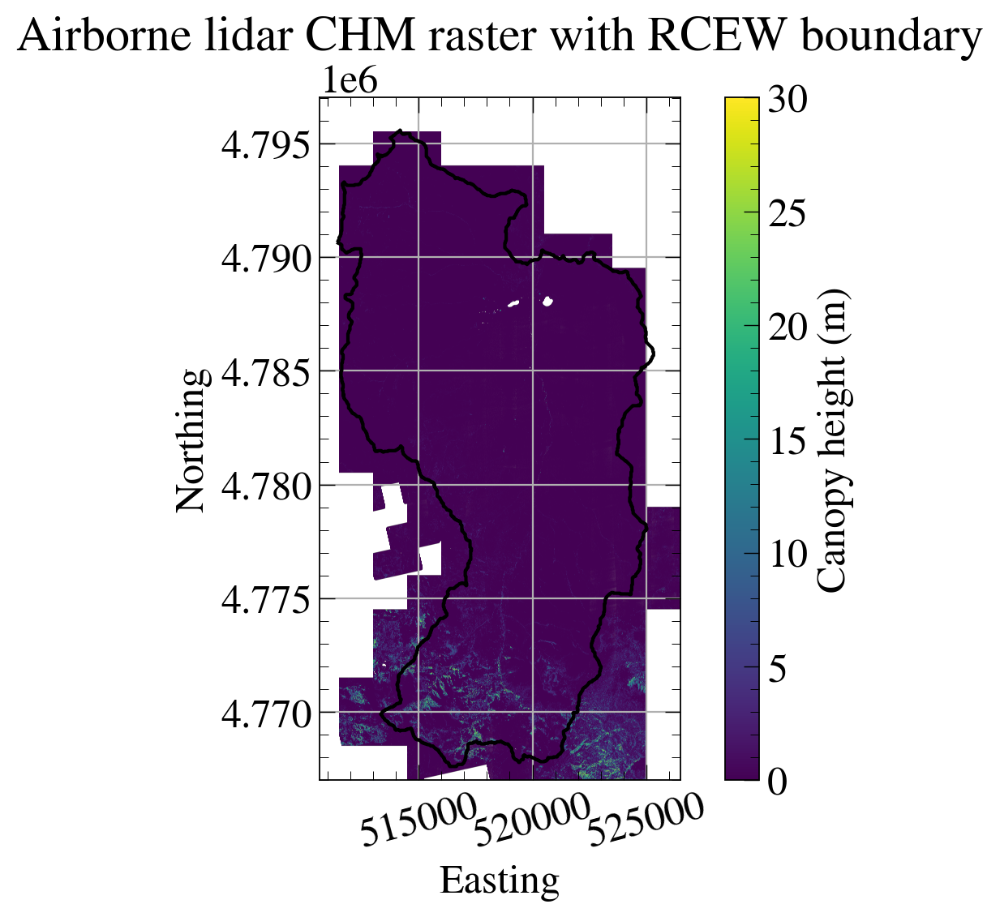

In [31]:
import numpy as np
import rasterio
from rasterio.plot import plotting_extent
import matplotlib.pyplot as plt
import geopandas as gpd

# -----------------------
# Paths
# -----------------------
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/lidar_chm_mosaic.tif"
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"

# -----------------------
# Read raster
# -----------------------
with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)
    raster_crs = ds.crs
    
# -------------------------------
# Read shapefile and match CRS
# -------------------------------
shapefile = gpd.read_file(shp)
# Reproject shapefile to raster CRS
shapefile = shapefile.to_crs(raster_crs)

# -----------------------
# Plot raster + boundary
# -----------------------
fig, ax = plt.subplots(figsize=(8, 6))

# Raster
im = ax.imshow(arr, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)

# Shapefile overlay (as outline)
shapefile.boundary.plot(ax=ax, edgecolor="red", linewidth=1.5)

ax.set_title("Airborne lidar CHM raster with RCEW boundary")
ax.set_xlabel("Easting")
ax.set_ylabel("Northing")

cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Canopy height (m)")

plt.tight_layout()
plt.show()

In [28]:
from sliderule import sliderule, icesat2, earthdata

# Projected CRS
projected_crs = "epsg:6340"  # Horizontal transformation: The EPSG code for NAD83/UTM zone 11N is 26911 (1983) or 6340 (2011).
# Specify region of interest shapefile
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"
shapefile = gpd.read_file(shp)
shapefile.crs is None
shapefile = shapefile.to_crs(projected_crs)
# shapefile.to_file('/bsuhome/tnde/geoscience/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson', driver='GeoJSON')


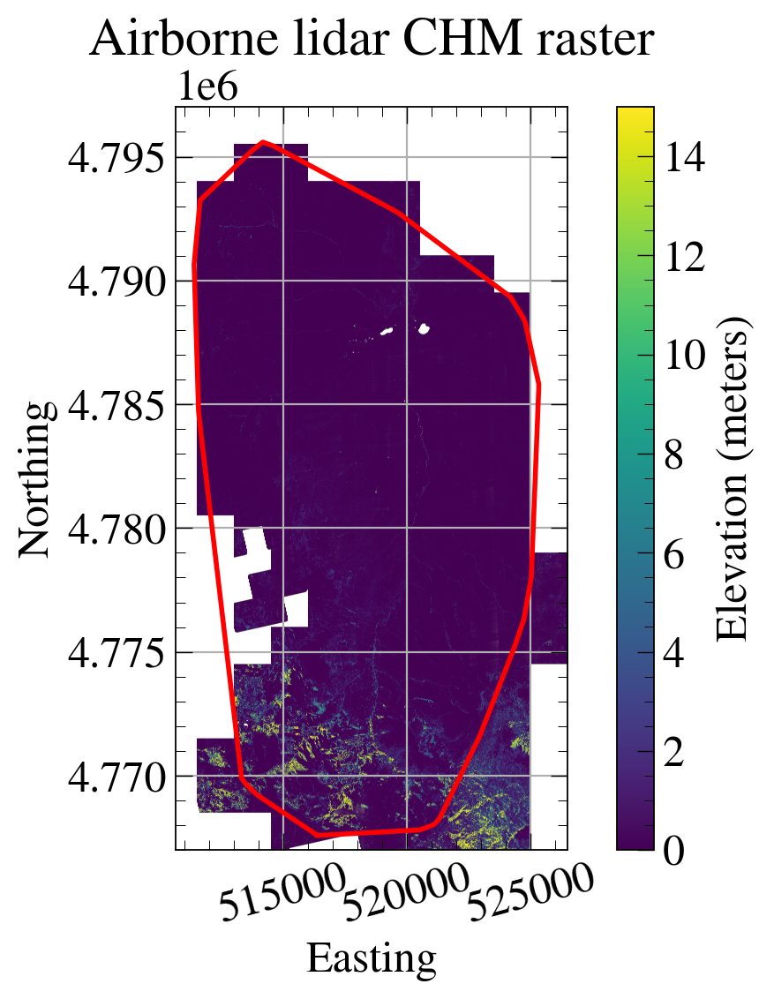

In [29]:
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/lidar_chm_mosaic.tif"
with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, extent=extent, origin="upper")
plt.plot(region_lon, region_lat, linewidth=2, color='r')
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar CHM raster")
plt.xlabel("Easting"); plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Elevation (meters)")
plt.tight_layout(); plt.show()

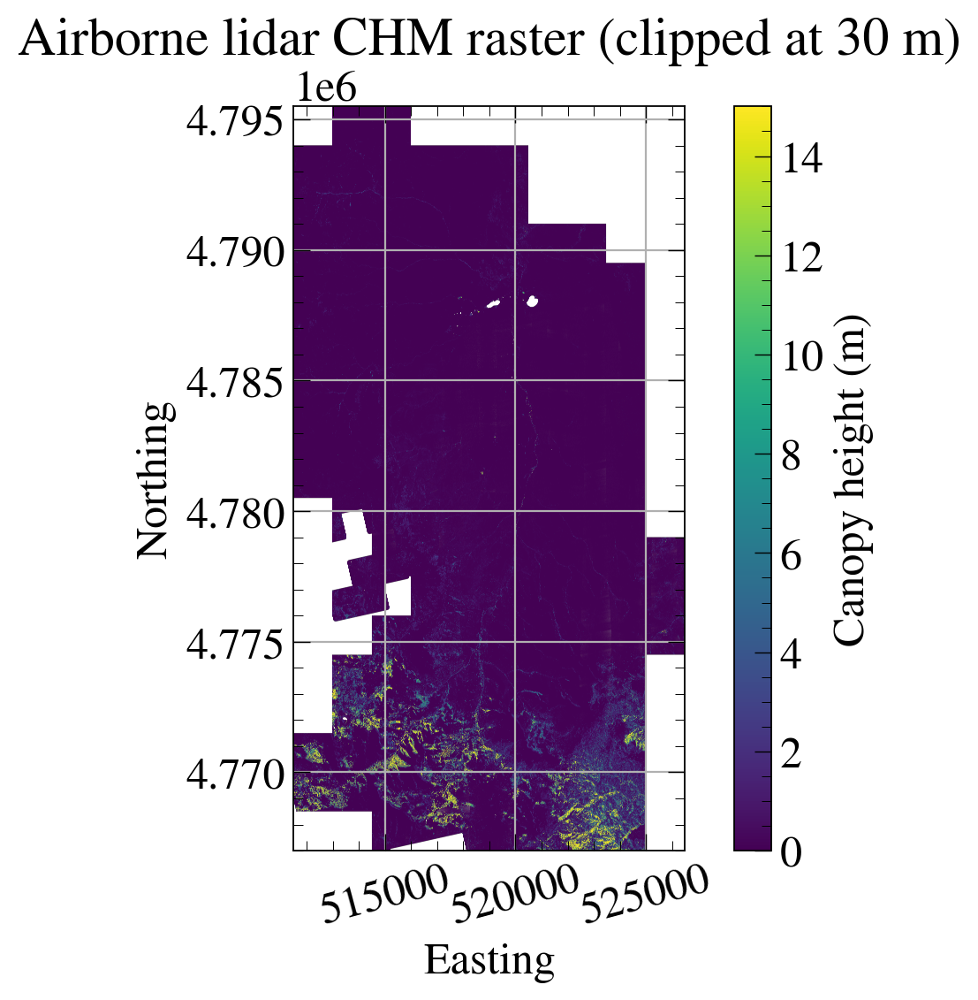

In [27]:
dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/lidar_chm_mosaic_nonclipped.tif"

with rasterio.open(dsm_path) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

    # ---- clip CHM to max 30 m ----
    arr_clipped = np.clip(arr, a_min=0, a_max=25)

plt.figure(figsize=(8, 6))
im = plt.imshow(arr_clipped, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=15)
plt.title("Airborne lidar CHM raster")
plt.xlabel("Easting")
plt.ylabel("Northing")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Canopy height (m)")
plt.tight_layout()
plt.show()


In [27]:
# # =========================
# # CONFIG
# # =========================
# # Input tile directories
# DTM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/las_dtm/")    # GeoTIFF tiles
# DSM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/lasgrid_dsm/")    # Optional, for CHM

# # Optionally, set CHM_DIR and skip DSM
# CHM_DIR = None  # e.g., Path("/path/to/chm_tiles") or None

# # Outputs
# OUT_DIR = Path(Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/") )
# OUT_DIR.mkdir(parents=True, exist_ok=True)

# DTM_MOSAIC = OUT_DIR / "lidar_dtm_mosaic.tif"
# DSM_MOSAIC = OUT_DIR / "lidar_dsm_mosaic.tif"
# CHM_MOSAIC = OUT_DIR / "lidar_chm_mosaic.tif"
# SLOPE_MOSAIC = OUT_DIR / "lidar_slope_deg.tif"

# # GEDI and ATL08 vectors
# GEDI_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/gedi_ml2.geojson")
# ATL08_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/icesat2_ml_final.geojson")

# # Column names for vegetation height in the vector attribute tables
# gedi_height_col = "rh_80"          # or "rh_100"
# atl08_height_col = "h_mean_canopy"     # or "h_max_canopy"

# # Approximate footprint buffers (meters)
# gedi_buffer_m = 12.5

# # CRS to use for all rasters and vectors (projected! so the buffers are in meters)
# # If DTM tiles already have a projected CRS, you can leave this as None to keep native.
# TARGET_CRS = None  # e.g., "EPSG:6340" or None

# # ---------------------
# # Utility: find rasters
# # ---------------------
# def list_tifs(folder: Path):
#     return sorted([str(p) for p in folder.glob("*.tif")])

# # --------------------------------
# # Mosaic tiles into one GeoTIFF
# # --------------------------------
# def mosaic_tiles(tif_list, dst_path, target_crs=None, dst_dtype="float32", resampling=Resampling.bilinear):
#     if len(tif_list) == 0:
#         raise FileNotFoundError(f"No GeoTIFFs found to mosaic for {dst_path}")
#     srcs = [rasterio.open(p) for p in tif_list]

#     # Reproject on the fly if target_crs is requested and differs
#     if target_crs is not None:
#         target_crs = CRS.from_user_input(target_crs)

#     # Merge (note: rasterio.merge will reproject if 'precision' and 'res' differ. We will keep simple merge.)
#     mosaic, out_transform = rasterio.merge.merge(srcs, resampling=resampling)
#     out_meta = srcs[0].meta.copy()
#     out_meta.update({
#         "height": mosaic.shape[1],
#         "width": mosaic.shape[2],
#         "transform": out_transform,
#         "dtype": dst_dtype
#     })

#     # Write temp
#     with rasterio.open(dst_path, "w", **out_meta) as dst:
#         dst.write(mosaic.astype(dst_dtype))

#     # Optionally, reproject to target_crs
#     if target_crs is not None and out_meta.get("crs") and CRS.from_user_input(out_meta["crs"]) != target_crs:
#         reproj_path = dst_path.with_name(dst_path.stem + f"_{target_crs.to_authority()[0]}{target_crs.to_authority()[1]}.tif")
#         reproject_to(dst_path, reproj_path, target_crs)
#         os.replace(reproj_path, dst_path)

#     for s in srcs:
#         s.close()

#     return str(dst_path)

# # ---------------------------
# # Reproject a raster to a CRS
# # ---------------------------
# def reproject_to(src_path, dst_path, target_crs):
#     with rasterio.open(src_path) as src:
#         transform, width, height = rasterio.warp.calculate_default_transform(
#             src.crs, target_crs, src.width, src.height, *src.bounds
#         )
#         kwargs = src.meta.copy()
#         kwargs.update({
#             "crs": target_crs,
#             "transform": transform,
#             "width": width,
#             "height": height
#         })
#         with rasterio.open(dst_path, "w", **kwargs) as dst:
#             for i in range(1, src.count + 1):
#                 rasterio.warp.reproject(
#                     source=rasterio.band(src, i),
#                     destination=rasterio.band(dst, i),
#                     src_transform=src.transform,
#                     src_crs=src.crs,
#                     dst_transform=transform,
#                     dst_crs=target_crs,
#                     resampling=Resampling.bilinear
#                 )
#     return str(dst_path)

# # ----------------------------------------
# # Compute CHM mosaic as DSM - DTM 
# # ----------------------------------------
# def compute_chm(dsm_path, dtm_path, out_path, nodata_out=-9999, max_height=15):
#     with rasterio.open(dsm_path) as dsm, rasterio.open(dtm_path) as dtm:
#         if dsm.crs != dtm.crs:
#             raise ValueError("DSM and DTM must share the same CRS. Reproject first.")
#         if (dsm.transform != dtm.transform) or (dsm.width != dtm.width) or (dsm.height != dtm.height):
#             raise ValueError("DSM and DTM grids must be aligned. Resample/reproject one to the other.")

#         dsm_arr = dsm.read(1).astype("float32")
#         dtm_arr = dtm.read(1).astype("float32")

#         # Build valid mask from nodata or non-finite
#         dsm_nd = dsm.nodata
#         dtm_nd = dtm.nodata
#         valid = np.isfinite(dsm_arr) & np.isfinite(dtm_arr)
#         if dsm_nd is not None:
#             valid &= dsm_arr != dsm_nd
#         if dtm_nd is not None:
#             valid &= dtm_arr != dtm_nd

#         chm = np.full_like(dtm_arr, np.float32(nodata_out))
#         chm[valid] = dsm_arr[valid] - dtm_arr[valid]

#         # Clean up: no negatives, and cap improbable outliers
#         chm[valid & (chm < 0)] = 0.0
#         chm[valid & (chm > max_height)] = max_height  # optional but helpful for plotting

#         meta = dtm.meta.copy()
#         meta.update(dtype="float32", nodata=nodata_out)

#         with rasterio.open(out_path, "w", **meta) as dst:
#             dst.write(chm, 1)

#     return str(out_path)

# # --------------------
# # Compute slope (degrees)
# # --------------------
# def compute_slope_deg(dtm_path, out_path):
#     dem = rd.LoadGDAL(str(dtm_path))
#     slope = rd.TerrainAttribute(dem, attrib='slope_degrees')
#     rd.SaveGDAL(str(out_path), slope)
#     return str(out_path)

# # ---------------------------------------------------------
# # Buffer points in meters (handles reprojection for buffer)
# # ---------------------------------------------------------
# def buffer_points(gdf, buffer_m, target_crs=None):
#     """
#     Returns polygons (buffers) in a projected CRS so 'buffer_m' is in meters.
#     If target_crs is None, uses the current CRS if it's projected; otherwise raises.
#     """
#     if target_crs is None:
#         # If gdf.crs is geographic (degrees), you must pass a projected CRS
#         if gdf.crs is None or CRS.from_user_input(gdf.crs).is_geographic:
#             raise ValueError("Geographic CRS detected. Please set TARGET_CRS to a projected CRS (meters).")
#         work_crs = gdf.crs
#         gdf_proj = gdf
#     else:
#         work_crs = CRS.from_user_input(target_crs)
#         gdf_proj = gdf.to_crs(work_crs)

#     gdf_proj = gdf_proj.copy()
#     gdf_proj["geometry"] = gdf_proj.geometry.buffer(buffer_m)
#     return gdf_proj

# # ----------------------------------------------------------
# # Zonal stats helper: get mean/std/p95 from raster per geom
# # ----------------------------------------------------------
# def zonal_stats_df(geoms_gdf, raster_path, stats=("mean","std","percentile_95"), prefix="slope_"):
#     zs = zonal_stats(
#         geoms_gdf,
#         raster_path,
#         stats=list(stats),
#         nodata=None,
#         geojson_out=False
#     )
#     out = pd.DataFrame(zs)
#     out = out.add_prefix(prefix)
#     # out = out[out["slope_mean"].notna()]
#     return out

# # ---------- ICESat-2 helpers: track ends + rectangle corners ----------

# def icesat2_gt_endflag(df: pd.DataFrame) -> np.ndarray:
#     """
#     Flag starts/ends of tracks defined by (date, gt).
#     Assumes df has columns: 'time' (datetime64) and 'gt' (beam/ground track).
#     Logically find the ends of unique ICESat-2 ground tracks according to dates.
    
#     Steps:
#     - We sort data first by time and then ground track (gt) to make sure all the points are ordered correctly. 
#     - Use the unique function to identify the first instance of unique pairs of date and gt in the dataset thus giving the start of a new track. 
#     - Identify the row above each track start as the end of the previous track.
    
#     Parameters:
#     - icesat2_df: ICESat-2 dataframe, assumed to be a pandas DataFrame with 'time' (datetime64), 'gt' (beam), and 'norths' already defined.

#     Returns:
#     - end_flag: 0/1 array same length as df - logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
#       It is helps to avoid wrapping errors at track edges.
#     """
    
#     # Sort by 'time' and 'gt'
#     sdf = df.sort_values(by=["time", "gt"]).reset_index(drop=True)
    
#     # Extract only the date (ignore time of day)
#     dates = pd.to_datetime(sdf["time"]).dt.date
    
#     # Create a combined key of date and 'gt' and find first occurrence
#     first_idx = pd.DataFrame({"date": dates, "gt": sdf["gt"]}).drop_duplicates(keep="first").index
    
#     # Initialize end_flag with zeros (same length as number of rows)
#     end_flag = np.zeros(len(sdf), dtype=int)
    
#     # Flag unique_refs
#     end_flag[first_idx] = 1
    
#     # Also flag the entry just before each unique_ref (unless it's 0)
#     for idx in first_idx:
#         if idx > 0:
#             end_flag[idx - 1] = 1
            
#     # Flag the last element
#     end_flag[-1] = 1
#     return end_flag
#     # Return in original row order
#     # ef = pd.Series(end_flag, index=sdf.index)
#     # return ef#.sort_index().values

# def icesat2_footprint_corners(norths: np.ndarray,
#                               easts: np.ndarray,
#                               default_length: float,
#                               end_flag: np.ndarray):
#     """
#     Calculate ICESat-2 footprint corners and orientation angles.
#     This code inherently includes bearing-based orientation using the geometry of the ground track.
    
#     Build oriented rectangles using local track bearing.
#     theta is computed as arctan2(dN, dE) -> angle from East (x-axis)
    
#     Parameters:
#     - norths: array of northing coordinates.
#     - easts: array of easting coordinates.
#     - default_length: default footprint length (e.g., 100 for ATLO8 or 40 meters for ATL06).
#     - end_flag: logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
#       It is helps to avoid wrapping errors at track edges.

#     Returns:
#     - xc: x corner coordinates (N x 6)
#     - yc: y corner coordinates (N x 6)
#     - theta: footprint orientation angles (N,). The angle theta between the icesat2 track and due east
#     """
#     footwidth = 13.0  # meters (full width)
#     n = norths.shape[0]
#     theta = np.full((n, 2), np.nan, dtype="float64")
#     xc = np.full((n, 6), np.nan, dtype="float64")
#     yc = np.full((n, 6), np.nan, dtype="float64")

#     # create polygons of ICESat-2 footprints
#     for r in range(n-1):
#         if r == 0 or (end_flag[r] - end_flag[r-1]) == 0: # only angle pointed forwards
#             theta[r, 0] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
#             theta[r, 1] = theta[r, 0]
#             footlength = default_length
#         elif r == n-1 or (end_flag[r] - end_flag[r+1]) == 0: # only angle pointed backwards
#             theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
#             theta[r, 1] = theta[r, 0]
#             footlength = default_length
#         else: # calculate angles in each direction
#             theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
#             theta[r, 1] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
#             # footlength = 0.5 * np.hypot(norths[r+1]-norths[r-1], easts[r+1]-easts[r-1])
#             footlength = 0.5 * np.sqrt((norths[r + 1] - norths[r - 1])**2 + (easts[r + 1] - easts[r - 1])**2)

#         # along-track ends (angle from East). Find box edges along the RGT
#         back_x  = easts[r] - (footlength/2.0) * np.cos(np.radians(theta[r, 0]))
#         back_y  = norths[r] - (footlength/2.0) * np.sin(np.radians(theta[r, 0]))
#         front_x = easts[r] + (footlength/2.0) * np.cos(np.radians(theta[r, 1]))
#         front_y = norths[r] + (footlength/2.0) * np.sin(np.radians(theta[r, 1]))

#         mean_theta = np.nanmean(theta[r, :])

#         # cross-track offsets at center. Find box edges perpendicular to the centroid
#         xc[r, 0] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta + 90))
#         yc[r, 0] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta + 90))
#         xc[r, 1] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta - 90))
#         yc[r, 1] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta - 90))

#         # rectangle corners at back and front. Solve for corner coordinates
#         xc[r, 2] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] + 90))
#         yc[r, 2] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] + 90))
#         xc[r, 3] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] - 90))
#         yc[r, 3] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] - 90))
#         xc[r, 4] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] - 90))
#         yc[r, 4] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] - 90))
#         xc[r, 5] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] + 90))
#         yc[r, 5] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] + 90))

#     return xc, yc

# # ---------------------------------------------------
# # pipeline: mosaic, slope, CHM
# # ---------------------------------------------------
# # Mosaic DTM
# dtm_tiles = list_tifs(DTM_DIR)
# m_dtm = mosaic_tiles(dtm_tiles, DTM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")

# # CHM (either from DSM tiles or CHM tiles)
# have_chm = False
# if CHM_DIR is not None:
#     chm_tiles = list_tifs(CHM_DIR)
#     if len(chm_tiles) > 0:
#         m_chm = mosaic_tiles(chm_tiles, CHM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
#         have_chm = True

# elif DSM_DIR is not None and len(list_tifs(DSM_DIR)) > 0:
#     # Mosaic DSM, then CHM
#     m_dsm = mosaic_tiles(list_tifs(DSM_DIR), DSM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
#     # Make sure DSM and DTM mosaics share grid; reproject DSM to DTM's exact grid if needed
#     with rasterio.open(m_dtm) as dtm_src, rasterio.open(m_dsm) as dsm_src:
#         if (dsm_src.crs != dtm_src.crs) or (dsm_src.transform != dtm_src.transform) \
#            or (dsm_src.width != dtm_src.width) or (dsm_src.height != dtm_src.height):
#             # Resample DSM to DTM grid
#             aligned_dsm = OUT_DIR / "lidar_dsm_mosaic_aligned.tif"
#             with rasterio.open(aligned_dsm, "w", **dtm_src.meta) as dst:
#                 dst_arr = dst.read(1)  # just to allocate; we will overwrite
#             with rasterio.open(m_dsm) as s, rasterio.open(str(aligned_dsm), "r+") as d:
#                 dst_arr = np.empty((dtm_src.height, dtm_src.width), dtype="float32")
#                 rasterio.warp.reproject(
#                     source=rasterio.band(s, 1),
#                     destination=dst_arr,
#                     src_transform=s.transform,
#                     src_crs=s.crs,
#                     dst_transform=dtm_src.transform,
#                     dst_crs=dtm_src.crs,
#                     resampling=Resampling.bilinear
#                 )
#                 d.write(dst_arr, 1)
#             m_dsm = str(aligned_dsm)

#     m_chm = compute_chm(m_dsm, m_dtm, CHM_MOSAIC)
#     have_chm = True

# # Slope (degrees)
# m_slope = compute_slope_deg(m_dtm, SLOPE_MOSAIC)

# # ---------------------------------------------------
# # Load vectors and prep buffers (projected CRS required)
# # ---------------------------------------------------
# target_col = "rh_80" # "rh_100"
# gedi = gpd.read_file(GEDI_VECT)
# gedi = gedi.drop(drop_cols, axis = 1)
# gedi = gedi[gedi["fhd_normal"] != -9999.000000]
# gedi = gedi[gedi[target_col] <= 15]
# gedi[target_col] = pd.to_numeric(gedi[target_col], errors="coerce").clip(upper=15)
# # gedi.head()

# from helper_functions import load_icesat2_data
# projected_crs = "epsg:6340" 
# # atl08 = gpd.read_file(ATL08_VECT)
# atl08 = load_icesat2_data(ATL08_VECT, "ATL08", process = False)
# # atl08 = atl08[atl08["gnd_ph_count"] != 0]
# atl08 = atl08[atl08["h_mean_canopy"] <= 15]
# atl08[atl08_height_col] = pd.to_numeric(atl08[atl08_height_col], errors="coerce").clip(upper=15)
# atl08 = atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
# print(f"Length of data: {len(atl08)}")
# print(atl08.crs, "\n")

# with rasterio.open(m_slope) as rs:
#     raster_crs = rs.crs

# # Reproject vectors to raster CRS (must be projected to use meter buffers)
# if CRS.from_user_input(raster_crs).is_geographic:
#     raise ValueError("Slope raster is in a geographic CRS. Reproject your DTM to a projected CRS (meters).")

# gedi = gedi.to_crs(raster_crs)
# atl08 = atl08.to_crs(raster_crs)

# gedi_buf = buffer_points(gedi, gedi_buffer_m, target_crs=None)   # already projected

# # ---------- Build 100x13 m oriented rectangles for ATL08 ----------
# # ATL08 is already projected to the raster CRS (meters) above
# # Required columns: 'Easting', 'Northing', 'time' (datetime64), 'gt' (beam/track id)

# # End flags (avoid wrapping across tracks/days)
# ef = icesat2_gt_endflag(atl08)

# # Rectangle corners 
# norths = pd.to_numeric(atl08["Northing"], errors="coerce").values
# easts  = pd.to_numeric(atl08["Easting"],  errors="coerce").values
# xc, yc = icesat2_footprint_corners(norths, easts, default_length=100.0, end_flag=ef)

# # Build shapely Polygons from corners (use indices we actually filled)
# from shapely.geometry import Polygon
# rows = []
# rect_geoms = []
# for i in range(xc.shape[0]):
#     if np.any(np.isnan(xc[i, 2:6])) or np.any(np.isnan(yc[i, 2:6])):
#         continue
#     rect = ShpPolygon([(xc[i,2], yc[i,2]), 
#                        (xc[i,3], yc[i,3]), 
#                        (xc[i,4], yc[i,4]), 
#                        (xc[i,5], yc[i,5])])
#     rect_geoms.append(rect)
#     rows.append(i)

# # Create a GeoDataFrame aligned to the kept rows
# atl08_rects = atl08.iloc[rows].copy()
# atl08_rects.set_geometry(gpd.GeoSeries(rect_geoms, index=atl08_rects.index), inplace=True)
# # (CRS already set via atl08.to_crs(raster_crs) earlier)

# # ---------------------------------------------------
# # Zonal stats: slope under GEDI and ATL08 footprints
# # ---------------------------------------------------
# gedi_slope_df = zonal_stats_df(gedi_buf, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")
# atl08_slope_df = zonal_stats_df(atl08_rects, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")

# # Attach back to GeoDataFrames
# gediX = gedi.copy()
# atl08X = atl08_rects.copy()
# for col in gedi_slope_df.columns:
#     gediX[col] = gedi_slope_df[col]
# for col in atl08_slope_df.columns:
#     atl08X[col] = atl08_slope_df[col]
    
# # # Titus
# # norths = atl08["Northing"].values
# # easts  = atl08["Northing"].values
# # xc, yc = icesat2_footprint_corners(norths, easts, default_length=100.0, end_flag=ef)
# # # Titus
    
# # # Titus
# # # Call function to get segment corners
# # # Plot setup
# # fig, ax = plt.subplots(figsize=(10, 18))
# # rows = []
# # rect_geoms = []

# # # ICESat-2 ATL08 segments: Iterate over segments to create polygon patches
# # from matplotlib.patches import Circle, Polygon
# # for i in range(xc.shape[0]):
# #     if np.any(np.isnan(xc[i])) or np.any(np.isnan(yc[i])):
# #         continue  # Skip invalid segments
    
# #     # Create polygon from the 6 corners (can also simplify to first 4 if rectangle)
# #     footprint = [(xc[i, j], yc[i, j]) for j in range(6)]
    
# #     # You can use first 4 points to form a closed rectangle if desired:
# #     rect_points = [footprint[2], footprint[3], footprint[4], footprint[5]]

# #     rect = Polygon(rect_points, closed=True)
# #     rect_geoms.append(rect)
# #     rows.append(i)

# # # Add all patches to plot
# # p1 = PatchCollection(rect_geoms, facecolor="skyblue", edgecolor="k", alpha=0.5)
# # ax.add_collection(p1)

# # # Plot segment centers
# # ax.plot(easts, norths, "ro", markersize=3, label="ICESat-2 segment centers")

# # # Create a GeoDataFrame aligned to the kept rows
# # atl08_rects = atl08.iloc[rows].copy()
# # atl08_rects.set_geometry(gpd.GeoSeries(rect_geoms, index=atl08_rects.index), inplace=True)
# # # (CRS already set via atl08.to_crs(raster_crs) earlier)

# # # ---------------------------------------------------
# # # Zonal stats: slope under GEDI and ATL08 footprints
# # # ---------------------------------------------------
# # gedi_slope_df = zonal_stats_df(gedi_buf, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")
# # atl08_slope_df = zonal_stats_df(atl08_rects, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")

# # # Attach back to GeoDataFrames
# # gediX = gedi.copy()
# # atl08X = atl08_rects.copy()
# # for col in gedi_slope_df.columns:
# #     gediX[col] = gedi_slope_df[col]
# # for col in atl08_slope_df.columns:
# #     atl08X[col] = atl08_slope_df[col]
# # # Titus


    
    
# # Small sample if huge
# to_plot = atl08_rects.sample(min(2000, len(atl08_rects))) if len(atl08_rects) > 2000 else atl08_rects

# ax = to_plot.plot(edgecolor="k", facecolor="none", linewidth=0.5, figsize=(7,7))
# ax.set_aspect("equal")
# ax.set_title("ICESat-2 ATL08 rectangular segments (100x13 m)")
# plt.show()

# # # w = to_plot.to_crs(3857)
# # ax = to_plot.plot(edgecolor="k", facecolor="none", linewidth=0.5, figsize=(7,7))
# # ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)
# # ax.set_axis_off(); plt.tight_layout(); plt.show()

# # ---------------------------------------------------
# # CHM stats (airborne height) under footprints
# # ---------------------------------------------------
# def chm_stats_df(geoms_gdf, chm_path, prefix="chm_"):
#     return zonal_stats_df(geoms_gdf, chm_path,
#                           stats=("mean","std","percentile_95"),
#                           prefix=prefix)

# if have_chm:
#     # compute stats on the buffer polygons…
#     gedi_chm_df  = chm_stats_df(gedi_buf,  m_chm, prefix="chm_")
#     atl08_chm_df = chm_stats_df(atl08_rects, m_chm, prefix="chm_")

#     # …and attach them to the existing frames that already have slope columns
#     for col in gedi_chm_df.columns:
#         gediX[col] = gedi_chm_df[col]
#     for col in atl08_chm_df.columns:
#         atl08X[col] = atl08_chm_df[col]
        
# if have_chm:
#     # cap CHM-based heights to 15 m
#     for df_ in (gediX, atl08X):
#         if "chm_mean" in df_.columns:
#             df_["chm_mean"] = pd.to_numeric(df_["chm_mean"], errors="coerce").clip(upper=15)
#         if "chm_percentile_95" in df_.columns:
#             df_["chm_percentile_95"] = pd.to_numeric(df_["chm_percentile_95"], errors="coerce").clip(upper=15)

# gediX  = gediX[gediX["slope_mean"].notna()].reset_index(drop=True)
# atl08X = atl08X[atl08X["slope_mean"].notna()].reset_index(drop=True)
        
# print("GEDI slope cols:", [c for c in gediX.columns if c.startswith("slope_")])
# print("ATL08 slope cols:", [c for c in atl08X.columns if c.startswith("slope_")])
# # Expect: ['slope_mean', 'slope_std', 'slope_percentile_95']

# if have_chm:
#     print("GEDI CHM cols:", [c for c in gediX.columns if c.startswith("chm_")])
#     print("ATL08 CHM cols:", [c for c in atl08X.columns if c.startswith("chm_")])

# assert "slope_mean" in gediX.columns and "slope_mean" in atl08X.columns
        
# # ---------------------------------------------------
# # Assemble tidy DataFrame for modeling
# # ---------------------------------------------------
# def build_df(gdf, dataset_name, height_col):
#     # pull height and slope
#     heights = pd.to_numeric(gdf[height_col], errors="coerce").astype("float32")
#     slopes  = pd.to_numeric(gdf["slope_mean"], errors="coerce").astype("float32")

#     # hard-cap heights at 15 m
#     heights = heights.clip(upper=15)

#     df = pd.DataFrame({
#         "dataset": dataset_name,
#         "height_m": heights,
#         "slope_deg": slopes,
#         "slope_std": pd.to_numeric(gdf.get("slope_std", np.nan), errors="coerce").astype("float32"),
#         "slope_p95": pd.to_numeric(gdf.get("slope_percentile_95", np.nan), errors="coerce").astype("float32"),
#     })

#     # also cap CHM-related fields if present
#     if "chm_mean" in gdf.columns:
#         df["chm_mean"] = pd.to_numeric(gdf["chm_mean"], errors="coerce").astype("float32").clip(upper=15)
#     if "chm_std" in gdf.columns:
#         df["chm_std"]  = pd.to_numeric(gdf["chm_std"], errors="coerce").astype("float32")
#     if "chm_percentile_95" in gdf.columns:
#         df["chm_p95"]  = pd.to_numeric(gdf["chm_percentile_95"], errors="coerce").astype("float32").clip(upper=15)

#     # drop rows that still have missing essentials
#     return df.dropna(subset=["height_m", "slope_deg"])

# df_gedi = build_df(gediX, "GEDI", gedi_height_col)
# df_atl8 = build_df(atl08X, "ATL08", atl08_height_col)

# # If you also want airborne-as-truth at the same points, set height_m = chm_mean
# df_airborne = None
# if have_chm:
#     # Sample slope and CHM at a hex/point grid could be done, but here we re-use footprints as support
#     # Use CHM statistics as "height_m"
#     tmp = df_gedi.copy()
#     tmp["dataset"] = "Airborne@GEDI"
#     tmp["height_m"] = tmp["chm_mean"]
#     df_airborne = tmp.dropna(subset=["height_m","slope_deg"])

# df_airborne_atl8 = None
# if have_chm:
#     tmp2 = df_atl8.copy()
#     tmp2["dataset"] = "Airborne@ATL08"
#     tmp2["height_m"] = tmp2.get("chm_mean", np.nan)
#     # ensure 15 m cap (just in case)
#     tmp2["height_m"] = pd.to_numeric(tmp2["height_m"], errors="coerce").clip(upper=15)
#     df_airborne_atl8 = tmp2.dropna(subset=["height_m","slope_deg"])
    
# # Combined for modeling and comparison
# dfs = [df_gedi, df_atl8]
# if df_airborne is not None:
#     dfs.append(df_airborne)
# if df_airborne_atl8 is not None:
#     dfs.append(df_airborne_atl8)
# df_all = pd.concat(dfs, ignore_index=True)

# # ---------------------------------
# # Modeling: OLS and Random Forest
# # ---------------------------------
# def _rmse(y_true, y_pred):
#     # Works on any sklearn version
#     try:
#         # Newer sklearn (>=0.22)
#         return mean_squared_error(y_true, y_pred, squared=False)
#     except TypeError:
#         # Older sklearn: no 'squared' kwarg
#         return np.sqrt(mean_squared_error(y_true, y_pred))

# def fit_ols(X, y):
#     Xc = sm.add_constant(X)
#     model = sm.OLS(y, Xc, missing='drop').fit()
#     yhat = model.predict(Xc)
#     r2 = r2_score(y, yhat)
#     rmse = _rmse(y, yhat)
#     return model, r2, rmse

# def fit_rf(X, y, n_estimators=400, random_state=42):
#     rf = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state, n_jobs=-1)
#     rf.fit(X, y)
#     yhat = rf.predict(X)
#     r2 = r2_score(y, yhat)
#     rmse = _rmse(y, yhat)
#     return rf, r2, rmse


# def run_models_for_group(df, features=("slope_deg",), label="height_m"):
#     X = df[list(features)].values
#     y = df[label].values

#     ols, r2_ols, rmse_ols = fit_ols(df[list(features)], df[label])
#     rf, r2_rf, rmse_rf = fit_rf(df[list(features)], df[label])

#     return {
#         "ols": ols, "r2_ols": r2_ols, "rmse_ols": rmse_ols,
#         "rf": rf, "r2_rf": r2_rf, "rmse_rf": rmse_rf
#     }

# results = {}
# for name, sub in df_all.groupby("dataset"):
#     results[name] = run_models_for_group(sub, features=("slope_deg",), label="height_m")

# # -----------------------
# # Print model summaries
# # -----------------------
# for name, res in results.items():
#     print(f"\n=== {name} ===")
#     print(f"OLS R-squared={res['r2_ols']:.3f}  RMSE={res['rmse_ols']:.3f}")
#     try:
#         print(res["ols"].summary())
#     except Exception:
#         pass
#     print(f"RF  R-squared={res['r2_rf']:.3f}  RMSE={res['rmse_rf']:.3f}")

# # -----------------------
# # Quick diagnostic plots
# # -----------------------
# def scatter_by_dataset(df_all):
#     fig, ax = plt.subplots(figsize=(6,5))
#     for k,g in df_all.groupby("dataset"):
#         ax.scatter(g["slope_deg"], g["height_m"], s=10, label=k, alpha=0.5)
#     ax.set_xlabel("Slope (degrees)")
#     ax.set_ylabel("Vegetation height (m)")
#     ax.legend()
#     ax.set_title("Height vs. Slope")
#     plt.tight_layout()
#     plt.show()

# scatter_by_dataset(df_all)

# # Optional: Partial dependence for RF (single feature)
# def rf_curve(dataset_name):
#     sub = df_all[df_all["dataset"] == dataset_name].copy()
#     if sub.empty: 
#         return
#     rf = results[dataset_name]["rf"]
#     xs = np.linspace(np.nanpercentile(sub["slope_deg"], 1),
#                      np.nanpercentile(sub["slope_deg"], 99), 200).reshape(-1,1)
#     ys = rf.predict(xs)
#     plt.figure(figsize=(6,4))
#     plt.plot(xs, ys)
#     plt.xlabel("Slope (degrees)")
#     plt.ylabel("Predicted height (m)")
#     plt.title(f"RF response curve: {dataset_name}")
#     plt.tight_layout()
#     plt.show()

# rf_curve("GEDI")
# rf_curve("ATL08")

# if "Airborne@GEDI" in results:
#     rf_curve("Airborne@GEDI")
#     rf_curve("Airborne@ATL08")

## Spatial RF - without slope

In [28]:
# # =========================
# # CONFIG
# # =========================
# # Input tile directories: GeoTIFF tiles
# DTM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/las_dtm/")    # DTM
# DSM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/lasgrid_dsm/")    # DSM

# # Optionally, set CHM_DIR and skip DSM
# CHM_DIR = None  # e.g., Path("/path/to/chm_tiles") or None

# # Outputs
# OUT_DIR = Path(Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/") )
# OUT_DIR.mkdir(parents=True, exist_ok=True)

# DTM_MOSAIC = OUT_DIR / "lidar_dtm_mosaic.tif"
# DSM_MOSAIC = OUT_DIR / "lidar_dsm_mosaic.tif"
# CHM_MOSAIC = OUT_DIR / "lidar_chm_mosaic.tif"
# SLOPE_MOSAIC = OUT_DIR / "lidar_slope_deg.tif"

# # GEDI and ATL08 vectors
# GEDI_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/gedi_ml2.geojson")
# ATL08_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/icesat2_ml_final.geojson")

# # Column names for vegetation height in the vector attribute tables
# gedi_height_col = "rh_80"          # or "rh_100"
# atl08_height_col = "h_mean_canopy"     # or "h_max_canopy"

# # Approximate footprint buffers (meters)
# gedi_buffer_m = 12.5

# # CRS to use for all rasters and vectors (projected! so the buffers are in meters)
# # If DTM tiles already have a projected CRS, you can leave this as None to keep native.
# TARGET_CRS = None  # e.g., "EPSG:6340" or None

# # ---------------------
# # Utility: find rasters
# # ---------------------
# def list_tifs(folder: Path):
#     return sorted([str(p) for p in folder.glob("*.tif")])

# # --------------------------------
# # Mosaic tiles into one GeoTIFF
# # --------------------------------
# def mosaic_tiles(tif_list, dst_path, target_crs=None, dst_dtype="float32", resampling=Resampling.bilinear):
#     if len(tif_list) == 0:
#         raise FileNotFoundError(f"No GeoTIFFs found to mosaic for {dst_path}")
#     srcs = [rasterio.open(p) for p in tif_list]

#     # Reproject on the fly if target_crs is requested and differs
#     if target_crs is not None:
#         target_crs = CRS.from_user_input(target_crs)

#     # Merge (note: rasterio.merge will reproject if 'precision' and 'res' differ. We will keep simple merge.)
#     mosaic, out_transform = rasterio.merge.merge(srcs, resampling=resampling)
#     out_meta = srcs[0].meta.copy()
#     out_meta.update({
#         "height": mosaic.shape[1],
#         "width": mosaic.shape[2],
#         "transform": out_transform,
#         "dtype": dst_dtype
#     })

#     # Write temp
#     with rasterio.open(dst_path, "w", **out_meta) as dst:
#         dst.write(mosaic.astype(dst_dtype))

#     # Optionally, reproject to target_crs
#     if target_crs is not None and out_meta.get("crs") and CRS.from_user_input(out_meta["crs"]) != target_crs:
#         reproj_path = dst_path.with_name(dst_path.stem + f"_{target_crs.to_authority()[0]}{target_crs.to_authority()[1]}.tif")
#         reproject_to(dst_path, reproj_path, target_crs)
#         os.replace(reproj_path, dst_path)

#     for s in srcs:
#         s.close()

#     return str(dst_path)

# # ---------------------------
# # Reproject a raster to a CRS
# # ---------------------------
# def reproject_to(src_path, dst_path, target_crs):
#     with rasterio.open(src_path) as src:
#         transform, width, height = rasterio.warp.calculate_default_transform(
#             src.crs, target_crs, src.width, src.height, *src.bounds
#         )
#         kwargs = src.meta.copy()
#         kwargs.update({
#             "crs": target_crs,
#             "transform": transform,
#             "width": width,
#             "height": height
#         })
#         with rasterio.open(dst_path, "w", **kwargs) as dst:
#             for i in range(1, src.count + 1):
#                 rasterio.warp.reproject(
#                     source=rasterio.band(src, i),
#                     destination=rasterio.band(dst, i),
#                     src_transform=src.transform,
#                     src_crs=src.crs,
#                     dst_transform=transform,
#                     dst_crs=target_crs,
#                     resampling=Resampling.bilinear
#                 )
#     return str(dst_path)

# # ----------------------------------------
# # Compute CHM mosaic as DSM - DTM 
# # ----------------------------------------
# def compute_chm(dsm_path, dtm_path, out_path, nodata_out=-9999, max_height=15):
#     with rasterio.open(dsm_path) as dsm, rasterio.open(dtm_path) as dtm:
#         if dsm.crs != dtm.crs:
#             raise ValueError("DSM and DTM must share the same CRS. Reproject first.")
#         if (dsm.transform != dtm.transform) or (dsm.width != dtm.width) or (dsm.height != dtm.height):
#             raise ValueError("DSM and DTM grids must be aligned. Resample/reproject one to the other.")

#         dsm_arr = dsm.read(1).astype("float32")
#         dtm_arr = dtm.read(1).astype("float32")

#         # Build valid mask from nodata or non-finite
#         dsm_nd = dsm.nodata
#         dtm_nd = dtm.nodata
#         valid = np.isfinite(dsm_arr) & np.isfinite(dtm_arr)
#         if dsm_nd is not None:
#             valid &= dsm_arr != dsm_nd
#         if dtm_nd is not None:
#             valid &= dtm_arr != dtm_nd

#         chm = np.full_like(dtm_arr, np.float32(nodata_out))
#         chm[valid] = dsm_arr[valid] - dtm_arr[valid]

#         # Clean up: no negatives, and cap improbable outliers
#         chm[valid & (chm < 0)] = 0.0
#         chm[valid & (chm > max_height)] = max_height  # optional but helpful for plotting

#         meta = dtm.meta.copy()
#         meta.update(dtype="float32", nodata=nodata_out)

#         with rasterio.open(out_path, "w", **meta) as dst:
#             dst.write(chm, 1)

#     return str(out_path)

# # --------------------
# # Compute slope (degrees)
# # --------------------
# def compute_slope_deg(dtm_path, out_path):
#     dem = rd.LoadGDAL(str(dtm_path))
#     slope = rd.TerrainAttribute(dem, attrib='slope_degrees')
#     rd.SaveGDAL(str(out_path), slope)
#     return str(out_path)

# # ---------------------------------------------------------
# # Buffer points in meters (handles reprojection for buffer)
# # ---------------------------------------------------------
# def buffer_points(gdf, buffer_m, target_crs=None):
#     """
#     Returns polygons (buffers) in a projected CRS so 'buffer_m' is in meters.
#     If target_crs is None, uses the current CRS if it's projected; otherwise raises.
#     """
#     if target_crs is None:
#         # If gdf.crs is geographic (degrees), you must pass a projected CRS
#         if gdf.crs is None or CRS.from_user_input(gdf.crs).is_geographic:
#             raise ValueError("Geographic CRS detected. Please set TARGET_CRS to a projected CRS (meters).")
#         work_crs = gdf.crs
#         gdf_proj = gdf
#     else:
#         work_crs = CRS.from_user_input(target_crs)
#         gdf_proj = gdf.to_crs(work_crs)

#     gdf_proj = gdf_proj.copy()
#     gdf_proj["geometry"] = gdf_proj.geometry.buffer(buffer_m)
#     return gdf_proj

# # ----------------------------------------------------------
# # Zonal stats helper: get mean/std/p95 from raster per geom
# # ----------------------------------------------------------
# def zonal_stats_df(geoms_gdf, raster_path, stats=("mean","std","percentile_95"), prefix="slope_"):
#     zs = zonal_stats(
#         geoms_gdf,
#         raster_path,
#         stats=list(stats),
#         nodata=None,
#         geojson_out=False
#     )
#     out = pd.DataFrame(zs)
#     out = out.add_prefix(prefix)
#     # out = out[out["slope_mean"].notna()]
#     return out

# # ---------- ICESat-2 helpers: track ends + rectangle corners ----------

# def icesat2_gt_endflag(df: pd.DataFrame) -> np.ndarray:
#     """
#     Flag starts/ends of tracks defined by (date, gt).
#     Assumes df has columns: 'time' (datetime64) and 'gt' (beam/ground track).
#     Logically find the ends of unique ICESat-2 ground tracks according to dates.
    
#     Steps:
#     - We sort data first by time and then ground track (gt) to make sure all the points are ordered correctly. 
#     - Use the unique function to identify the first instance of unique pairs of date and gt in the dataset thus giving the start of a new track. 
#     - Identify the row above each track start as the end of the previous track.
    
#     Parameters:
#     - icesat2_df: ICESat-2 dataframe, assumed to be a pandas DataFrame with 'time' (datetime64), 'gt' (beam), and 'norths' already defined.

#     Returns:
#     - end_flag: 0/1 array same length as df - logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
#       It is helps to avoid wrapping errors at track edges.
#     """
    
#     # Sort by 'time' and 'gt'
#     sdf = df.sort_values(by=["time", "gt"]).reset_index(drop=True)
    
#     # Extract only the date (ignore time of day)
#     dates = pd.to_datetime(sdf["time"]).dt.date
    
#     # Create a combined key of date and 'gt' and find first occurrence
#     first_idx = pd.DataFrame({"date": dates, "gt": sdf["gt"]}).drop_duplicates(keep="first").index
    
#     # Initialize end_flag with zeros (same length as number of rows)
#     end_flag = np.zeros(len(sdf), dtype=int)
    
#     # Flag unique_refs
#     end_flag[first_idx] = 1
    
#     # Also flag the entry just before each unique_ref (unless it's 0)
#     for idx in first_idx:
#         if idx > 0:
#             end_flag[idx - 1] = 1
            
#     # Flag the last element
#     end_flag[-1] = 1
#     return end_flag
#     # Return in original row order
#     # ef = pd.Series(end_flag, index=sdf.index)
#     # return ef#.sort_index().values

# def icesat2_footprint_corners(norths: np.ndarray,
#                               easts: np.ndarray,
#                               default_length: float,
#                               end_flag: np.ndarray):
#     """
#     Calculate ICESat-2 footprint corners and orientation angles.
#     This code inherently includes bearing-based orientation using the geometry of the ground track.
    
#     Build oriented rectangles using local track bearing.
#     theta is computed as arctan2(dN, dE) -> angle from East (x-axis)
    
#     Parameters:
#     - norths: array of northing coordinates.
#     - easts: array of easting coordinates.
#     - default_length: default footprint length (e.g., 100 for ATLO8 or 40 meters for ATL06).
#     - end_flag: logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
#       It is helps to avoid wrapping errors at track edges.

#     Returns:
#     - xc: x corner coordinates (N x 6)
#     - yc: y corner coordinates (N x 6)
#     - theta: footprint orientation angles (N,). The angle theta between the icesat2 track and due east
#     """
#     footwidth = 13.0  # meters (full width)
#     n = norths.shape[0]
#     theta = np.full((n, 2), np.nan, dtype="float64")
#     xc = np.full((n, 6), np.nan, dtype="float64")
#     yc = np.full((n, 6), np.nan, dtype="float64")

#     # create polygons of ICESat-2 footprints
#     for r in range(n-1):
#         if r == 0 or (end_flag[r] - end_flag[r-1]) == 0: # only angle pointed forwards
#             theta[r, 0] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
#             theta[r, 1] = theta[r, 0]
#             footlength = default_length
#         elif r == n-1 or (end_flag[r] - end_flag[r+1]) == 0: # only angle pointed backwards
#             theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
#             theta[r, 1] = theta[r, 0]
#             footlength = default_length
#         else: # calculate angles in each direction
#             theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
#             theta[r, 1] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
#             # footlength = 0.5 * np.hypot(norths[r+1]-norths[r-1], easts[r+1]-easts[r-1])
#             footlength = 0.5 * np.sqrt((norths[r + 1] - norths[r - 1])**2 + (easts[r + 1] - easts[r - 1])**2)

#         # along-track ends (angle from East). Find box edges along the RGT
#         back_x  = easts[r] - (footlength/2.0) * np.cos(np.radians(theta[r, 0]))
#         back_y  = norths[r] - (footlength/2.0) * np.sin(np.radians(theta[r, 0]))
#         front_x = easts[r] + (footlength/2.0) * np.cos(np.radians(theta[r, 1]))
#         front_y = norths[r] + (footlength/2.0) * np.sin(np.radians(theta[r, 1]))

#         mean_theta = np.nanmean(theta[r, :])

#         # cross-track offsets at center. Find box edges perpendicular to the centroid
#         xc[r, 0] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta + 90))
#         yc[r, 0] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta + 90))
#         xc[r, 1] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta - 90))
#         yc[r, 1] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta - 90))

#         # rectangle corners at back and front. Solve for corner coordinates
#         xc[r, 2] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] + 90))
#         yc[r, 2] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] + 90))
#         xc[r, 3] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] - 90))
#         yc[r, 3] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] - 90))
#         xc[r, 4] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] - 90))
#         yc[r, 4] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] - 90))
#         xc[r, 5] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] + 90))
#         yc[r, 5] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] + 90))

#     return xc, yc

# # ---------------------------------------------------
# # pipeline: mosaic, slope, CHM
# # ---------------------------------------------------
# # Mosaic DTM
# dtm_tiles = list_tifs(DTM_DIR)
# m_dtm = mosaic_tiles(dtm_tiles, DTM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")

# # CHM (either from DSM tiles or CHM tiles)
# have_chm = False
# if CHM_DIR is not None:
#     chm_tiles = list_tifs(CHM_DIR)
#     if len(chm_tiles) > 0:
#         m_chm = mosaic_tiles(chm_tiles, CHM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
#         have_chm = True

# elif DSM_DIR is not None and len(list_tifs(DSM_DIR)) > 0:
#     # Mosaic DSM, then CHM
#     m_dsm = mosaic_tiles(list_tifs(DSM_DIR), DSM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
#     # Make sure DSM and DTM mosaics share grid; reproject DSM to DTM's exact grid if needed
#     with rasterio.open(m_dtm) as dtm_src, rasterio.open(m_dsm) as dsm_src:
#         if (dsm_src.crs != dtm_src.crs) or (dsm_src.transform != dtm_src.transform) \
#            or (dsm_src.width != dtm_src.width) or (dsm_src.height != dtm_src.height):
#             # Resample DSM to DTM grid
#             aligned_dsm = OUT_DIR / "lidar_dsm_mosaic_aligned.tif"
#             with rasterio.open(aligned_dsm, "w", **dtm_src.meta) as dst:
#                 dst_arr = dst.read(1)  # just to allocate; we will overwrite
#             with rasterio.open(m_dsm) as s, rasterio.open(str(aligned_dsm), "r+") as d:
#                 dst_arr = np.empty((dtm_src.height, dtm_src.width), dtype="float32")
#                 rasterio.warp.reproject(
#                     source=rasterio.band(s, 1),
#                     destination=dst_arr,
#                     src_transform=s.transform,
#                     src_crs=s.crs,
#                     dst_transform=dtm_src.transform,
#                     dst_crs=dtm_src.crs,
#                     resampling=Resampling.bilinear
#                 )
#                 d.write(dst_arr, 1)
#             m_dsm = str(aligned_dsm)

#     m_chm = compute_chm(m_dsm, m_dtm, CHM_MOSAIC)
#     have_chm = True

# # Slope (degrees)
# m_slope = compute_slope_deg(m_dtm, SLOPE_MOSAIC)

# # ---------------------------------------------------
# # Load vectors and prep buffers (projected CRS required)
# # ---------------------------------------------------
# target_col = "rh_80" # "rh_100"
# gedi = gpd.read_file(GEDI_VECT)
# gedi = gedi.drop(drop_cols, axis = 1)
# gedi = gedi[gedi["fhd_normal"] != -9999.000000]
# gedi = gedi[gedi[target_col] <= 15]
# gedi[target_col] = pd.to_numeric(gedi[target_col], errors="coerce").clip(upper=15)
# # gedi.head()

# from helper_functions import load_icesat2_data
# projected_crs = "epsg:6340" 
# # atl08 = gpd.read_file(ATL08_VECT)
# atl08 = load_icesat2_data(ATL08_VECT, "ATL08", process = False)
# # atl08 = atl08[atl08["gnd_ph_count"] != 0]
# atl08 = atl08[atl08["h_mean_canopy"] <= 15]
# atl08[atl08_height_col] = pd.to_numeric(atl08[atl08_height_col], errors="coerce").clip(upper=15)
# atl08 = atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
# print(f"Length of data: {len(atl08)}")
# print(atl08.crs, "\n")

# with rasterio.open(m_slope) as rs:
#     raster_crs = rs.crs

# # Reproject vectors to raster CRS (must be projected to use meter buffers)
# if CRS.from_user_input(raster_crs).is_geographic:
#     raise ValueError("Slope raster is in a geographic CRS. Reproject your DTM to a projected CRS (meters).")

# gedi = gedi.to_crs(raster_crs)
# atl08 = atl08.to_crs(raster_crs)

# gedi_buf = buffer_points(gedi, gedi_buffer_m, target_crs=None)   # already projected

# # ---------- Build 100x13 m oriented rectangles for ATL08 ----------
# # ATL08 is already projected to the raster CRS (meters) above
# # Required columns: 'Easting', 'Northing', 'time' (datetime64), 'gt' (beam/track id)

# # End flags (avoid wrapping across tracks/days)
# ef = icesat2_gt_endflag(atl08)

# # Rectangle corners 
# norths = pd.to_numeric(atl08["Northing"], errors="coerce").values
# easts  = pd.to_numeric(atl08["Easting"],  errors="coerce").values
# xc, yc = icesat2_footprint_corners(norths, easts, default_length=100.0, end_flag=ef)

# # Build shapely Polygons from corners (use indices we actually filled)
# from shapely.geometry import Polygon
# rows = []
# rect_geoms = []
# for i in range(xc.shape[0]):
#     if np.any(np.isnan(xc[i, 2:6])) or np.any(np.isnan(yc[i, 2:6])):
#         continue
#     rect = ShpPolygon([(xc[i,2], yc[i,2]), 
#                        (xc[i,3], yc[i,3]), 
#                        (xc[i,4], yc[i,4]), 
#                        (xc[i,5], yc[i,5])])
#     rect_geoms.append(rect)
#     rows.append(i)

# # Create a GeoDataFrame aligned to the kept rows
# atl08_rects = atl08.iloc[rows].copy()
# atl08_rects.set_geometry(gpd.GeoSeries(rect_geoms, index=atl08_rects.index), inplace=True)
# # (CRS already set via atl08.to_crs(raster_crs) earlier)

# # ---------------------------------------------------
# # Zonal stats: slope under GEDI and ATL08 footprints
# # ---------------------------------------------------
# gedi_slope_df = zonal_stats_df(gedi_buf, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")
# atl08_slope_df = zonal_stats_df(atl08_rects, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")

# # Attach back to GeoDataFrames
# gediX = gedi.copy()
# atl08X = atl08_rects.copy()
# for col in gedi_slope_df.columns:
#     gediX[col] = gedi_slope_df[col]
# for col in atl08_slope_df.columns:
#     atl08X[col] = atl08_slope_df[col]    
    
# # Small sample if huge
# to_plot = atl08_rects.sample(min(2000, len(atl08_rects))) if len(atl08_rects) > 2000 else atl08_rects

# ax = to_plot.plot(edgecolor="k", facecolor="none", linewidth=0.5, figsize=(7,7))
# ax.set_aspect("equal")
# ax.set_title("ICESat-2 ATL08 rectangular segments (100x13 m)")
# plt.show()

# # ---------------------------------------------------
# # CHM stats (airborne height) under footprints
# # ---------------------------------------------------
# def chm_stats_df(geoms_gdf, chm_path, prefix="chm_"):
#     return zonal_stats_df(geoms_gdf, chm_path,
#                           stats=("mean","std","percentile_95"),
#                           prefix=prefix)

# if have_chm:
#     # compute stats on the buffer polygons…
#     gedi_chm_df  = chm_stats_df(gedi_buf,  m_chm, prefix="chm_")
#     atl08_chm_df = chm_stats_df(atl08_rects, m_chm, prefix="chm_")

#     # …and attach them to the existing frames that already have slope columns
#     for col in gedi_chm_df.columns:
#         gediX[col] = gedi_chm_df[col]
#     for col in atl08_chm_df.columns:
#         atl08X[col] = atl08_chm_df[col]
        
# if have_chm:
#     # cap CHM-based heights to 15 m
#     for df_ in (gediX, atl08X):
#         if "chm_mean" in df_.columns:
#             df_["chm_mean"] = pd.to_numeric(df_["chm_mean"], errors="coerce").clip(upper=15)
#         if "chm_percentile_95" in df_.columns:
#             df_["chm_percentile_95"] = pd.to_numeric(df_["chm_percentile_95"], errors="coerce").clip(upper=15)

# gediX  = gediX[gediX["slope_mean"].notna()].reset_index(drop=True)
# atl08X = atl08X[atl08X["slope_mean"].notna()].reset_index(drop=True)
        
# print("GEDI slope cols:", [c for c in gediX.columns if c.startswith("slope_")])
# print("ATL08 slope cols:", [c for c in atl08X.columns if c.startswith("slope_")])
# # Expect: ['slope_mean', 'slope_std', 'slope_percentile_95']

# if have_chm:
#     print("GEDI CHM cols:", [c for c in gediX.columns if c.startswith("chm_")])
#     print("ATL08 CHM cols:", [c for c in atl08X.columns if c.startswith("chm_")])

# assert "slope_mean" in gediX.columns and "slope_mean" in atl08X.columns
        
# # ---------------------------------------------------
# # Assemble tidy DataFrame for modeling
# # ---------------------------------------------------
# def build_df(gdf, dataset_name, height_col):
#     # pull height and slope
#     heights = pd.to_numeric(gdf[height_col], errors="coerce").astype("float32")
#     slopes  = pd.to_numeric(gdf["slope_mean"], errors="coerce").astype("float32")

#     # hard-cap heights at 15 m
#     heights = heights.clip(upper=15)

#     # coordinates for Spatial RF (assumes projected CRS in meters)
#     # use geometry centroids so it works for both points and polygons
#     centroids = gdf.geometry.centroid
#     xs = centroids.x.astype("float32")
#     ys = centroids.y.astype("float32")

#     df = pd.DataFrame({
#         "dataset":   dataset_name,
#         "height_m":  heights,
#         "slope_deg": slopes,
#         "x":         xs,
#         "y":         ys,
#         "slope_std": pd.to_numeric(gdf.get("slope_std", np.nan), errors="coerce").astype("float32"),
#         "slope_p95": pd.to_numeric(gdf.get("slope_percentile_95", np.nan), errors="coerce").astype("float32"),
#     })

#     # also cap CHM-related fields if present
#     if "chm_mean" in gdf.columns:
#         df["chm_mean"] = (
#             pd.to_numeric(gdf["chm_mean"], errors="coerce")
#             .astype("float32")
#             .clip(upper=15)
#         )
#     if "chm_std" in gdf.columns:
#         df["chm_std"] = pd.to_numeric(gdf["chm_std"], errors="coerce").astype("float32")
#     if "chm_percentile_95" in gdf.columns:
#         df["chm_p95"] = (
#             pd.to_numeric(gdf["chm_percentile_95"], errors="coerce")
#             .astype("float32")
#             .clip(upper=15)
#         )

#     # drop rows that still have missing essentials
#     return df.dropna(subset=["height_m", "slope_deg", "x", "y"])

# df_gedi = build_df(gediX, "GEDI", gedi_height_col)
# df_atl8 = build_df(atl08X, "ATL08", atl08_height_col)

# # If you also want airborne-as-truth at the same points, set height_m = chm_mean
# df_airborne = None
# if have_chm:
#     # Sample slope and CHM at a hex/point grid could be done, but here we re-use footprints as support
#     # Use CHM statistics as "height_m"
#     tmp = df_gedi.copy()
#     tmp["dataset"] = "Airborne@GEDI"
#     tmp["height_m"] = tmp["chm_mean"]
#     df_airborne = tmp.dropna(subset=["height_m","slope_deg"])

# df_airborne_atl8 = None
# if have_chm:
#     tmp2 = df_atl8.copy()
#     tmp2["dataset"] = "Airborne@ATL08"
#     tmp2["height_m"] = tmp2.get("chm_mean", np.nan)
#     # ensure 15 m cap (just in case)
#     tmp2["height_m"] = pd.to_numeric(tmp2["height_m"], errors="coerce").clip(upper=15)
#     df_airborne_atl8 = tmp2.dropna(subset=["height_m","slope_deg"])
    
# # Combined for modeling and comparison
# dfs = [df_gedi, df_atl8]
# if df_airborne is not None:
#     dfs.append(df_airborne)
# if df_airborne_atl8 is not None:
#     dfs.append(df_airborne_atl8)
# df_all = pd.concat(dfs, ignore_index=True)

# # ---------------------------------------------------
# # Add slope bins for performance by slope class
# # ---------------------------------------------------
# # Define slope thresholds (in degrees)
# bins = [0, 9, 19, 29, np.inf]
# labels = ["0 - 09", "10 - 19", "20 - 29", "30+"]

# # Add a categorical slope-bin column
# df_all["slope_bin"] = pd.cut(df_all["slope_deg"], bins=bins,
#                              labels=labels, include_lowest=True)


# # ---------------------------------
# # Modeling: RF and Spatial RF
# # ---------------------------------
# def _rmse(y_true, y_pred):
#     # Works on any sklearn version
#     try:
#         # Newer sklearn (>=0.22)
#         return mean_squared_error(y_true, y_pred, squared=False)
#     except TypeError:
#         # Older sklearn: no 'squared' kwarg
#         return np.sqrt(mean_squared_error(y_true, y_pred))

# def fit_rf(X, y, n_estimators=400, random_state=42):
#     """Standard Random Forest (non-spatial)."""
#     rf = RandomForestRegressor(
#         n_estimators=n_estimators,
#         random_state=random_state,
#         n_jobs=-1
#     )
#     rf.fit(X, y)
#     yhat = rf.predict(X)
#     r2 = r2_score(y, yhat)
#     rmse = _rmse(y, yhat)
#     return rf, r2, rmse

# def fit_spatial_rf(X, y, n_estimators=400, random_state=42):
#     """Spatial Random Forest: includes x,y coordinates as predictors."""
#     rf = RandomForestRegressor(
#         n_estimators=n_estimators,
#         random_state=random_state,
#         n_jobs=-1
#     )
#     rf.fit(X, y)
#     yhat = rf.predict(X)
#     r2 = r2_score(y, yhat)
#     rmse = _rmse(y, yhat)
#     return rf, r2, rmse

# def run_models_for_group(
#     df,
#     base_features=("slope_deg",),
#     spatial_features=("slope_deg", "x", "y"),
#     label="height_m"
# ):
#     # Base RF (no explicit spatial coords)
#     X_base = df[list(base_features)].values
#     y      = df[label].values

#     rf, r2_rf, rmse_rf = fit_rf(X_base, y)

#     # Spatial RF (includes coordinates explicitly)
#     X_spatial = df[list(spatial_features)].values
#     rf_spat, r2_rf_spat, rmse_rf_spat = fit_spatial_rf(X_spatial, y)

#     return {
#         "rf": rf,
#         "r2_rf": r2_rf,
#         "rmse_rf": rmse_rf,
#         "rf_spatial": rf_spat,
#         "r2_rf_spatial": r2_rf_spat,
#         "rmse_rf_spatial": rmse_rf_spat,
#     }

# # ---------------------------------------------------
# # Overall models per dataset (all slopes)
# # ---------------------------------------------------
# results = {}
# for name, sub in df_all.groupby("dataset"):
#     results[name] = run_models_for_group(
#         sub,
#         base_features=("slope_deg",),
#         spatial_features=("slope_deg", "x", "y"),
#         label="height_m"
#     )

# # Print overall summaries with RF and Spatial RF
# for name, res in results.items():
#     print(f"\n=== {name} (all slopes) ===")
#     print(
#         f"Random Forest (non-spatial) R-squared={res['r2_rf']:.3f}  "
#         f"RMSE={res['rmse_rf']:.3f}"
#     )
#     print(
#         f"Spatial Random Forest R-squared={res['r2_rf_spatial']:.3f}  "
#         f"RMSE={res['rmse_rf_spatial']:.3f}"
#     )

# # ---------------------------------------------------
# # Models per slope-bin × dataset
# # ---------------------------------------------------
# slope_bin_results = []

# for dataset_name, df_sub in df_all.groupby("dataset"):
#     for slope_bin, df_bin in df_sub.groupby("slope_bin"):
#         if df_bin.empty:
#             continue

#         # Skip bins with too few samples
#         if len(df_bin) < 5:
#             print(f"Skipping {dataset_name} - {slope_bin}: too few samples ({len(df_bin)})")
#             continue

#         # Base RF on slope only
#         rf, r2_rf, rmse_rf = fit_rf(df_bin[["slope_deg"]].values,
#                                     df_bin["height_m"].values)

#         # Spatial RF on slope + x,y
#         rf_spat, r2_rf_spat, rmse_rf_spat = fit_spatial_rf(
#             df_bin[["slope_deg", "x", "y"]].values,
#             df_bin["height_m"].values
#         )

#         slope_bin_results.append({
#             "dataset":          dataset_name,
#             "slope_bin":        slope_bin,
#             "n":                len(df_bin),
#             "R2_RF":            r2_rf,
#             "RMSE_RF":          rmse_rf,
#             "R2_RF_spatial":    r2_rf_spat,
#             "RMSE_RF_spatial":  rmse_rf_spat,
#         })

# results_df = pd.DataFrame(slope_bin_results)
# print("\n=== Performance by slope class (RF vs Spatial RF) ===")
# print(results_df.sort_values(["dataset", "slope_bin"]))

# # ---------------------------------------------------
# # Plot R-squared by slope class and dataset (Spatial RF)
# # ---------------------------------------------------
# import seaborn as sns
# plt.figure(figsize=(8, 5))
# sns.barplot(
#     data=results_df,
#     x="slope_bin",
#     y="R2_RF_spatial",
#     hue="dataset"
# )
# plt.ylabel("Spatial RF R-squared")
# plt.xlabel("Slope class (degrees)")
# plt.title("Spatial Random Forest performance across slope classes")
# plt.legend(fontsize=10, loc="lower left", title="Dataset")
# plt.tight_layout()
# plt.show()

# # -----------------------------
# # Quick diagnostic scatter
# # -----------------------------
# def scatter_by_dataset(df_all):
#     fig, ax = plt.subplots(figsize=(6, 5))
#     for k, g in df_all.groupby("dataset"):
#         ax.scatter(g["slope_deg"], g["height_m"], s=10, label=k, alpha=0.5)
#     ax.set_xlabel("Slope (degrees)")
#     ax.set_ylabel("Vegetation height (m)")
#     ax.legend()
#     ax.set_title("Height vs. Slope")
#     plt.tight_layout()
#     plt.show()

# scatter_by_dataset(df_all)

# # Optional: Partial dependence-style RF curve per dataset
# def rf_curve(dataset_name):
#     sub = df_all[df_all["dataset"] == dataset_name].copy()
#     if sub.empty or dataset_name not in results:
#         return
#     rf = results[dataset_name]["rf"]  # non-spatial RF
#     xs = np.linspace(
#         np.nanpercentile(sub["slope_deg"], 1),
#         np.nanpercentile(sub["slope_deg"], 99),
#         200
#     ).reshape(-1, 1)
#     ys = rf.predict(xs)
#     plt.figure(figsize=(6, 4))
#     plt.plot(xs, ys)
#     plt.xlabel("Slope (degrees)")
#     plt.ylabel("Predicted height (m)")
#     plt.title(f"Random Forest response curve: {dataset_name}")
#     plt.tight_layout()
#     plt.show()

# for name in ["GEDI", "ATL08", "Airborne@GEDI", "Airborne@ATL08"]:
#     if name in results:
#         rf_curve(name)

## Spatial RF with slope


A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 16.69                           ] (9% - 168.2s - 1 threads))


Length of data: 23661
EPSG:6340 

GEDI slope cols: ['slope_mean', 'slope_std', 'slope_percentile_95']
ATL08 slope cols: ['slope_mean', 'slope_std', 'slope_percentile_95']
GEDI CHM cols: ['chm_mean', 'chm_std', 'chm_percentile_95']
ATL08 CHM cols: ['chm_mean', 'chm_std', 'chm_percentile_95']


/tmp/ipykernel_210571/2959294455.py:587: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["dataset", "slope_bin"])


           dataset slope_bin  count
0            ATL08    0 - 09   7777
1            ATL08   10 - 19  10996
2            ATL08   20 - 29   3706
3            ATL08       30+    339
4   Airborne@ATL08    0 - 09   7777
5   Airborne@ATL08   10 - 19  10996
6   Airborne@ATL08   20 - 29   3706
7   Airborne@ATL08       30+    339
8    Airborne@GEDI    0 - 09   3834
9    Airborne@GEDI   10 - 19   5445
10   Airborne@GEDI   20 - 29   2301
11   Airborne@GEDI       30+    336
12            GEDI    0 - 09   3834
13            GEDI   10 - 19   5445
14            GEDI   20 - 29   2301
15            GEDI       30+    336
slope_bin       0 - 09  10 - 19  20 - 29  30+
dataset                                      
ATL08             7777    10996     3706  339
Airborne@ATL08    7777    10996     3706  339
Airborne@GEDI     3834     5445     2301  336
GEDI              3834     5445     2301  336

=== ATL08 (all slopes) ===
RF train: R-squared=0.838,  RMSE=2.234
RF test:  R-squared=-0.135,        RMSE=5.847

/tmp/ipykernel_210571/2959294455.py:819: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for slope_bin, df_bin in df_ds.groupby("slope_bin"):
/tmp/ipykernel_210571/2959294455.py:819: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for slope_bin, df_bin in df_ds.groupby("slope_bin"):
/tmp/ipykernel_210571/2959294455.py:819: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for slope_bin, df_bin in df_ds.groupby("slope_bin"):
/tmp


=== Performance by slope class (RF vs Spatial RF) ===
           dataset slope_bin      n     R2_RF   RMSE_RF  R2_RF_spatial  \
0            ATL08    0 - 09   7777  0.838332  2.255768       0.895666   
1            ATL08   10 - 19  10996  0.836170  2.226071       0.891743   
2            ATL08   20 - 29   3706  0.828516  2.269529       0.884382   
3            ATL08       30+    339  0.820284  2.285552       0.863048   
4   Airborne@ATL08    0 - 09   7777  0.831850  0.133888       0.852572   
5   Airborne@ATL08   10 - 19  10996  0.836067  0.269987       0.875068   
6   Airborne@ATL08   20 - 29   3706  0.837729  0.398578       0.867888   
7   Airborne@ATL08       30+    339  0.862728  0.578124       0.892416   
8    Airborne@GEDI    0 - 09   3834  0.844386  0.213738       0.876214   
9    Airborne@GEDI   10 - 19   5445  0.849883  0.259140       0.873129   
10   Airborne@GEDI   20 - 29   2301  0.826062  0.319316       0.861750   
11   Airborne@GEDI       30+    336  0.807202  0.402296  

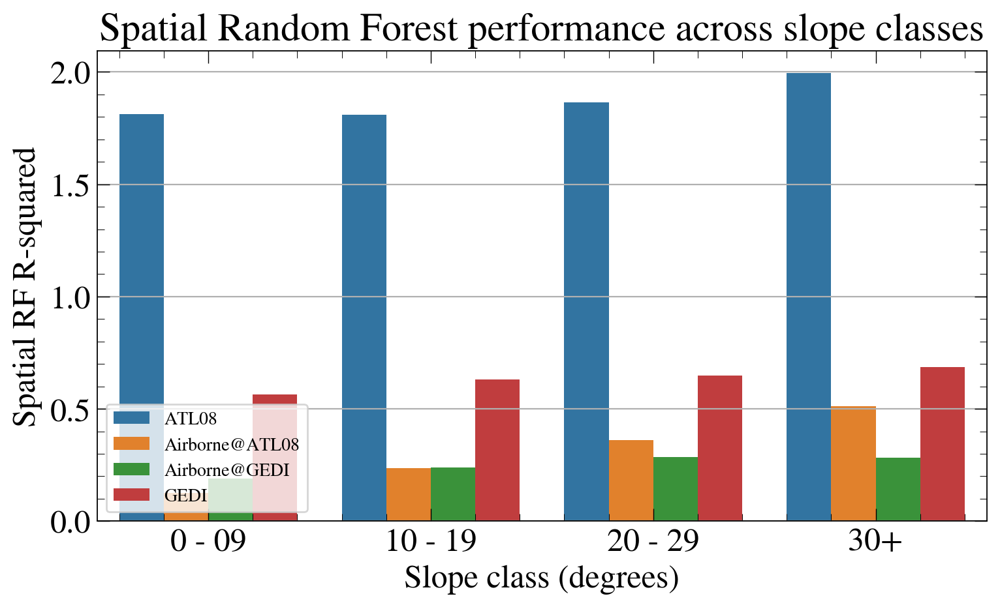

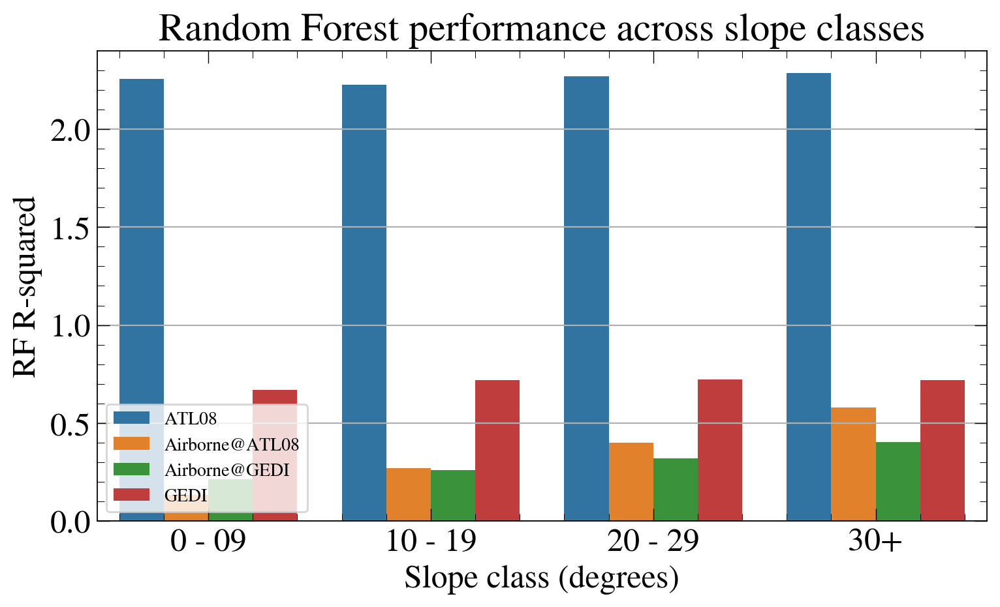

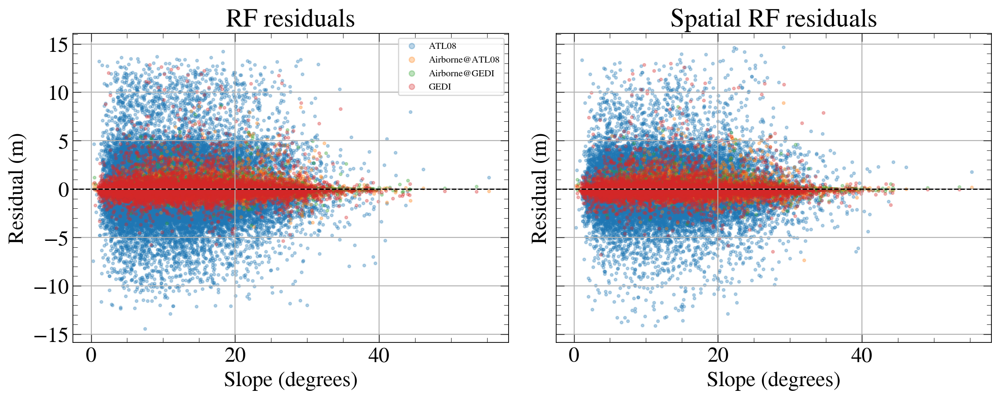

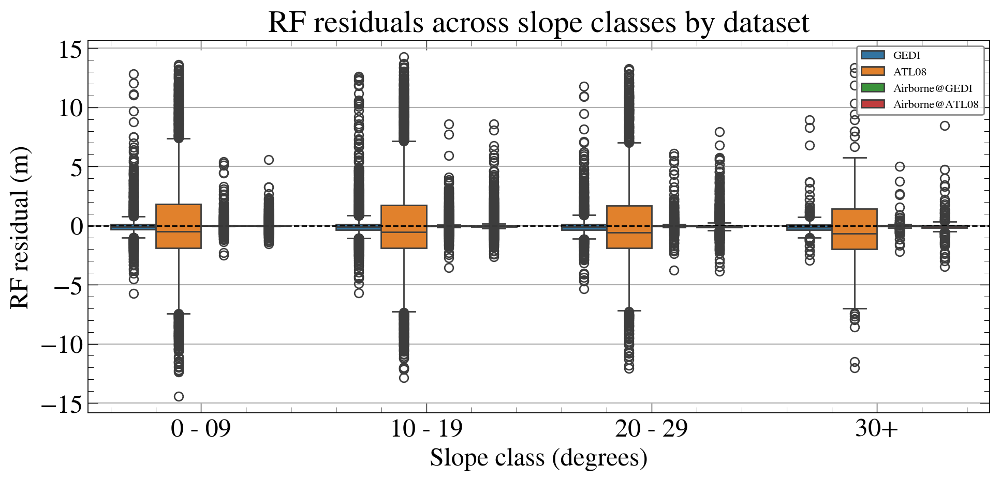

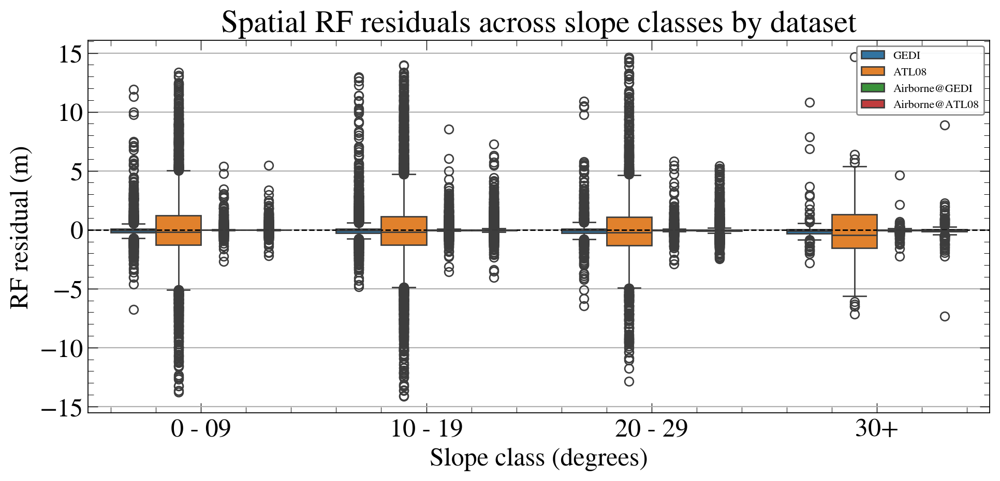

...

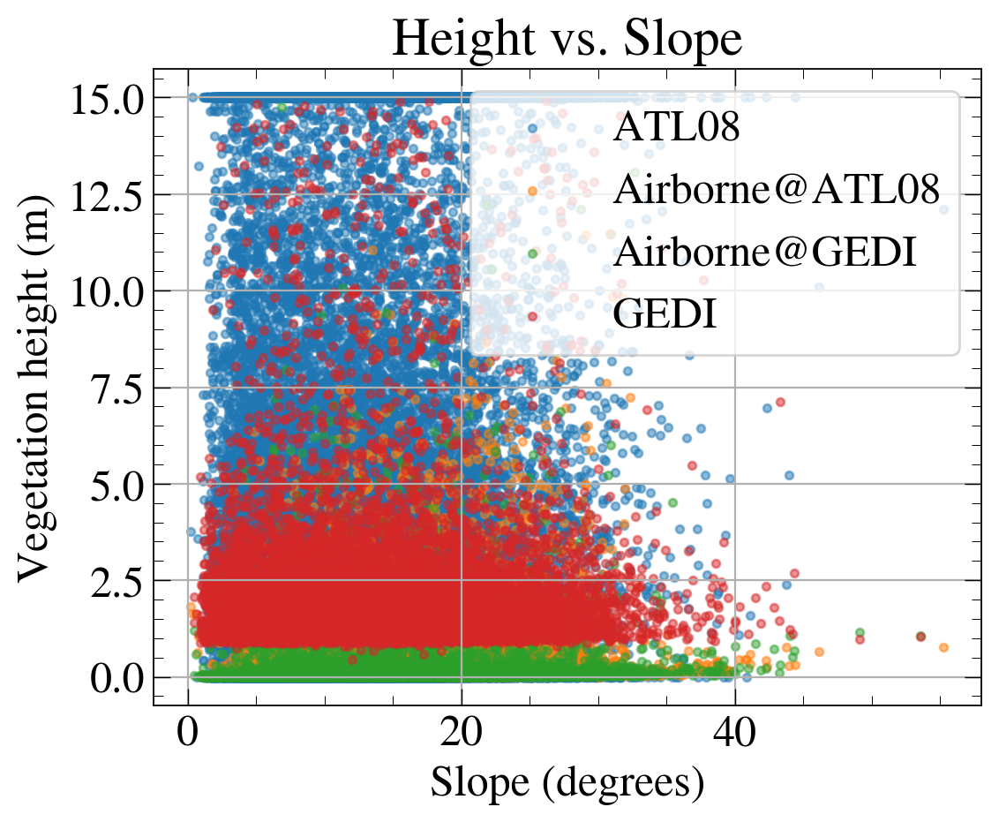

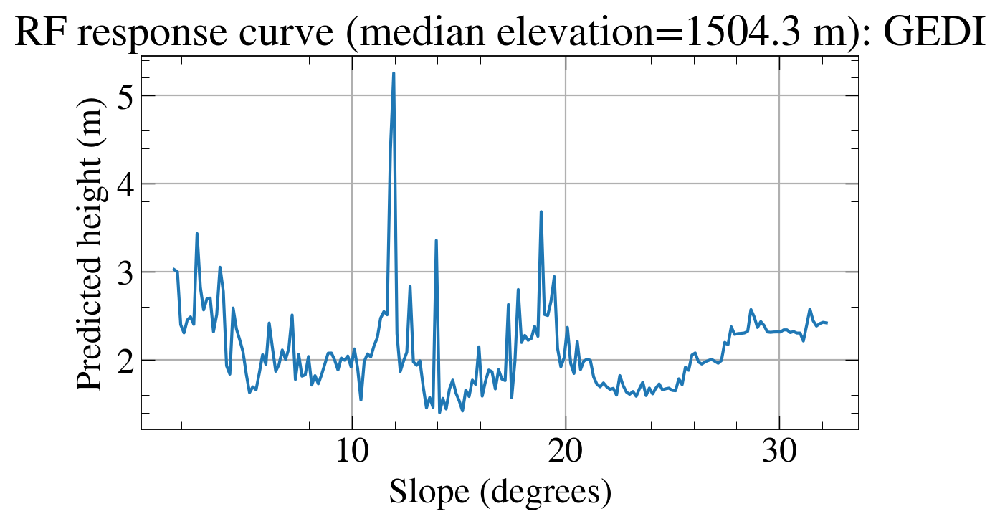

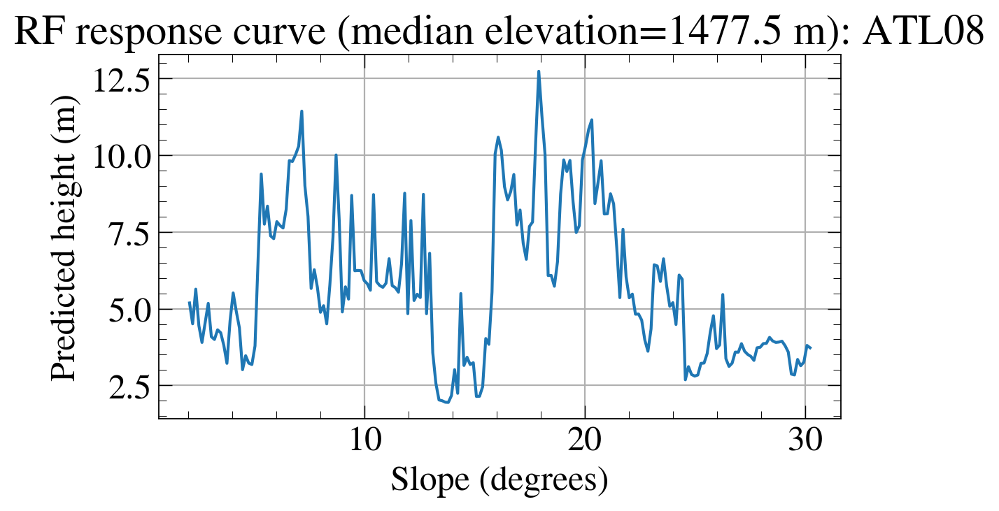

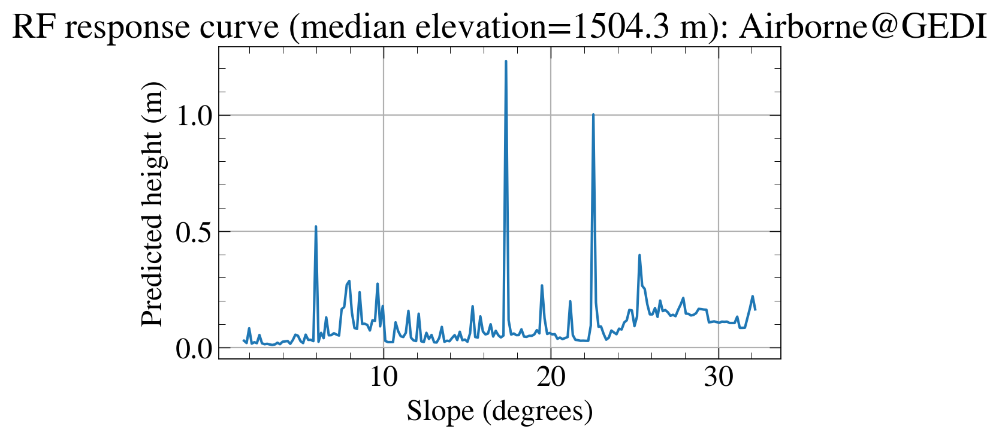

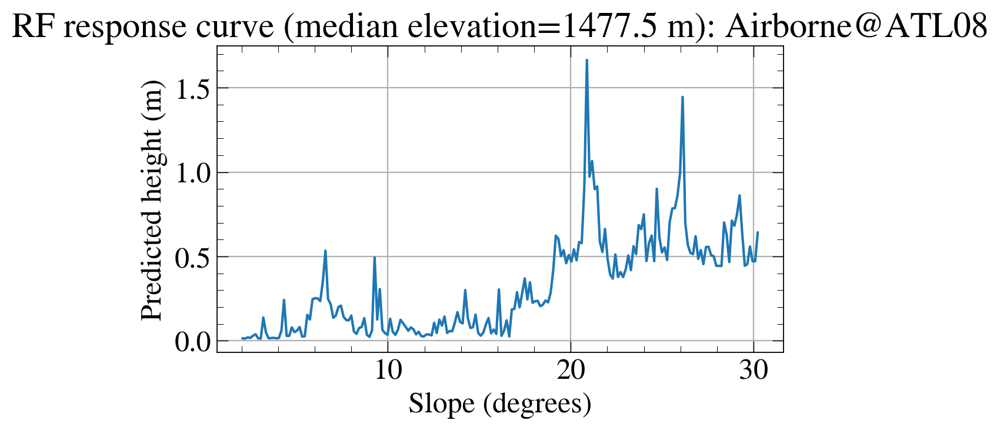

Done!!!


In [26]:
# =========================
# CONFIG
# =========================
# Input tile directories: GeoTIFF tiles
DTM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/las_dtm/")    # DTM
DSM_DIR = Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/lasgrid_dsm/")    # DSM

# Optionally, set CHM_DIR and skip DSM
CHM_DIR = None  # e.g., Path("/path/to/chm_tiles") or None

# Outputs
OUT_DIR = Path(Path("/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/mosaics/") )
OUT_DIR.mkdir(parents=True, exist_ok=True)

DTM_MOSAIC = OUT_DIR / "lidar_dtm_mosaic.tif"
DSM_MOSAIC = OUT_DIR / "lidar_dsm_mosaic.tif"
CHM_MOSAIC = OUT_DIR / "lidar_chm_mosaic.tif"
SLOPE_MOSAIC = OUT_DIR / "lidar_slope_deg.tif"

# GEDI and ATL08 vectors
GEDI_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/gedi_ml2.geojson")
# ATL08_VECT = Path("/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/icesat2_ml_final.geojson")
ATL08_VECT = "/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/atl03_segment_footprint_veg_height_option1.geojson"

# Column names for vegetation height in the vector attribute tables
gedi_height_col = "rh_80"          # or "rh_100"
atl08_height_col = "h_mean_canopy"     # or "h_max_canopy"
atl08_height_col = "vegetation_height"     

# Approximate footprint buffers (meters)
gedi_buffer_m = 12.5

# CRS to use for all rasters and vectors (projected! so the buffers are in meters)
# If DTM tiles already have a projected CRS, you can leave this as None to keep native.
TARGET_CRS = None  # e.g., "EPSG:6340" or None

# ---------------------
# Utility: find rasters
# ---------------------
def list_tifs(folder: Path):
    return sorted([str(p) for p in folder.glob("*.tif")])

# --------------------------------
# Mosaic tiles into one GeoTIFF
# --------------------------------
def mosaic_tiles(tif_list, dst_path, target_crs=None, dst_dtype="float32", resampling=Resampling.bilinear):
    if len(tif_list) == 0:
        raise FileNotFoundError(f"No GeoTIFFs found to mosaic for {dst_path}")
    srcs = [rasterio.open(p) for p in tif_list]

    # Reproject on the fly if target_crs is requested and differs
    if target_crs is not None:
        target_crs = CRS.from_user_input(target_crs)

    # Merge (note: rasterio.merge will reproject if 'precision' and 'res' differ. We will keep simple merge.)
    mosaic, out_transform = rasterio.merge.merge(srcs, resampling=resampling)
    out_meta = srcs[0].meta.copy()
    out_meta.update({
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": out_transform,
        "dtype": dst_dtype
    })

    # Write temp
    with rasterio.open(dst_path, "w", **out_meta) as dst:
        dst.write(mosaic.astype(dst_dtype))

    # Optionally, reproject to target_crs
    if target_crs is not None and out_meta.get("crs") and CRS.from_user_input(out_meta["crs"]) != target_crs:
        reproj_path = dst_path.with_name(dst_path.stem + f"_{target_crs.to_authority()[0]}{target_crs.to_authority()[1]}.tif")
        reproject_to(dst_path, reproj_path, target_crs)
        os.replace(reproj_path, dst_path)

    for s in srcs:
        s.close()

    return str(dst_path)

# ---------------------------
# Reproject a raster to a CRS
# ---------------------------
def reproject_to(src_path, dst_path, target_crs):
    with rasterio.open(src_path) as src:
        transform, width, height = rasterio.warp.calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds
        )
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height
        })
        with rasterio.open(dst_path, "w", **kwargs) as dst:
            for i in range(1, src.count + 1):
                rasterio.warp.reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=target_crs,
                    resampling=Resampling.bilinear
                )
    return str(dst_path)

# ----------------------------------------
# Compute CHM mosaic as DSM - DTM 
# ----------------------------------------
def compute_chm(dsm_path, dtm_path, out_path, nodata_out=-9999, max_height=15):
    with rasterio.open(dsm_path) as dsm, rasterio.open(dtm_path) as dtm:
        if dsm.crs != dtm.crs:
            raise ValueError("DSM and DTM must share the same CRS. Reproject first.")
        if (dsm.transform != dtm.transform) or (dsm.width != dtm.width) or (dsm.height != dtm.height):
            raise ValueError("DSM and DTM grids must be aligned. Resample/reproject one to the other.")

        dsm_arr = dsm.read(1).astype("float32")
        dtm_arr = dtm.read(1).astype("float32")

        # Build valid mask from nodata or non-finite
        dsm_nd = dsm.nodata
        dtm_nd = dtm.nodata
        valid = np.isfinite(dsm_arr) & np.isfinite(dtm_arr)
        if dsm_nd is not None:
            valid &= dsm_arr != dsm_nd
        if dtm_nd is not None:
            valid &= dtm_arr != dtm_nd

        chm = np.full_like(dtm_arr, np.float32(nodata_out))
        chm[valid] = dsm_arr[valid] - dtm_arr[valid]

        # Clean up: no negatives, and cap improbable outliers
        chm[valid & (chm < 0)] = 0.0
        chm[valid & (chm > max_height)] = max_height  # optional but helpful for plotting

        meta = dtm.meta.copy()
        meta.update(dtype="float32", nodata=nodata_out)

        with rasterio.open(out_path, "w", **meta) as dst:
            dst.write(chm, 1)

    return str(out_path)

# --------------------
# Compute slope (degrees)
# --------------------
def compute_slope_deg(dtm_path, out_path):
    dem = rd.LoadGDAL(str(dtm_path))
    slope = rd.TerrainAttribute(dem, attrib='slope_degrees')
    rd.SaveGDAL(str(out_path), slope)
    return str(out_path)

# ---------------------------------------------------------
# Buffer points in meters (handles reprojection for buffer)
# ---------------------------------------------------------
def buffer_points(gdf, buffer_m, target_crs=None):
    """
    Returns polygons (buffers) in a projected CRS so 'buffer_m' is in meters.
    If target_crs is None, uses the current CRS if it's projected; otherwise raises.
    """
    if target_crs is None:
        # If gdf.crs is geographic (degrees), you must pass a projected CRS
        if gdf.crs is None or CRS.from_user_input(gdf.crs).is_geographic:
            raise ValueError("Geographic CRS detected. Please set TARGET_CRS to a projected CRS (meters).")
        work_crs = gdf.crs
        gdf_proj = gdf
    else:
        work_crs = CRS.from_user_input(target_crs)
        gdf_proj = gdf.to_crs(work_crs)

    gdf_proj = gdf_proj.copy()
    gdf_proj["geometry"] = gdf_proj.geometry.buffer(buffer_m)
    return gdf_proj

# ----------------------------------------------------------
# Zonal stats helper: get mean/std/p95 from raster per geom
# ----------------------------------------------------------
def zonal_stats_df(geoms_gdf, raster_path, stats=("mean","std","percentile_95"), prefix="slope_"):
    zs = zonal_stats(
        geoms_gdf,
        raster_path,
        stats=list(stats),
        nodata=None,
        geojson_out=False
    )
    out = pd.DataFrame(zs)
    out = out.add_prefix(prefix)
    # out = out[out["slope_mean"].notna()]
    return out

# ---------- ICESat-2 helpers: track ends + rectangle corners ----------

def icesat2_gt_endflag(df: pd.DataFrame) -> np.ndarray:
    """
    Flag starts/ends of tracks defined by (date, gt).
    Assumes df has columns: 'time' (datetime64) and 'gt' (beam/ground track).
    Logically find the ends of unique ICESat-2 ground tracks according to dates.
    
    Steps:
    - We sort data first by time and then ground track (gt) to make sure all the points are ordered correctly. 
    - Use the unique function to identify the first instance of unique pairs of date and gt in the dataset thus giving the start of a new track. 
    - Identify the row above each track start as the end of the previous track.
    
    Parameters:
    - icesat2_df: ICESat-2 dataframe, assumed to be a pandas DataFrame with 'time' (datetime64), 'gt' (beam), and 'norths' already defined.

    Returns:
    - end_flag: 0/1 array same length as df - logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
      It is helps to avoid wrapping errors at track edges.
    """
    
    # Sort by 'time' and 'gt'
    sdf = df.sort_values(by=["time", "gt"]).reset_index(drop=True)
    
    # Extract only the date (ignore time of day)
    dates = pd.to_datetime(sdf["time"]).dt.date
    
    # Create a combined key of date and 'gt' and find first occurrence
    first_idx = pd.DataFrame({"date": dates, "gt": sdf["gt"]}).drop_duplicates(keep="first").index
    
    # Initialize end_flag with zeros (same length as number of rows)
    end_flag = np.zeros(len(sdf), dtype=int)
    
    # Flag unique_refs
    end_flag[first_idx] = 1
    
    # Also flag the entry just before each unique_ref (unless it's 0)
    for idx in first_idx:
        if idx > 0:
            end_flag[idx - 1] = 1
            
    # Flag the last element
    end_flag[-1] = 1
    return end_flag
    # Return in original row order
    # ef = pd.Series(end_flag, index=sdf.index)
    # return ef#.sort_index().values

def icesat2_footprint_corners(norths: np.ndarray,
                              easts: np.ndarray,
                              default_length: float,
                              end_flag: np.ndarray):
    """
    Calculate ICESat-2 footprint corners and orientation angles.
    This code inherently includes bearing-based orientation using the geometry of the ground track.
    
    Build oriented rectangles using local track bearing.
    theta is computed as arctan2(dN, dE) -> angle from East (x-axis)
    
    Parameters:
    - norths: array of northing coordinates.
    - easts: array of easting coordinates.
    - default_length: default footprint length (e.g., 100 for ATLO8 or 40 meters for ATL06).
    - end_flag: logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. 
      It is helps to avoid wrapping errors at track edges.

    Returns:
    - xc: x corner coordinates (N x 6)
    - yc: y corner coordinates (N x 6)
    - theta: footprint orientation angles (N,). The angle theta between the icesat2 track and due east
    """
    footwidth = 13.0  # meters (full width)
    n = norths.shape[0]
    theta = np.full((n, 2), np.nan, dtype="float64")
    xc = np.full((n, 6), np.nan, dtype="float64")
    yc = np.full((n, 6), np.nan, dtype="float64")

    # create polygons of ICESat-2 footprints
    for r in range(n-1):
        if r == 0 or (end_flag[r] - end_flag[r-1]) == 0: # only angle pointed forwards
            theta[r, 0] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
            theta[r, 1] = theta[r, 0]
            footlength = default_length
        elif r == n-1 or (end_flag[r] - end_flag[r+1]) == 0: # only angle pointed backwards
            theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
            theta[r, 1] = theta[r, 0]
            footlength = default_length
        else: # calculate angles in each direction
            theta[r, 0] = np.degrees(np.arctan2(norths[r]-norths[r-1], easts[r]-easts[r-1]))
            theta[r, 1] = np.degrees(np.arctan2(norths[r+1]-norths[r], easts[r+1]-easts[r]))
            # footlength = 0.5 * np.hypot(norths[r+1]-norths[r-1], easts[r+1]-easts[r-1])
            footlength = 0.5 * np.sqrt((norths[r + 1] - norths[r - 1])**2 + (easts[r + 1] - easts[r - 1])**2)

        # along-track ends (angle from East). Find box edges along the RGT
        back_x  = easts[r] - (footlength/2.0) * np.cos(np.radians(theta[r, 0]))
        back_y  = norths[r] - (footlength/2.0) * np.sin(np.radians(theta[r, 0]))
        front_x = easts[r] + (footlength/2.0) * np.cos(np.radians(theta[r, 1]))
        front_y = norths[r] + (footlength/2.0) * np.sin(np.radians(theta[r, 1]))

        mean_theta = np.nanmean(theta[r, :])

        # cross-track offsets at center. Find box edges perpendicular to the centroid
        xc[r, 0] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta + 90))
        yc[r, 0] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta + 90))
        xc[r, 1] = easts[r] + (footwidth/2.0) * np.cos(np.radians(mean_theta - 90))
        yc[r, 1] = norths[r] + (footwidth/2.0) * np.sin(np.radians(mean_theta - 90))

        # rectangle corners at back and front. Solve for corner coordinates
        xc[r, 2] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] + 90))
        yc[r, 2] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] + 90))
        xc[r, 3] = back_x  + (footwidth/2.0) * np.cos(np.radians(theta[r, 0] - 90))
        yc[r, 3] = back_y  + (footwidth/2.0) * np.sin(np.radians(theta[r, 0] - 90))
        xc[r, 4] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] - 90))
        yc[r, 4] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] - 90))
        xc[r, 5] = front_x + (footwidth/2.0) * np.cos(np.radians(theta[r, 1] + 90))
        yc[r, 5] = front_y + (footwidth/2.0) * np.sin(np.radians(theta[r, 1] + 90))

    return xc, yc

# ---------------------------------------------------
# pipeline: mosaic, slope, CHM
# ---------------------------------------------------
# Mosaic DTM
dtm_tiles = list_tifs(DTM_DIR)
m_dtm = mosaic_tiles(dtm_tiles, DTM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")

# CHM (either from DSM tiles or CHM tiles)
have_chm = False
if CHM_DIR is not None:
    chm_tiles = list_tifs(CHM_DIR)
    if len(chm_tiles) > 0:
        m_chm = mosaic_tiles(chm_tiles, CHM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
        have_chm = True

elif DSM_DIR is not None and len(list_tifs(DSM_DIR)) > 0:
    # Mosaic DSM, then CHM
    m_dsm = mosaic_tiles(list_tifs(DSM_DIR), DSM_MOSAIC, target_crs=TARGET_CRS, dst_dtype="float32")
    # Make sure DSM and DTM mosaics share grid; reproject DSM to DTM's exact grid if needed
    with rasterio.open(m_dtm) as dtm_src, rasterio.open(m_dsm) as dsm_src:
        if (dsm_src.crs != dtm_src.crs) or (dsm_src.transform != dtm_src.transform) \
           or (dsm_src.width != dtm_src.width) or (dsm_src.height != dtm_src.height):
            # Resample DSM to DTM grid
            aligned_dsm = OUT_DIR / "lidar_dsm_mosaic_aligned.tif"
            with rasterio.open(aligned_dsm, "w", **dtm_src.meta) as dst:
                dst_arr = dst.read(1)  # just to allocate; we will overwrite
            with rasterio.open(m_dsm) as s, rasterio.open(str(aligned_dsm), "r+") as d:
                dst_arr = np.empty((dtm_src.height, dtm_src.width), dtype="float32")
                rasterio.warp.reproject(
                    source=rasterio.band(s, 1),
                    destination=dst_arr,
                    src_transform=s.transform,
                    src_crs=s.crs,
                    dst_transform=dtm_src.transform,
                    dst_crs=dtm_src.crs,
                    resampling=Resampling.bilinear
                )
                d.write(dst_arr, 1)
            m_dsm = str(aligned_dsm)

    m_chm = compute_chm(m_dsm, m_dtm, CHM_MOSAIC)
    have_chm = True

# Slope (degrees)
m_slope = compute_slope_deg(m_dtm, SLOPE_MOSAIC)

# ---------------------------------------------------
# Load vectors and prep buffers (projected CRS required)
# ---------------------------------------------------
target_col = "rh_80" # "rh_100"
gedi = gpd.read_file(GEDI_VECT)
gedi = gedi.drop(drop_cols, axis = 1)
gedi = gedi.rename(columns={"elevation_NAVD88_gedi_from_crs_l2a": "Elevation"})
gedi = gedi[gedi["fhd_normal"] != -9999.000000]
gedi = gedi[gedi[target_col] <= 15]
gedi[target_col] = pd.to_numeric(gedi[target_col], errors="coerce").clip(upper=15)
# gedi.head()

from helper_functions import load_icesat2_data
projected_crs = "epsg:6340" 
# atl08 = gpd.read_file(ATL08_VECT)
atl08 = load_icesat2_data(ATL08_VECT, "ATL08", process = False)
# atl08 = atl08[atl08["gnd_ph_count"] != 0]
atl08 = atl08[atl08["h_mean_canopy"] <= 15]
atl08[atl08_height_col] = pd.to_numeric(atl08[atl08_height_col], errors="coerce").clip(upper=15)
atl08 = atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
print(f"Length of data: {len(atl08)}")
print(atl08.crs, "\n")

with rasterio.open(m_slope) as rs:
    raster_crs = rs.crs

# Reproject vectors to raster CRS (must be projected to use meter buffers)
if CRS.from_user_input(raster_crs).is_geographic:
    raise ValueError("Slope raster is in a geographic CRS. Reproject your DTM to a projected CRS (meters).")

gedi = gedi.to_crs(raster_crs)
atl08 = atl08.to_crs(raster_crs)

gedi_buf = buffer_points(gedi, gedi_buffer_m, target_crs=None)   # already projected

# ---------- Build 100x13 m oriented rectangles for ATL08 ----------
# ATL08 is already projected to the raster CRS (meters) above
# Required columns: 'Easting', 'Northing', 'time' (datetime64), 'gt' (beam/track id)

# End flags (avoid wrapping across tracks/days)
ef = icesat2_gt_endflag(atl08)

# Rectangle corners 
norths = pd.to_numeric(atl08["Northing"], errors="coerce").values
easts  = pd.to_numeric(atl08["Easting"],  errors="coerce").values
xc, yc = icesat2_footprint_corners(norths, easts, default_length=100.0, end_flag=ef)

# Build shapely Polygons from corners (use indices we actually filled)
from shapely.geometry import Polygon
rows = []
rect_geoms = []
for i in range(xc.shape[0]):
    if np.any(np.isnan(xc[i, 2:6])) or np.any(np.isnan(yc[i, 2:6])):
        continue
    rect = ShpPolygon([(xc[i,2], yc[i,2]), 
                       (xc[i,3], yc[i,3]), 
                       (xc[i,4], yc[i,4]), 
                       (xc[i,5], yc[i,5])])
    rect_geoms.append(rect)
    rows.append(i)

# Create a GeoDataFrame aligned to the kept rows
atl08_rects = atl08.iloc[rows].copy()
atl08_rects.set_geometry(gpd.GeoSeries(rect_geoms, index=atl08_rects.index), inplace=True)
# (CRS already set via atl08.to_crs(raster_crs) earlier)

# ---------------------------------------------------
# Zonal stats: slope under GEDI and ATL08 footprints
# ---------------------------------------------------
gedi_slope_df = zonal_stats_df(gedi_buf, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")
atl08_slope_df = zonal_stats_df(atl08_rects, m_slope, stats=("mean","std","percentile_95"), prefix="slope_")

# Attach back to GeoDataFrames
gediX = gedi.copy()
atl08X = atl08_rects.copy()
for col in gedi_slope_df.columns:
    gediX[col] = gedi_slope_df[col]
for col in atl08_slope_df.columns:
    atl08X[col] = atl08_slope_df[col]    

# ---------------------------------------------------
# Plot ICESat-2 Segments
# ---------------------------------------------------
# # Small sample if huge
# to_plot = atl08_rects.sample(min(2000, len(atl08_rects))) if len(atl08_rects) > 2000 else atl08_rects

# ax = to_plot.plot(edgecolor="k", facecolor="none", linewidth=0.5, figsize=(7,7))
# ax.set_aspect("equal")
# ax.set_title("ICESat-2 ATL08 rectangular segments (100x13 m)")
# plt.show()


# ---------------------------------------------------
# CHM stats (airborne height) under footprints
# ---------------------------------------------------
def chm_stats_df(geoms_gdf, chm_path, prefix="chm_"):
    return zonal_stats_df(geoms_gdf, chm_path,
                          stats=("mean","std","percentile_95"),
                          prefix=prefix)

if have_chm:
    # compute stats on the buffer polygons…
    gedi_chm_df  = chm_stats_df(gedi_buf,  m_chm, prefix="chm_")
    atl08_chm_df = chm_stats_df(atl08_rects, m_chm, prefix="chm_")

    # …and attach them to the existing frames that already have slope columns
    for col in gedi_chm_df.columns:
        gediX[col] = gedi_chm_df[col]
    for col in atl08_chm_df.columns:
        atl08X[col] = atl08_chm_df[col]
        
if have_chm:
    # cap CHM-based heights to 15 m
    for df_ in (gediX, atl08X):
        if "chm_mean" in df_.columns:
            df_["chm_mean"] = pd.to_numeric(df_["chm_mean"], errors="coerce").clip(upper=15)
        if "chm_percentile_95" in df_.columns:
            df_["chm_percentile_95"] = pd.to_numeric(df_["chm_percentile_95"], errors="coerce").clip(upper=15)

gediX  = gediX[gediX["slope_mean"].notna()].reset_index(drop=True)
atl08X = atl08X[atl08X["slope_mean"].notna()].reset_index(drop=True)
        
print("GEDI slope cols:", [c for c in gediX.columns if c.startswith("slope_")])
print("ATL08 slope cols:", [c for c in atl08X.columns if c.startswith("slope_")])
# Expect: ['slope_mean', 'slope_std', 'slope_percentile_95']

if have_chm:
    print("GEDI CHM cols:", [c for c in gediX.columns if c.startswith("chm_")])
    print("ATL08 CHM cols:", [c for c in atl08X.columns if c.startswith("chm_")])

assert "slope_mean" in gediX.columns and "slope_mean" in atl08X.columns
        
# ---------------------------------------------------
# Assemble tidy DataFrame for modeling
# ---------------------------------------------------
def build_df(gdf, dataset_name, height_col):
    # pull height and slope
    heights = pd.to_numeric(gdf[height_col], errors="coerce").astype("float32")
    slopes  = pd.to_numeric(gdf["slope_mean"], errors="coerce").astype("float32")

    # hard-cap heights at 15 m
    heights = heights.clip(upper=15)

    # coordinates for Spatial RF (assumes projected CRS in meters)
    centroids = gdf.geometry.centroid
    xs = centroids.x.astype("float32")
    ys = centroids.y.astype("float32")

    # elevation (if present; e.g., column "Elevation" in ATL08 or GEDI)
    elev = pd.to_numeric(gdf.get("Elevation", np.nan), errors="coerce").astype("float32")

    df = pd.DataFrame({
        "dataset":   dataset_name,
        "height_m":  heights,
        "slope_deg": slopes,
        "x":         xs,
        "y":         ys,
        "elev_m":    elev,
        "slope_std": pd.to_numeric(
            gdf.get("slope_std", np.nan), errors="coerce"
        ).astype("float32"),
        "slope_p95": pd.to_numeric(
            gdf.get("slope_percentile_95", np.nan), errors="coerce"
        ).astype("float32"),
        # keep original GeoDataFrame index so we can map residuals back later
        "src_idx":   gdf.index,
    }, index=gdf.index)

    # also cap CHM-related fields if present
    if "chm_mean" in gdf.columns:
        df["chm_mean"] = (
            pd.to_numeric(gdf["chm_mean"], errors="coerce")
            .astype("float32")
            .clip(upper=15)
        )
    if "chm_std" in gdf.columns:
        df["chm_std"] = pd.to_numeric(gdf["chm_std"], errors="coerce").astype("float32")
    if "chm_percentile_95" in gdf.columns:
        df["chm_p95"] = (
            pd.to_numeric(gdf["chm_percentile_95"], errors="coerce")
            .astype("float32")
            .clip(upper=15)
        )
    # we require height and slope and coordinates, but NOT elevation
    return df.dropna(subset=["height_m", "slope_deg", "x", "y"])

df_gedi = build_df(gediX, "GEDI", gedi_height_col)
df_atl8 = build_df(atl08X, "ATL08", atl08_height_col)

# If you also want airborne-as-truth at the same points, set height_m = chm_mean
df_airborne = None
if have_chm:
    # Sample slope and CHM at a hex/point grid could be done, but here we re-use footprints as support
    # Use CHM statistics as "height_m"
    tmp = df_gedi.copy()
    tmp["dataset"] = "Airborne@GEDI"
    tmp["height_m"] = tmp["chm_mean"]
    df_airborne = tmp.dropna(subset=["height_m","slope_deg"])

df_airborne_atl8 = None
if have_chm:
    tmp2 = df_atl8.copy()
    tmp2["dataset"] = "Airborne@ATL08"
    tmp2["height_m"] = tmp2.get("chm_mean", np.nan)
    # ensure 15 m cap (just in case)
    tmp2["height_m"] = pd.to_numeric(tmp2["height_m"], errors="coerce").clip(upper=15)
    df_airborne_atl8 = tmp2.dropna(subset=["height_m","slope_deg"])
    
# Combined for modeling and comparison
dfs = [df_gedi, df_atl8]
if df_airborne is not None:
    dfs.append(df_airborne)
if df_airborne_atl8 is not None:
    dfs.append(df_airborne_atl8)
df_all = pd.concat(dfs, ignore_index=True)

# ---------------------------------------------------
# Add slope bins for performance by slope class
# ---------------------------------------------------
# Define slope thresholds (in degrees)
bins = [0, 9, 19, 29, np.inf]
labels = ["0 - 09", "10 - 19", "20 - 29", "30+"]

# Add a categorical slope-bin column
df_all["slope_bin"] = pd.cut(df_all["slope_deg"], bins=bins,
                             labels=labels, include_lowest=True)

# Count points per dataset and slope class
slope_counts = (
    df_all
    .groupby(["dataset", "slope_bin"])
    .size()
    .reset_index(name="count")
    .sort_values(["dataset", "slope_bin"])
)
print(slope_counts)

# pivot table
slope_counts_pivot = slope_counts.pivot(
    index="dataset",
    columns="slope_bin",
    values="count"
).fillna(0).astype(int)
print(slope_counts_pivot)

# ---------------------------------
# Modeling: RF and Spatial RF
# ---------------------------------
def _rmse(y_true, y_pred):
    # Works on any sklearn version
    try:
        return mean_squared_error(y_true, y_pred, squared=False)
    except TypeError:
        return np.sqrt(mean_squared_error(y_true, y_pred))

def fit_rf(X, y, n_estimators=50, random_state=42):
    """Standard Random Forest (non-spatial)."""
    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        random_state=random_state,
        n_jobs=-1
    )
    rf.fit(X, y)
    yhat = rf.predict(X)
    r2 = r2_score(y, yhat)
    rmse = _rmse(y, yhat)
    return rf, r2, rmse

def fit_spatial_rf(X, y, n_estimators=50, random_state=42):
    """Spatial Random Forest: includes x,y coordinates as predictors."""
    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        random_state=random_state,
        n_jobs=-1
    )
    rf.fit(X, y)
    yhat = rf.predict(X)
    r2 = r2_score(y, yhat)
    rmse = _rmse(y, yhat)
    return rf, r2, rmse

def run_models_for_group(
    df,
    base_features=("slope_deg", "elev_m"),
    spatial_features=("slope_deg", "elev_m", "x", "y"),
    label="height_m",
    random_state=42
):
    """
    For a single dataset (e.g., 'GEDI', 'ATL08', 'Airborne@GEDI', etc.),
    split into:
        - 80% train
        - 20% test
        - and within the 80% train, 15% used as validation.

    Returns RF and Spatial RF models trained on the training split,
    and metric summaries (R^2, RMSE) based on the TEST split.
    """

    # --------------------------
    # Base RF: slope + elevation
    # --------------------------
    needed_base = list(base_features) + [label]
    df_base = df[needed_base].dropna()
    if len(df_base) < 20:
        # not enough samples to do 80/20 + val split
        return {
            "rf": None,
            "r2_rf": np.nan,
            "rmse_rf": np.nan,
            "r2_rf_train": np.nan,
            "rmse_rf_train": np.nan,
            "rf_spatial": None,
            "r2_rf_spatial": np.nan,
            "rmse_rf_spatial": np.nan,
            "r2_rf_spatial_train": np.nan,
            "rmse_rf_spatial_train": np.nan,
        }

    X_base = df_base[list(base_features)].values
    y_base = df_base[label].values

    # 80% train_val, 20% test
    Xb_train, Xb_test, yb_train, yb_test = train_test_split(
        X_base, y_base, test_size=0.2, random_state=random_state
    )
    
    rf, r2_rf_train, rmse_rf_train = fit_rf(Xb_train, yb_train)

    # Metrics: test
    yb_test_pred  = rf.predict(Xb_test)

    r2_rf_test   = r2_score(yb_test, yb_test_pred)
    rmse_rf_test = _rmse(yb_test, yb_test_pred)

    # -----------------------------------------
    # Spatial RF: slope + elevation + x, y
    # -----------------------------------------
    needed_spat = list(spatial_features) + [label]
    df_spat = df[needed_spat].dropna()
    if len(df_spat) < 20:
        rf_spat = None
        r2_rf_spat_train = np.nan
        rmse_rf_spat_train = np.nan
        r2_rf_spat_test = np.nan
        rmse_rf_spat_test = np.nan
    else:
        X_spat = df_spat[list(spatial_features)].values
        y_spat = df_spat[label].values

        Xs_train, Xs_test, ys_train, ys_test = train_test_split(
            X_spat, y_spat, test_size=0.2, random_state=random_state
        )

        rf_spat, r2_rf_spat_train, rmse_rf_spat_train = fit_spatial_rf(Xs_train, ys_train)
        
        ys_test_pred  = rf_spat.predict(Xs_test)

        # r2_rf_spat_train  = r2_score(ys_train, ys_train_pred)
        # rmse_rf_spat_train = _rmse(ys_train, ys_train_pred)

        r2_rf_spat_test   = r2_score(ys_test, ys_test_pred)
        rmse_rf_spat_test = _rmse(ys_test, ys_test_pred)

    # We keep the test metrics in r2_rf/rmse_rf for compatibility
    return {
        "rf": rf,
        "r2_rf": r2_rf_test,
        "rmse_rf": rmse_rf_test,
        "r2_rf_train": r2_rf_train,
        "rmse_rf_train": rmse_rf_train,
        "rf_spatial": rf_spat,
        "r2_rf_spatial": r2_rf_spat_test,
        "rmse_rf_spatial": rmse_rf_spat_test,
        "r2_rf_spatial_train": r2_rf_spat_train,
        "rmse_rf_spatial_train": rmse_rf_spat_train,
    }

def summarize_residuals(df, y_col, yhat_col, model_label):
    """Return one row of metrics for a given subset + model."""
    y    = df[y_col].values
    yhat = df[yhat_col].values
    resid = y - yhat

    return {
        "model":       model_label,
        "n":           len(df),
        "R_squared":   r2_score(y, yhat),
        "RMSE":        np.sqrt(np.mean(resid**2)),
        "bias_mean":   np.mean(resid),     # systematic over/under-estimate
        "bias_median": np.median(resid),   # robust to outliers
        "resid_std":   np.std(resid),      # spread / uncertainty
    }

# ---------------------------------------------------
# Overall models per dataset (all slopes)
# ---------------------------------------------------
results = {}
for name, sub in df_all.groupby("dataset"):
    results[name] = run_models_for_group(sub)  # uses slope_deg + elev_m and slope_deg + elev_m + x + y


# Print overall summaries with RF and Spatial RF
for name, res in results.items():
    print(f"\n=== {name} (all slopes) ===")
    print(f"RF train: R-squared={res['r2_rf_train']:.3f},  RMSE={res['rmse_rf_train']:.3f}")
    print(f"RF test:  R-squared={res['r2_rf']:.3f},        RMSE={res['rmse_rf']:.3f}")

    print(f"Spatial RF train: R-squared={res['r2_rf_spatial_train']:.3f},  RMSE={res['rmse_rf_spatial_train']:.3f}")
    print(f"Spatial RF test:  R-squared={res['r2_rf_spatial']:.3f},        RMSE={res['rmse_rf_spatial']:.3f}")



df_all["pred_rf"]   = np.nan
df_all["pred_srf"]  = np.nan
df_all["resid_rf"]  = np.nan
df_all["resid_srf"] = np.nan

slope_bin_results = []   # RF vs spatial RF metrics per slope bin
rows = []                # residual summaries (RF + Spatial RF)

# -----------------------------------------------------------------------------------------
# Add RF/Spatial RF predictions + models + residual summaries per slope-bin x dataset
# -----------------------------------------------------------------------------------------      
for dataset_name, df_ds in df_all.groupby("dataset"):
    if dataset_name not in results:
        continue

    # ---------------------------------------------------
    # Add RF and Spatial RF predictions + residuals
    # ---------------------------------------------------
    # ========== Global predictions for this dataset ==========
    # Clean subsets for prediction
    df_ds_base = df_ds[["slope_deg", "elev_m", "height_m"]].dropna()
    df_ds_spat = df_ds[["slope_deg", "elev_m", "x", "y", "height_m"]].dropna()

    # Non-spatial RF: slope + elevation
    if "rf" in results[dataset_name] and len(df_ds_base) > 0:
        rf_global = results[dataset_name]["rf"]
        X_base_ds = df_ds_base[["slope_deg", "elev_m"]].values
        y_ds_base = df_ds_base["height_m"].values
        yhat_rf   = rf_global.predict(X_base_ds)

        idx_base_ds = df_ds_base.index
        df_all.loc[idx_base_ds, "pred_rf"]  = yhat_rf
        df_all.loc[idx_base_ds, "resid_rf"] = y_ds_base - yhat_rf

    # Spatial RF: slope + elevation + x, y
    if "rf_spatial" in results[dataset_name] and len(df_ds_spat) > 0:
        srf_global = results[dataset_name]["rf_spatial"]
        X_spat_ds  = df_ds_spat[["slope_deg", "elev_m", "x", "y"]].values
        y_ds_spat  = df_ds_spat["height_m"].values
        yhat_srf   = srf_global.predict(X_spat_ds)

        idx_spat_ds = df_ds_spat.index
        df_all.loc[idx_spat_ds, "pred_srf"]  = yhat_srf
        df_all.loc[idx_spat_ds, "resid_srf"] = y_ds_spat - yhat_srf

    # ---------------------------------------------------
    # Models + residual summaries per slope-bin x dataset
    # ---------------------------------------------------
    # ========== Per–slope-bin RF / Spatial RF metrics + residual summaries ==========
    for slope_bin, df_bin in df_ds.groupby("slope_bin"):
        if df_bin.empty or slope_bin is pd.NA:
            continue

        # subsets for fitting bin-level models
        df_bin_base = df_bin[["slope_deg", "elev_m", "x", "y", "height_m"]].dropna()
        df_bin_spat = df_bin_base.copy()  # same, since x,y already included

        # Skip bins with too few samples
        if len(df_bin_base) < 5 or len(df_bin_spat) < 5:
            print(
                f"Skipping {dataset_name} - {slope_bin}: too few samples "
                f"(base={len(df_bin_base)}, spatial={len(df_bin_spat)})"
            )
            continue

        # ----- Fit RF (slope + elevation) -----
        X_base = df_bin_base[["slope_deg", "elev_m"]].values
        y_base = df_bin_base["height_m"].values
        rf_bin, r2_rf, rmse_rf = fit_rf(X_base, y_base)

        # ----- Fit Spatial RF (slope + elevation + x,y) -----
        X_spat = df_bin_spat[["slope_deg", "elev_m", "x", "y"]].values
        y_spat = df_bin_spat["height_m"].values
        rf_spat_bin, r2_rf_spat, rmse_rf_spat = fit_spatial_rf(X_spat, y_spat)

        slope_bin_results.append({
            "dataset":          dataset_name,
            "slope_bin":        slope_bin,
            "n":                len(df_bin_spat),
            "R2_RF":            r2_rf,
            "RMSE_RF":          rmse_rf,
            "R2_RF_spatial":    r2_rf_spat,
            "RMSE_RF_spatial":  rmse_rf_spat,
        })

        # ----- Residual summary in the same bin -----
        # use global predictions sitting in df_all: pred_rf, pred_srf
        df_resid = df_bin.replace([np.inf, -np.inf], np.nan).dropna(
            subset=["height_m", "pred_rf", "pred_srf"]
        )
        if len(df_resid) < 5:
            continue  # too few points for residual stats

        # RF residual summary
        rows.append({
            "dataset":   dataset_name,
            "slope_bin": str(slope_bin),
            **summarize_residuals(df_resid, "height_m", "pred_rf", "RF")
        })

        # Spatial RF residual summary
        rows.append({
            "dataset":   dataset_name,
            "slope_bin": str(slope_bin),
            **summarize_residuals(df_resid, "height_m", "pred_srf", "Spatial RF")
        })

# Build the two DataFrames as before
results_df = pd.DataFrame(slope_bin_results)
if results_df.empty:
    print("\n=== Performance by slope class (RF vs Spatial RF) ===")
    print("No bins had enough samples to fit RF / Spatial RF.")
else:
    print("\n=== Performance by slope class (RF vs Spatial RF) ===")
    print(results_df.sort_values(["dataset", "slope_bin"]))

resid_summary = pd.DataFrame(rows)
print("len(rows) =", len(rows))
print("resid_summary.columns =", resid_summary.columns.tolist())
if resid_summary.empty:
    print("\n=== Residual summary by dataset x slope bin x model ===")
    print("No residuals to summarize (check sample thresholds and pred_rf/pred_srf).")
else:
    print("\n=== Residual summary by dataset x slope bin x model ===")
    print(resid_summary.sort_values(["dataset", "model", "slope_bin"]))

# -----------------------------------------------------------
# Plot R-squared by slope class and dataset (Spatial RF)
# -----------------------------------------------------------
plt.figure(figsize=(8, 5))
sns.barplot(
    data=results_df,
    x="slope_bin",
    y="RMSE_RF_spatial",
    hue="dataset"
)
plt.ylabel("Spatial RF R-squared")
plt.xlabel("Slope class (degrees)")
plt.title("Spatial Random Forest performance across slope classes")
plt.legend(fontsize=10, loc="lower left")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Plot R-squared by slope class and dataset (RF)
# ---------------------------------------------------
plt.figure(figsize=(8, 5))
sns.barplot(
    data=results_df,
    x="slope_bin",
    y="RMSE_RF",
    hue="dataset"
)
plt.ylabel("RF R-squared")
plt.xlabel("Slope class (degrees)")
plt.title("Random Forest performance across slope classes")
plt.legend(fontsize=10, loc="lower left")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Residual vs slope scatter (by dataset and model)
# ---------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

for ax, resid_col, title in [
    (axes[0], "resid_rf",  "RF residuals"),
    (axes[1], "resid_srf", "Spatial RF residuals"),
]:
    for dataset_name, df_ds in df_all.groupby("dataset"):
        ax.scatter(df_ds["slope_deg"], df_ds[resid_col],
                   s=5, alpha=0.3, label=dataset_name)
    ax.axhline(0, color="k", linestyle="--", linewidth=1)
    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Residual (m)")
    ax.set_title(title)

axes[0].legend(markerscale=2, fontsize=8)
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Boxplots of residuals by slope bin
# ---------------------------------------------------
plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    data=df_all,
    x="slope_bin",
    y="resid_rf",
    hue="dataset"
)
plt.axhline(0, color="k", linestyle="--", linewidth=1)
plt.ylabel("RF residual (m)")
plt.xlabel("Slope class (degrees)")
plt.title("RF residuals across slope classes by dataset")

# Put legend in a boxed frame
leg = ax.legend(
    fontsize=8,
    title_fontsize=9,
    frameon=True,           # turn on box
    fancybox=True,          # rounded corners
    framealpha=0.9,         # slight transparency
    edgecolor="grey",      # border color
    facecolor="white",      # background color
)
plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    data=df_all,
    x="slope_bin",
    y="resid_srf",
    hue="dataset"
)
plt.axhline(0, color="k", linestyle="--", linewidth=1)
plt.ylabel("RF residual (m)")
plt.xlabel("Slope class (degrees)")
plt.title("Spatial RF residuals across slope classes by dataset")

# Put legend in a boxed frame
leg = ax.legend(
    fontsize=8,
    title_fontsize=9,
    frameon=True,           # turn on box
    fancybox=True,          # rounded corners
    framealpha=0.9,         # slight transparency
    edgecolor="grey",      # border color
    facecolor="white",      # background color
)
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Attach residuals back to each dataset GeoDataFrame
# ---------------------------------------------------
# Subset df_all back into dataset-specific tables
df_gedi_all = df_all[df_all["dataset"] == "GEDI"].copy()
df_atl8_all = df_all[df_all["dataset"] == "ATL08"].copy()
df_air_gedi = df_all[df_all["dataset"] == "Airborne@GEDI"].copy()
df_air_atl8 = df_all[df_all["dataset"] == "Airborne@ATL08"].copy()

# Make GeoDataFrames with residuals
gedi_resid_gdf  = gediX.loc[df_gedi_all["src_idx"]].copy()
atl08_resid_gdf = atl08X.loc[df_atl8_all["src_idx"]].copy()

gedi_resid_gdf["resid_rf"] = df_gedi_all["resid_rf"].values
gedi_resid_gdf["resid_srf"] = df_gedi_all["resid_srf"].values

atl08_resid_gdf["resid_rf"] = df_atl8_all["resid_rf"].values
atl08_resid_gdf["resid_srf"] = df_atl8_all["resid_srf"].values

# ---------------------------------------------------
# schematic map of residuals
# ---------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
gedi_resid_gdf.plot(column="resid_rf", cmap="coolwarm", 
                    legend=True,  # vmin=-5, vmax=5, 
                    markersize=5, # increase point size
                    ax=axes[0])
axes[0].set_title("GEDI RF residuals (m)")

atl08_resid_gdf.plot(column="resid_rf", cmap="coolwarm", 
                     legend=True,  # vmin=-5, vmax=5, 
                     markersize=25, # increase point size
                     ax=axes[1])
axes[1].set_title("ICESat-2 RF residuals (m)")

for ax in axes:
    ax.set_axis_off()
plt.tight_layout()
plt.show()
######################################################
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
gedi_resid_gdf.plot(column="resid_srf", cmap="coolwarm", 
                    legend=True,  # vmin=-5, vmax=5, 
                    markersize=5, # increase point size
                    ax=axes[0])
axes[0].set_title("GEDI spatial RF residuals (m)")

atl08_resid_gdf.plot(column="resid_srf", cmap="coolwarm", 
                     legend=True,  # vmin=-5, vmax=5, 
                     markersize=25, # increase point size
                     ax=axes[1])
axes[1].set_title("ICESat-2 spatial RF residuals (m)")

for ax in axes:
    ax.set_axis_off()
plt.tight_layout()
plt.show()

# -----------------------------
# Quick diagnostic scatter
# -----------------------------
def scatter_by_dataset(df_all):
    fig, ax = plt.subplots(figsize=(6, 5))
    for k, g in df_all.groupby("dataset"):
        ax.scatter(g["slope_deg"], g["height_m"], s=10, label=k, alpha=0.5)
    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Vegetation height (m)")
    ax.legend()
    ax.set_title("Height vs. Slope")
    plt.tight_layout()
    plt.show()

scatter_by_dataset(df_all)

# Partial dependence-style RF curve per dataset
def rf_curve(dataset_name):
    """
    Plot RF response curve vs slope_deg, holding elevation fixed
    at the median elevation for this dataset.
    """
    sub = df_all[df_all["dataset"] == dataset_name].copy()
    if sub.empty or dataset_name not in results:
        return

    rf = results[dataset_name]["rf"]  # non-spatial RF trained on [slope_deg, elev_m]

    # Clean out rows with missing elevation or slope
    sub = sub[["slope_deg", "elev_m", "height_m"]].dropna()
    if sub.empty:
        print(f"No valid data (slope + elevation) for {dataset_name}")
        return

    # Range of slope to plot
    slope_grid = np.linspace(
        np.nanpercentile(sub["slope_deg"], 1),
        np.nanpercentile(sub["slope_deg"], 99),
        200
    )

    # Fix elevation at the median for this dataset
    elev_fixed = np.nanmedian(sub["elev_m"])
    elev_col = np.full_like(slope_grid, elev_fixed, dtype="float64")

    # Build 2D feature matrix [slope_deg, elev_m]
    X_plot = np.column_stack([slope_grid, elev_col])

    # Predict with RF
    y_hat = rf.predict(X_plot)

    # Plot
    plt.figure(figsize=(6, 4))
    plt.plot(slope_grid, y_hat)
    plt.xlabel("Slope (degrees)")
    plt.ylabel("Predicted height (m)")
    plt.title(f"RF response curve (median elevation={elev_fixed:.1f} m): {dataset_name}")
    plt.tight_layout()
    plt.show()

for name in ["GEDI", "ATL08", "Airborne@GEDI", "Airborne@ATL08"]:
    if name in results:
        rf_curve(name)
        
print("Done!!!")

In [33]:
# # separate datasets
# results_filename = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/results_df_test_orig.csv"
# results_df.to_csv(results_filename, index=False)

In [35]:
# df_all_filename = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/df_test_orig.csv"
# df_all.to_csv(df_all_filename, index=False)

In [27]:
df_all

,dataset,height_m,slope_deg,x,y,elev_m,slope_std,slope_p95,src_idx,chm_mean,chm_std,chm_p95,slope_bin,pred_rf,pred_srf,resid_rf,resid_srf
0,GEDI,1.080000,5.155303,513688.96875,4795170.0,1815.427246,1.001223,6.820404,0,0.014038,0.010534,0.030029,0 - 09,4.045400,1.446600,-2.965400,-0.366600
1,GEDI,0.970000,1.648073,513736.56250,4795201.5,1815.428345,0.781681,3.160749,1,0.016030,0.010942,0.030029,0 - 09,1.358200,1.100400,-0.388200,-0.130400
2,GEDI,1.120000,3.974104,513784.21875,4795232.5,1814.398560,1.538233,6.628409,2,0.016444,0.012237,0.039917,0 - 09,1.349400,1.128600,-0.229400,-0.008600
3,GEDI,0.930000,1.198875,513831.84375,4795264.0,1813.271729,0.557150,2.087620,3,0.018346,0.008773,0.030029,0 - 09,1.112800,1.000600,-0.182800,-0.070600
4,GEDI,0.890000,1.401255,513879.43750,4795295.5,1813.272827,0.724261,2.974779,4,0.018719,0.008843,0.030029,0 - 09,1.078200,0.919800,-0.188200,-0.029800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69463,Airborne@ATL08,0.023744,7.841012,521265.00000,4784001.5,1222.580688,2.110118,11.291911,22813,0.023744,0.079915,0.070068,0 - 09,0.025115,0.036002,-0.001372,-0.012259
69464,Airborne@ATL08,0.105575,4.432643,524483.87500,4783695.0,1463.735840,2.009344,8.052876,22814,0.105575,0.393054,0.859375,0 - 09,0.085942,0.080224,0.019633,0.025351
69465,Airborne@ATL08,0.098051,9.372279,518029.78125,4784227.0,1210.443237,3.223190,13.578871,22815,0.098051,0.334444,0.750000,10 - 19,0.406294,0.227777,-0.308243,-0.129726
69466,Airborne@ATL08,0.025869,11.792328,521254.90625,4783904.5,1224.875000,2.687516,16.597887,22816,0.025869,0.146887,0.040039,10 - 19,0.029024,0.096841,-0.003155,-0.070972


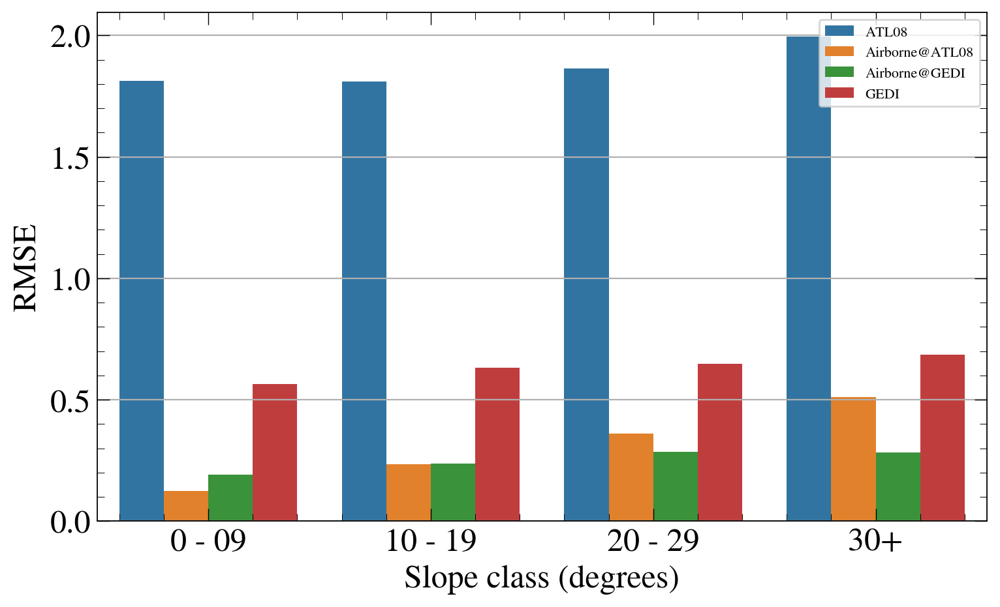

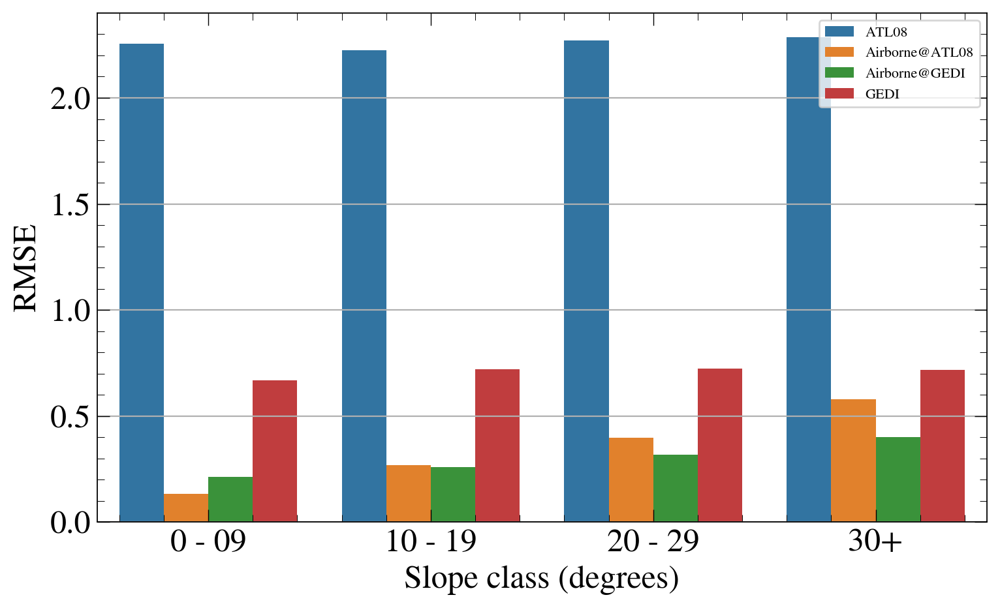

In [28]:
# -----------------------------------------------------------
# Plot R-squared by slope class and dataset (Spatial RF)
# -----------------------------------------------------------
plt.figure(figsize=(8, 5))
sns.barplot(
    data=results_df,
    x="slope_bin",
    y="RMSE_RF_spatial",
    hue="dataset"
)
plt.ylabel("RMSE")
plt.xlabel("Slope class (degrees)")
# plt.title("Spatial Random Forest performance across slope classes")
plt.legend(fontsize=8, loc="upper right")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# Plot R-squared by slope class and dataset (RF)
# ---------------------------------------------------
plt.figure(figsize=(8, 5))
sns.barplot(
    data=results_df,
    x="slope_bin",
    y="RMSE_RF",
    hue="dataset"
)
plt.ylabel("RMSE")
plt.xlabel("Slope class (degrees)")
# plt.title("Random Forest performance across slope classes")
plt.legend(fontsize=8, loc="upper right")
plt.tight_layout()
plt.show()


In [30]:
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"
# -------------------------------
# Read shapefile and match CRS
# -------------------------------
shapefile = gpd.read_file(shp)
# Reproject shapefile to raster CRS
shapefile = shapefile.to_crs("EPSG:6340")

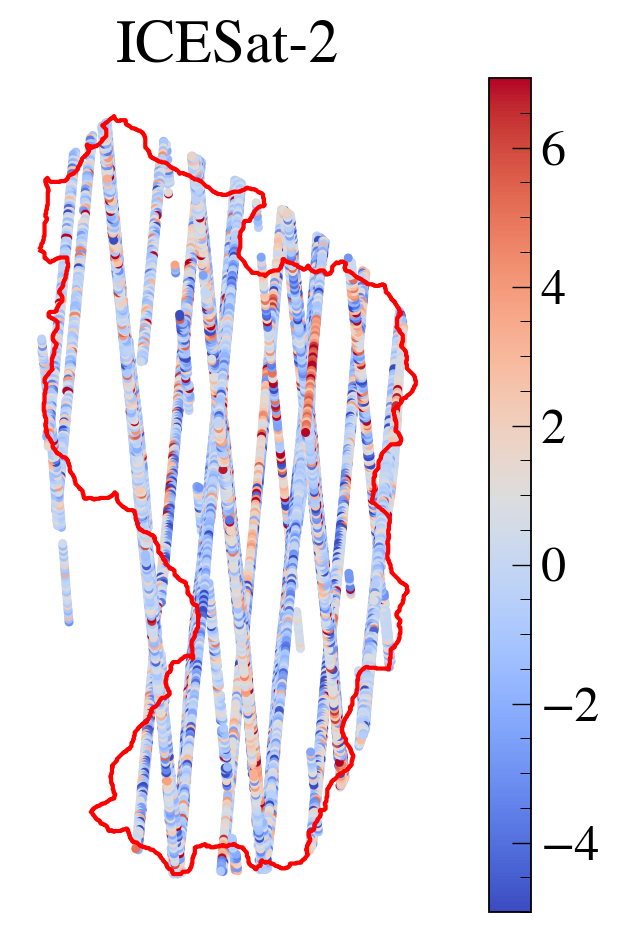

In [41]:
# Convert to GeoDataFrame
atl08_gdf = gpd.GeoDataFrame(
    atl08_resid_gdf,                         # your DataFrame
    geometry=gpd.points_from_xy(
        atl08_resid_gdf["Easting"],
        atl08_resid_gdf["Northing"]
    ),
    crs="EPSG:6340"
)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(6, 5))

atl08_gdf.plot(
    column="resid_srf",
    cmap="coolwarm",
    legend=True, vmin=-5, vmax=7, # vmin=-4, vmax=6,
    markersize=5,
    ax=ax
)

# Shapefile overlay 
shapefile.boundary.plot(ax=ax, edgecolor="red", linewidth=1.5)

ax.set_title("ICESat-2")
ax.set_axis_off()

plt.tight_layout()
plt.show()

In [37]:
# Make GeoDataFrames with residuals
atl08_air_resid_gdf = atl08X.loc[df_air_atl8["src_idx"]].copy()

atl08_air_resid_gdf["resid_rf"]  = df_air_atl8["resid_rf"].values
atl08_air_resid_gdf["resid_srf"] = df_air_atl8["resid_srf"].values


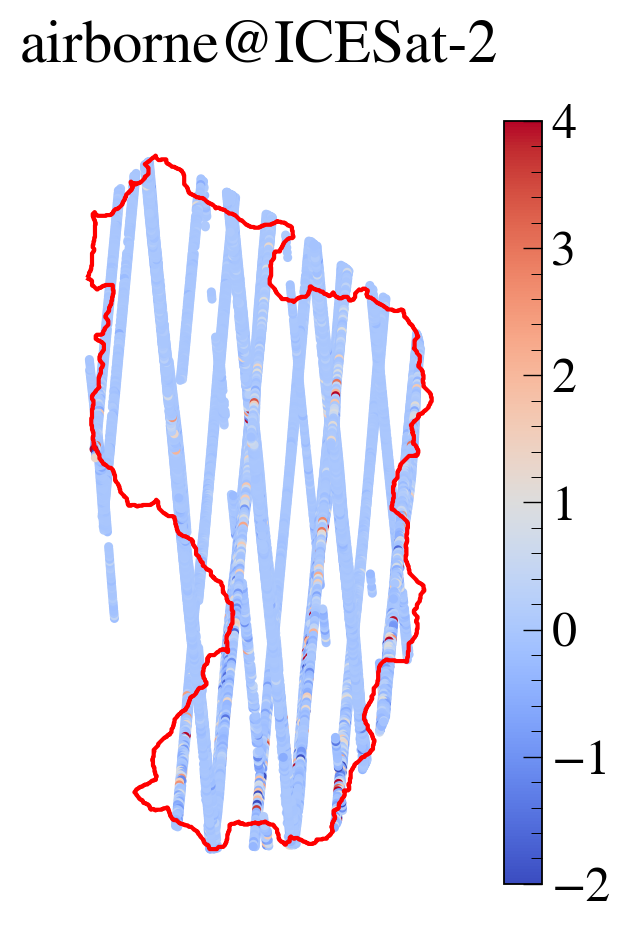

In [40]:
# Convert to GeoDataFrame
atl08_air_gdf = gpd.GeoDataFrame(
    atl08_air_resid_gdf,                         # your DataFrame
    geometry=gpd.points_from_xy(
        atl08_air_resid_gdf["Easting"],
        atl08_air_resid_gdf["Northing"]
    ),
    crs="EPSG:6340"
)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(6, 5))

atl08_air_gdf.plot(
    column="resid_srf",
    cmap="coolwarm",
    legend=True, vmin=-2, vmax=4,
    markersize=5,
    ax=ax
)

# Shapefile overlay 
shapefile.boundary.plot(ax=ax, edgecolor="red", linewidth=1.5)

ax.set_title("airborne@ICESat-2")
ax.set_axis_off()

plt.tight_layout()
plt.show()
